# Prüfung Actuarial Data Science Immersion - CPU-Notebook

__Autor:__ Martin Geiger
<br>__Datum der Prüfung:__ 14.04.2024 - 14.05.2024

## [Teil A: Hauspreise analysieren und einfach prognostizieren [70 Punkte]](#toc0_)

### [Aufgabe A-0: Bibliotheken, Funktionen, Datenstrukturen [Lernziele 2.2 & 3.3/3.4; 2 Punkte]](#toc0_)

#### Grundeinstellungen

In [1]:
environment = 'local'
use_gpu = False

#### Pakete

In [2]:
if environment == 'kaggle':
    !pip install packaging --upgrade --quiet --no-warn-conflicts
    !pip install shapely --upgrade --quiet --no-warn-conflicts
    !pip install geopandas --upgrade --quiet --no-warn-conflicts

In [3]:
from pathlib import Path
from time import time
from urllib.request import urlretrieve

import pandas as pd
import numpy as np
import geopandas as gpd

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import ListedColormap

import seaborn as sns

import locale

from statsmodels.formula.api import ols

from sklearn.cluster import KMeans, AgglomerativeClustering
if environment == 'local':
    from sklearn.metrics import root_mean_squared_error  # erst ab sklearn Version 1.4 verfügbar
else:
    from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler

from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor

import tensorflow as tf
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Input, Dense, Embedding, concatenate, Flatten
from tensorflow.keras.models import Model, clone_model, save_model
from tensorflow.keras.optimizers import Nadam
from tensorflow.keras.utils import set_random_seed

#### globale Variablen / Datenstrukturen, Verzeichnisse, Einstellungen

In [4]:
model_description = {}
model_rmse = {}
model_training_time = {}
model_test_rmse = {}

In [5]:
if environment == 'local':
    data_root = 'c:/Users/geige/OneDrive/Daten/DAV/Actuarial Data Science 3/Prüfung/Aufgaben/ADS_Immersion_Pruefung/Daten/'
    img_path = data_root+'img/'
    transfer_path = data_root+'transfer/'
elif environment == 'kaggle':
    data_root = '/kaggle/input/daten-ads3/'
    img_path = '/kaggle/working/img/'
    transfer_path = '/kaggle/working/transfer/'
    transfer_in_path = '/kaggle/input/transfer/'

Path(img_path).mkdir(parents=True, exist_ok=True)
Path(transfer_path).mkdir(parents=True, exist_ok=True)

In [6]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 100)
pd.set_option('display.width', 250)

locale.setlocale(locale.LC_NUMERIC, 'de_DE.UTF-8')
plt.rcParams['axes.formatter.use_locale'] = True

#### Hilfsfunktionen

In [7]:
if environment != 'local':
    def root_mean_squared_error(x, y):
        return mean_squared_error(x, y, squared=False)


def print_model_stats(local_model_name, test=False):
    if local_model_name in model_description:
        if test:
            print(f'RMSE auf Testdaten {round(model_test_rmse.get(local_model_name))} für {model_description.get(local_model_name)}')
        elif local_model_name in model_training_time:
            print(f'RMSE {round(model_rmse.get(local_model_name))} und Trainingszeit {round(model_training_time.get(local_model_name), 3)} Sekunden für {model_description.get(local_model_name)}')
        else:
            print(f'RMSE {round(model_rmse.get(local_model_name))} für {model_description.get(local_model_name)}')
    else:
        print(f'unbekanntes Modell {local_model_name}')


def plot_model_scatter(prediction, validation):
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.scatter(validation, prediction,
                marker='.', linewidths=0.1, edgecolor='darkblue', zorder=2)
    plt.plot([validation.min(), validation.max()], [validation.min(), validation.max()],
             color='red', linestyle='-', label='vorhergesagte Werte\n= tatsächliche Werte', zorder=3)
    plt.grid(visible=True, linestyle='--')
    plt.legend()
    plt.title('tatsächliche vs. vorhergesagte Werte')
    plt.xlabel('tatsächliche Werte')
    plt.ylabel('vorhergesagte Werte')

    plt.subplot(1, 2, 2)
    plt.scatter(prediction, validation-prediction,
                marker='.', linewidths=0.1, edgecolor='darkblue', zorder=2)
    plt.axhline(y=0,
                color='red', linestyle='-', label='Residuen 0', zorder=3)
    plt.grid(visible=True, linestyle='--')
    plt.legend()
    plt.title('Residuenplot')
    plt.xlabel('vorhergesagte Werte')
    plt.ylabel('Residuen')


def plot_model_hist(prediction, validation):
    plt.figure(figsize=(25, 5))
    plt.subplot(1, 3, 1)
    plt.hist(validation,
             bins=30, edgecolor='darkblue')
    plt.xlim(min(validation), max(validation))
    plt.title('Histogramm der tatsächlichen Werte')
    plt.xlabel('median_house_value')
    plt.ylabel('Anzahl')

    plt.subplot(1, 3, 2)
    plt.hist(prediction,
             bins=30, edgecolor='darkblue')
    plt.xlim(min(prediction), max(prediction))
    plt.title('Histogramm der vorhergesagten Werte')
    plt.xlabel('Schätzung median_house_value')
    plt.ylabel('Anzahl')

    plt.subplot(1, 3, 3)
    plt.hist(prediction[validation == 500001],
             bins=30, edgecolor='darkblue')
    plt.xlim(min(prediction), max(prediction))
    plt.title('Histogramm der vorhergesagten Werte für median_house_value = 500.001')
    plt.xlabel('Schätzung median_house_value')
    plt.ylabel('Anzahl')


def list_feature_importance(model, columns):
    feature_importance = pd.DataFrame({'Merkmal': columns, 'Importance': model.get_feature_importance(
    )}).sort_values(by='Importance', ascending=False)
    for _, row in feature_importance.iterrows():
        print(f'Feature Importance von {row["Merkmal"]}: {row["Importance"]}')

### [Aufgabe A-1: Datensatz einlesen und prüfen [Lernziele 3.3/3.4; 5 Punkte]](#toc0_)

#### Aufgabenteil A-1a
Der zur Verfügung gestellte Datensatz ist einzulesen. Im Anschluss sind die Anzahl an Zeilen und Spalten sowie sieben zufällige Zeilen auszugeben.

Daten einlesen:

In [8]:
housing_sample = pd.read_csv(data_root+'california_housing_county_sample-de.csv', decimal=',', sep=';')

Ausgabe von Zeilen- bzw. Spaltenanzahl und sieben zufälligen Zeilen:

In [9]:
np.random.seed(42) # Zur Reproduzierbarkeit
print(f'Anzahl der Zeilen: {len(housing_sample)}')
print(f'Anzahl der Spalten: {len(housing_sample.columns)}')
print('Beispieldatensätze:')
print(housing_sample.sample(n=7))

Anzahl der Zeilen: 20640
Anzahl der Spalten: 12
Beispieldatensätze:
       latitude  longitude  housing_median_age  total_rooms  total_bedrooms  population  households  median_income  median_house_value ocean_proximity    county_name sample
20046     39.51    -121.56                  46         1885           385.0         871         347         1.6352               53100          INLAND          Butte      A
3024      33.77    -117.23                   5         2108           496.0        1666         461         2.0000               83000          INLAND      Riverside      A
15663     37.74    -122.50                  45         1771           349.0        1098         342         3.7552              296600      NEAR OCEAN  San Francisco      C
20484     40.78    -124.16                  43         2241           446.0         932         395         2.9038               82000      NEAR OCEAN       Humboldt      A
9814      34.20    -118.87                  26         1924        

#### Aufgabenteil A-1b
Die Datentypen des eingelesenen Datensatzes sind auszugeben, zu prüfen und zu kommentieren. Nominale Merkmale sollen den Datentyp für Kategorien (Python: category, R: factor) erhalten. Gegebenenfalls erforderliche Anpassungen sind durchzuführen und die finalen Datentypen sind auszugeben.

Ausgabe der initialen Datentypen:

In [10]:
print(housing_sample.dtypes)

latitude              float64
longitude             float64
housing_median_age      int64
total_rooms             int64
total_bedrooms        float64
population              int64
households              int64
median_income         float64
median_house_value      int64
ocean_proximity        object
county_name            object
sample                 object
dtype: object


Abgesehen von __ocean_proximity__, __county_name__ und __sample__ wurden alle Merkmale als numerisch erkannt. Für die Merkmale __latitude__, __longitude__ und __median_income__ ist anhand der Beispielsätze aus [Aufgabenteil A-1a](#aufgabenteil-a-1a) ersichtlich, dass hier Nachkommastellen in den Daten enthalten sind, weshalb diese als Float und nicht als Integer eingelesen wurden. Für das Merkmal __total_bedrooms__ ist anhand der Beispieldaten nicht direkt ersichtlich, warum hier Float gewählt wurde. Ein Blick in die .csv-Datei zeigt jedoch fehlende Werte, die nicht als _int64_ gespeichert werden können. Im Folgenden wird geprüft, ob "echte" Float-Werte in __total_bedrooms__ vorliegen.

In [11]:
no_total_bedrooms_int = housing_sample['total_bedrooms'][housing_sample['total_bedrooms'].notnull() &
                                                         housing_sample['total_bedrooms'].apply(float.is_integer)].count()
no_total_bedrooms_null = housing_sample['total_bedrooms'].isnull().sum()
print(f'Anzahl der Datensätze mit Integer-Werte in total_bedrooms: {no_total_bedrooms_int}')
print(f'Anzahl der Datensätze mit fehlenden Werten für total_bedrooms: {no_total_bedrooms_null}')
print(f'Anzahl der Datensätze mit "echten" Float-Werten in total_bedrooms: {len(housing_sample)-no_total_bedrooms_int-no_total_bedrooms_null}')

Anzahl der Datensätze mit Integer-Werte in total_bedrooms: 20433
Anzahl der Datensätze mit fehlenden Werten für total_bedrooms: 207
Anzahl der Datensätze mit "echten" Float-Werten in total_bedrooms: 0


Der Datentyp Float für __total_bedrooms__ ist also auf die fehlenden Werte zurückzuführen, die nicht als _int64_ abgebildet werden können, es liegen keine "echten" Float-Werte vor. Alternativ könnte für __total_bedrooms__ der Datentyp _Int64_ verwendet werden, der auch fehlende Werte abbilden kann, was aber zu Kompatibilitätsproblemen bei der Verwendung von numpy-Funktionen führen könnte, weshalb __total_bedrooms__ als Float weiterverwendet wird.

Es werden nun also nur die drei _object_-Merkmale __ocean_proximity__, __county_name__ und __sample__ zu _category_ umgewandelt.

In [12]:
for merkmal in ['ocean_proximity', 'county_name', 'sample']:
    housing_sample[merkmal] = housing_sample[merkmal].astype('category')

Somit ergeben soch die folgenden Datentypen:

In [13]:
print(housing_sample.dtypes)

latitude               float64
longitude              float64
housing_median_age       int64
total_rooms              int64
total_bedrooms         float64
population               int64
households               int64
median_income          float64
median_house_value       int64
ocean_proximity       category
county_name           category
sample                category
dtype: object


#### Aufgabenteil A-1c
Das Merkmal __sample__, das fest vorgegebene Stichproben für das spätere Trainieren (A), Validieren (B) und Testen (C) der Modelle definiert, ist auszuzählen und die Stichprobengrößen sind zu kommentieren.

Die absolute Aufteilung in Trainings-, Validierungs- und Testdaten ist:

In [14]:
print(housing_sample['sample'].value_counts())

sample
A    14421
B     3110
C     3109
Name: count, dtype: int64


Dies entspricht einer relativen Aufteilung von:

In [15]:
print(f'Anteil Trainingsdaten: {int(round(100*housing_sample["sample"].value_counts()["A"]/len(housing_sample)))}%')
print(f'Anteil Validierungsdaten: {int(round(100*housing_sample["sample"].value_counts()["B"]/len(housing_sample)))}%')
print(f'Anteil Testdaten: {int(round(100*housing_sample["sample"].value_counts()["C"]/len(housing_sample)))}%')

Anteil Trainingsdaten: 70%
Anteil Validierungsdaten: 15%
Anteil Testdaten: 15%


Die Daten werden gemäß __sample__ also in 70% Trainingsdaten, 15% Validierungsdaten und 15% Testdaten aufgeteilt. Diese 70-15-15-Aufteilung ist nicht ungewöhnlich und ähnelt anderen üblichen Aufteilungen, wie 80-10-10 oder 70-20-10.

### [Aufgabe A-2: Numerische Merkmale analysieren, aufbereiten und visualisieren [Lernziele 3.3/3.4 & 5.2; 19 Punkte]](#toc0_)

#### Aufgabenteil A-2a
Für die numerische Merkmale sind mindestens die Kennzahlen count, mean, std, min/max sowie die das 25%-, 50%- und 75%-Quantil auszugeben. Zudem soll ermittelt werden, bei welchen Merkmalen fehlende Werte (und falls ja, in welcher absoluten und prozentualen Größenordnung) vorliegen.

Die Kennzahlen count, mean, std, min/max sowie die das 25%-, 50%- und 75%-Quantil können gesammelt über die _describe()_-Funktion ausgegeben werden:

In [16]:
housing_sample.describe()

,latitude,longitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,35.631861,-119.569704,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.135952,2.003532,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,32.540000,-124.350000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,33.930000,-121.800000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,34.260000,-118.490000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,37.710000,-118.010000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,41.950000,-114.310000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


Für ausgegebenen Merkmale außer __total_bedrooms__ ist count = 20.640, was der Anzahl der Datensätze entspricht (siehe [Aufgabenteil A-1a](#aufgabenteil-a-1a)). Neben den bereits in [Aufgabenteil A-1b](#aufgabenteil-a-1b) aufgefallenen fehlenden Werten in __total_bedrooms__ treten also in keinem weiteren numerischen Merkmal fehlende Werte auf.

Da die kategoriellen Merkmale damit noch nicht abgedeckt sind, werden diese noch gesondert geprüft und dabei auch die Anzahl und der Anteil der fehlenden Werte für __total_bedrooms__ ermittelt:

In [17]:
for merkmal in ['total_bedrooms', 'ocean_proximity', 'county_name', 'sample']:
    print(f'{housing_sample[merkmal].isnull().sum()} fehlende Werte in {merkmal}, das entspricht {round(100*housing_sample[merkmal].isnull().sum()/len(housing_sample), 2)}% der Datensätze.')

207 fehlende Werte in total_bedrooms, das entspricht 1.0% der Datensätze.
0 fehlende Werte in ocean_proximity, das entspricht 0.0% der Datensätze.
0 fehlende Werte in county_name, das entspricht 0.0% der Datensätze.
0 fehlende Werte in sample, das entspricht 0.0% der Datensätze.


#### Aufgabenteil A-2b
Anhand des Datensatzes ist zu begründen und geeignet grafisch zu visualisieren, warum eine Ersetzung der fehlenden Werte bei __total_bedrooms__ durch den Median nicht empfehlenswert ist (mindestens zwei konkrete Zeilen des Datensatzes sind als Beispiele auszugeben) und was für einen Bezug auf __total_rooms__ spricht. Im Anschluss sind für das Feature __total_bedrooms__ die fehlenden Werte durch den mittleren Quotienten zwischen __total_bedrooms__ und __total_rooms__ (berechnet auf Basis der Datensätze ohne fehlende Werte) zu ersetzen. Die Ersetzung ist geeignet zu verifizieren.

Um die Eignung des Medians zu beurteilen, wird zunächst ein Boxplot sowie ein Histogramm für __total_bedrooms__ erstellt.

Text(0, 0.5, 'Anzahl der Datensätze')

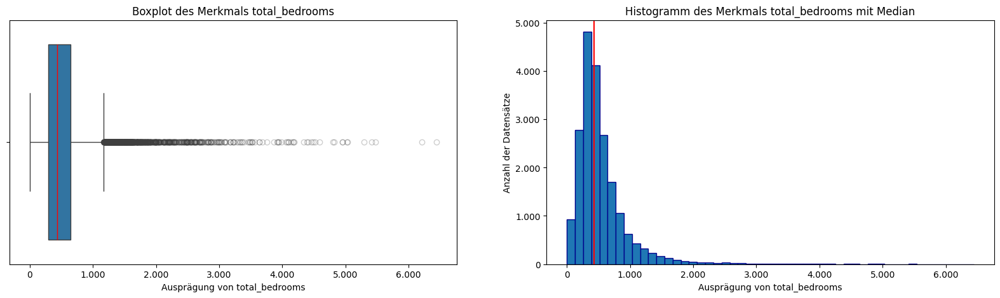

In [18]:
plt.figure(figsize=(20, 5))
plt.subplot(1, 2, 1)
sns.boxplot(x=housing_sample['total_bedrooms'].dropna(), orient='h', flierprops={'alpha': 0.25}, medianprops={'color': 'red'})
plt.title('Boxplot des Merkmals total_bedrooms')
plt.xlabel('Ausprägung von total_bedrooms')

plt.subplot(1, 2, 2)
plt.hist(housing_sample['total_bedrooms'], bins=50, edgecolor='darkblue')
plt.axvline(housing_sample['total_bedrooms'].quantile(0.5), color='red')
plt.title('Histogramm des Merkmals total_bedrooms mit Median')
plt.xlabel('Ausprägung von total_bedrooms')
plt.ylabel('Anzahl der Datensätze')

Die beiden Plots zeigen, dass __total_bedrooms__ linksschief verteilt und stark gestreut ist. Das hat zur Folge, dass der Median nicht gut geeignet ist, um fehlende Werte zu ersetzen. Um dies weiter zu veranschaulichen wird der Median von __total_bedrooms__ ermittelt und mit dem Maximum bzw. Minimum von __total_rooms__ unter den Daten ohne __total_bedrooms__ verglichen.

In [19]:
total_bedrooms_null = housing_sample[housing_sample['total_bedrooms'].isnull()]
print(f'Median von total_bedrooms: {housing_sample["total_bedrooms"].median()}')
print(f'Maximum von total_rooms ohne total_bedrooms {total_bedrooms_null["total_rooms"].max()}')
print(f'Minimum von total_rooms ohne total_bedrooms {total_bedrooms_null["total_rooms"].min()}')

Median von total_bedrooms: 435.0
Maximum von total_rooms ohne total_bedrooms 11709
Minimum von total_rooms ohne total_bedrooms 154


Somit würden bei der Nutzung des Medians für die fehlenden Werte von __total_bedrooms__ in einem Datensatz mit 11709 __total_rooms__ und einem Datensatz mit 154 __total_rooms__ der gleiche Wert für __total_bedrooms__ eingesetzt. Dabei würden im Falle des Minimums sogar fast dreimal so viele __total_bedrooms__ wie __total_rooms__ angenommen werden. 

Die Werte gehören zu den folgenden Datensätzen:

In [20]:
print(total_bedrooms_null[(total_bedrooms_null['total_rooms'] == total_bedrooms_null['total_rooms'].max()) |
                          (total_bedrooms_null['total_rooms'] == total_bedrooms_null['total_rooms'].min())])

       latitude  longitude  housing_median_age  total_rooms  total_bedrooms  population  households  median_income  median_house_value ocean_proximity  county_name sample
11648     35.42    -119.11                  52          154             NaN          37          16        10.0263              200000          INLAND         Kern      A
14272     37.43    -122.15                  20        11709             NaN        7604        3589         1.9045              375000        NEAR BAY  Santa Clara      A


Um den Quotienten aus __total_bedrooms__ und __total_rooms__ zu bewerten, wird zunächst ein Scatterplot für die beiden Merkmale erstellt.

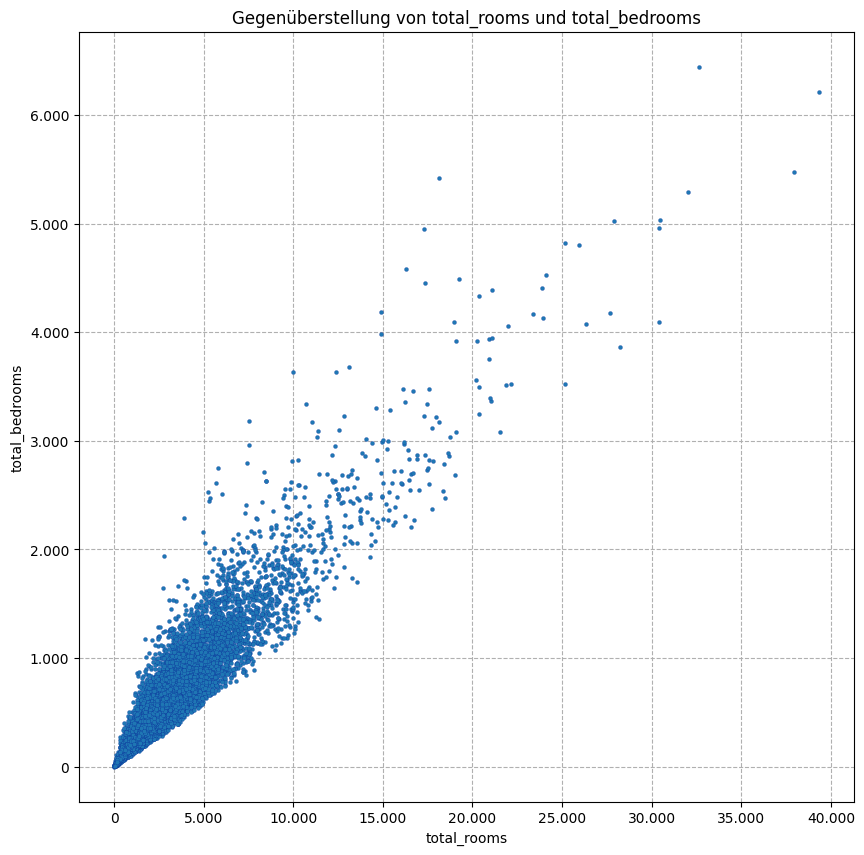

In [21]:
plt.figure(figsize=(10, 10))
plt.scatter(housing_sample['total_rooms'],
            housing_sample['total_bedrooms'],
            marker='.', linewidths=0.1, edgecolor='darkblue', zorder=2)
plt.title('Gegenüberstellung von total_rooms und total_bedrooms')
plt.xlabel('total_rooms')
plt.ylabel('total_bedrooms')
plt.grid(visible=True, linestyle='--')

In dem Scatterplot ist, insbesondere in dem für die Ersetzung relevanten unteren Bereich bis ca. 10.000 __total_rooms__, ein linearer Zusammenhang zwischen __total_bedrooms__ und __total_rooms__ erkennbar. Der Quotient der beiden Merkmale wird nun für die Datensätze mit bekannten __total_bedrooms__ in dem neuen Merkmal __room_quotient__ berechnet, für Die Datensätze ohne __total_bedrooms__ bleibt __room_quotient__ im ersten Schritt unbelegt. Da in [Aufgabenteil A-2a](#aufgabenteil-a-2a) bereits das Minimum von __total_rooms__ als 2 bestimmt wurde, ist eine Prüfung auf 0 vor der Division nicht nötig. Für dieses neue Merkmal wird anschließend der Mittelwert bestimmt.

In [22]:
housing_sample['room_quotient'] = np.where(housing_sample['total_bedrooms'].notnull(), 
                                           housing_sample['total_bedrooms']/housing_sample['total_rooms'], 
                                           np.nan)
mean_room_quotient = housing_sample['room_quotient'].mean()
print(f'Mean room_quotient: {mean_room_quotient}')

Mean room_quotient: 0.2130388304808513


Vor dem Einsetzen der aus dem mittleren Quotienten errechneten Werte folgt zunächst eine kurze Plausibilisierung. Dazu werden die einzusetzenden Werte zusätzlich in den Scatterplot für __total_rooms__ und __total_bedrooms__ eingezeichnet.

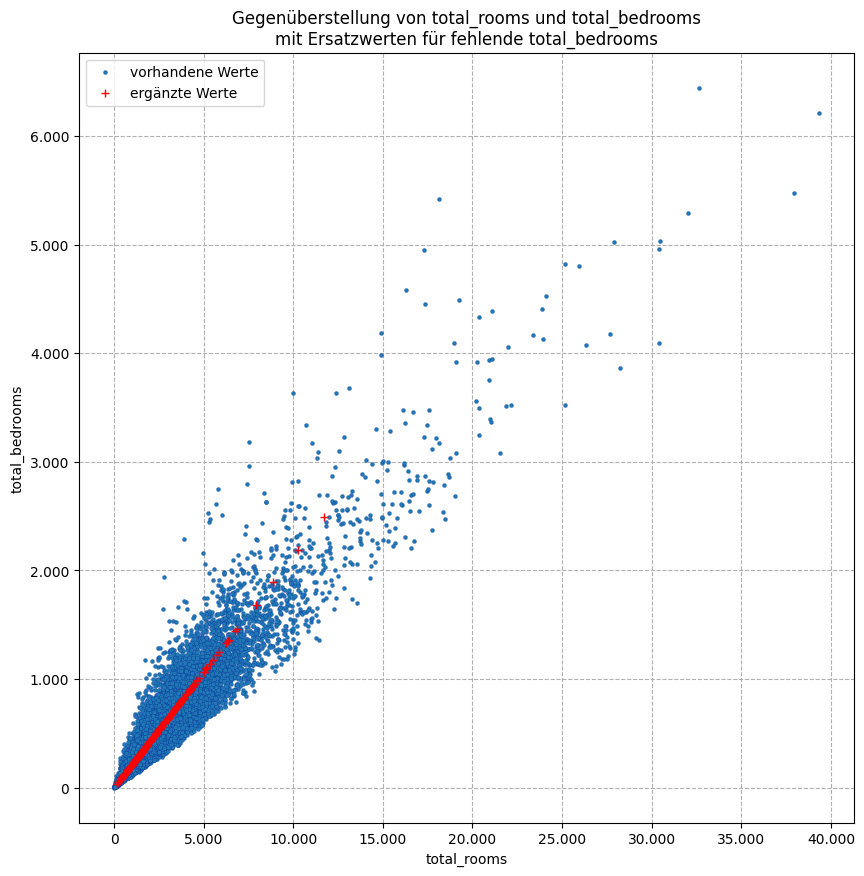

In [23]:
plt.figure(figsize=(10, 10))
plt.scatter(housing_sample['total_rooms'],
            housing_sample['total_bedrooms'],
            marker='.', linewidths=0.1, edgecolor='darkblue', label='vorhandene Werte', zorder=2)
plt.scatter(housing_sample['total_rooms'][housing_sample['total_bedrooms'].isnull()],
            mean_room_quotient * housing_sample['total_rooms'][housing_sample['total_bedrooms'].isnull()],
            color='red', marker='+', linewidths=1, label='ergänzte Werte', zorder=3)
plt.title('Gegenüberstellung von total_rooms und total_bedrooms\nmit Ersatzwerten für fehlende total_bedrooms')
plt.xlabel('total_rooms')
plt.ylabel('total_bedrooms')
plt.legend()
plt.grid(visible=True, linestyle='--')

Die zusätzichen Werte für __total_bedrooms__ passen anscheinend zu den vorhandenen Daten und können nun auch eingesetzt werden.

In [24]:
housing_sample['total_bedrooms'] = housing_sample['total_bedrooms'].fillna(mean_room_quotient * housing_sample['total_rooms'])
print('Anzahl Datensätze ohne total_bedrooms:')
print(len(housing_sample[housing_sample['total_bedrooms'].isnull()]))

Anzahl Datensätze ohne total_bedrooms:
0


Da das neue Merkmal __room_quotient__ für die Datensätze ohne __total_bedrooms__ nicht belegt wurde, kann es nun genutzt werden, um diese wieder zu identifizieren:

In [25]:
print('Datensätze, in denen total_bedrooms ergänzt wurde:')
print(housing_sample[['total_bedrooms', 'total_rooms']][housing_sample['room_quotient'].isnull()])

Datensätze, in denen total_bedrooms ergänzt wurde:
       total_bedrooms  total_rooms
161        164.252938          771
312        106.519415          500
362        281.424295         1321
432        439.073030         2061
500        739.883858         3473
...               ...          ...
20320      211.760597          994
20344     1138.266471         5343
20366      115.893124          544
20522      891.141428         4183
20544      304.432489         1429

[207 rows x 2 columns]


Schließlich wird __room_quotient__ wieder aus dem Dataframe entfernt.

In [26]:
reduced_housing_sample = housing_sample.drop(columns=['room_quotient'], inplace=True)

#### Aufgabenteil A-2c
Zu den bereits vorhandenen Merkmalen sollen noch die folgenden Merkmale zum Datensatz hinzugefügt werden:

- __bedrooms_per_house__ = __total_bedrooms__ / __households__
- __rooms_per_house__ = __total_rooms__ / __households__

Die Berechnung ist an zwei ausgewählten Datensätzen zu demonstrieren.

Da in [Aufgabenteil A-2a](#aufgabenteil-a-2a) bereits das Minimum von __households__ als 1 bestimmt wurde, ist eine Prüfung auf 0 vor der Division nicht nötig.

In [27]:
housing_sample['bedrooms_per_house'] = housing_sample['total_bedrooms'] / housing_sample['households']
housing_sample['rooms_per_house'] = housing_sample['total_rooms'] / housing_sample['households']
print(housing_sample)

       latitude  longitude  housing_median_age  total_rooms  total_bedrooms  population  households  median_income  median_house_value ocean_proximity county_name sample  bedrooms_per_house  rooms_per_house
0         32.54    -117.04                   7          938           297.0        1187         282         1.2667               67500      NEAR OCEAN   San Diego      C            1.053191         3.326241
1         32.55    -117.09                   8         6533          1217.0        4797        1177         3.9583              144400      NEAR OCEAN   San Diego      C            1.033985         5.550552
2         32.55    -117.06                   5         3223           940.0        3284         854         1.4384              108800      NEAR OCEAN   San Diego      A            1.100703         3.774005
3         32.55    -117.04                  15         2206           648.0        2511         648         1.6348               93200      NEAR OCEAN   San Diego      A   

Die Berechnung wird an den Datensätzen 0 und 42 demonstriert, die Ergebnisse werden dabei auf sechs Nachkommastellen gerundet, um sie an die Darstellung der Vergleichswerte anzugleichen.

In [28]:
print('aus den Datensätzen 0 und 42:')
print(housing_sample.loc[[0, 42], ['total_rooms', 'total_bedrooms', 'households', 'bedrooms_per_house', 'rooms_per_house']])

print('Berechnung für Datensatz 0:')
print(f'\tbedrooms_per_house = {housing_sample["total_bedrooms"][0]} / {housing_sample["households"][0]} = {round(housing_sample["total_bedrooms"][0]/housing_sample["households"][0], 6)}')
print(f'\trooms_per_house = {housing_sample["total_rooms"][0]} / {housing_sample["households"][0]} = {round(housing_sample["total_rooms"][0]/housing_sample["households"][0], 6)}')

print('Berechnung für Datensatz 42:')
print(f'\tbedrooms_per_house = {housing_sample["total_bedrooms"][42]} / {housing_sample["households"][42]} = {round(housing_sample["total_bedrooms"][42]/housing_sample["households"][42], 6)}')
print(f'\trooms_per_house = {housing_sample["total_rooms"][42]} / {housing_sample["households"][42]} = {round(housing_sample["total_rooms"][42]/housing_sample["households"][42], 6)}')

aus den Datensätzen 0 und 42:
    total_rooms  total_bedrooms  households  bedrooms_per_house  rooms_per_house
0           938           297.0         282            1.053191         3.326241
42         1662           377.0         386            0.976684         4.305699
Berechnung für Datensatz 0:
	bedrooms_per_house = 297.0 / 282 = 1.053191
	rooms_per_house = 938 / 282 = 3.326241
Berechnung für Datensatz 42:
	bedrooms_per_house = 377.0 / 386 = 0.976684
	rooms_per_house = 1662 / 386 = 4.305699


#### Aufgabenteil A-2d
Die numerischen Merkmale sind zusammen mit einem Kerndichteschätzer zu visualisieren und die Ausgaben zu kommentieren.

Zur Visualisierung wird für jedes Merkmal ein Histogramm erstellt, in das zusätzlich der Kerndichteschätzer und die 1%-, 5%-, 25%-, 50%-, 75%-, 95%- und 99%-Quantile eingezeichnet werden. Der Wertebereich der x-Achse wird jeweils auf das Intervall vom Minimum bis zum Maximum der Daten festgelegt.

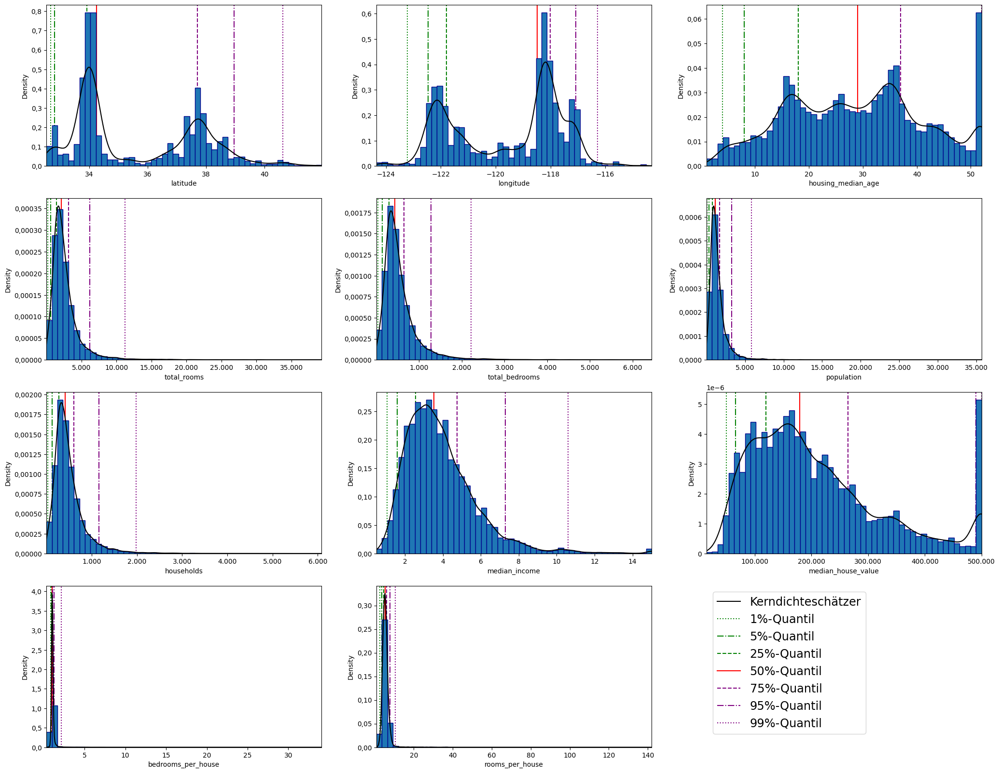

In [29]:
fig = plt.figure(figsize=(25, 20))
for index_merkmal, merkmal in enumerate(['latitude', 'longitude', 'housing_median_age', 'total_rooms', 'total_bedrooms', 'population', 'households', 'median_income', 'median_house_value', 'bedrooms_per_house', 'rooms_per_house']):
    plt.subplot(4, 3, index_merkmal+1)
    plt.hist(housing_sample[merkmal], bins=50,
             edgecolor='darkblue', density=True, zorder=2)
    housing_sample[merkmal].plot(
        kind='kde', color='black', label='Kerndichteschätzer', zorder=3)
    plt.axvline(housing_sample[merkmal].quantile(0.01),
                 color='green', linestyle='dotted', label='1%-Quantil', zorder=1)
    plt.axvline(housing_sample[merkmal].quantile(0.05), 
                color='green', linestyle='dashdot', label='5%-Quantil', zorder=1)
    plt.axvline(housing_sample[merkmal].quantile(0.25), 
                color='green', linestyle='dashed', label='25%-Quantil', zorder=1)
    plt.axvline(housing_sample[merkmal].quantile(0.5), 
                color='red', linestyle='solid', label='50%-Quantil', zorder=1)
    plt.axvline(housing_sample[merkmal].quantile(0.75), 
                color='purple', linestyle='dashed', label='75%-Quantil', zorder=1)
    plt.axvline(housing_sample[merkmal].quantile(0.95), 
                color='purple', linestyle='dashdot', label='95%-Quantil', zorder=1)
    plt.axvline(housing_sample[merkmal].quantile(0.99), 
                color='purple', linestyle='dotted', label='99%-Quantil', zorder=1)
    plt.xlim(min(housing_sample[merkmal]), max(housing_sample[merkmal]))
    plt.xlabel(merkmal)

labels = []
handles = []
for ax in fig.axes:
    ax_handles, ax_labels = ax.get_legend_handles_labels()
    handles.extend(ax_handles)
    labels.extend(ax_labels)
labels_handles = dict(zip(labels, handles))
plt.subplot(4, 3, 12)
plt.axis('off')
plt.legend(labels_handles.values(), labels_handles.keys(),
           bbox_to_anchor=(0.6, 1), fontsize='xx-large')

<u>__latitude__ und __longitude__</u><br>
In den Längen und Breitengraden sind jeweils zwei Bereiche erkennbar, in denen ein Großteil der Daten liegt. Dabei handelt es sich vermutlich um die beiden Ballungszentren Los Angeles und San Francisco.

<u>__housing_median_age__</u><br>
Für das Median Alter der Häuser im Bezirk sind im Bereich von 15 bis 35 Jahren drei Spitzen erkennbar. Im Histogramm zeigen sich zudem zwei leichtere Spitzen in den Bereichen um 5 bzw. 45 Jahre. Dies deutet auf einen ca. 10-jährigen Zyklus verstärkter Neubauten hin. Zudem gibt es eine extreme Spitze jenseits von 50 Jahren. Diese passt zwar zu dem gleichen ca. 10-jährigen Bauzyklus, es fehlt jedoch das Abflachen nach dieser Phase, das bei den restlichen Zyklen erkennbar ist. Hier liegt die Vermutung nahe, dass alle Häuser, die vor einem gewissen Jahr erbaut wurden, mit einem Baujahr zusammengefasst werden. Da die Aggregation mit der Daten mit dem Stand der Wahlbezirke des Jahres 1992 durchgeführt wurde, handelt es sich dabei vermutlich um alle vor 1940 erbauten Häuser.

<u>__total_rooms__, __total_bedrooms__, __population__ und __households__</u><br>
Bei Anzahl der Räume, Anzahl der Schlafzimmer, Bevölkerungsanzahl und Anzahl der Haushalte liegt jeweils ein Großteil der Daten am unteren Rand des Wertebereichs und es gibt jeweils extreme Ausreißer bis ca. hin zum dreifachen des 99%-Quantils für die Anzahl der Räume, Schlafzimmer und Haushalte und bis zum ca. siebenfachen des 99%-Quantils für die Bevölkerungsanzahl.

<u>__median_income__</u><br>
Vermutlich handelt es sich entweder um Angaben in 1.000 Dollar Monatseinkommen oder in 10.000 Dollar Jahreseinkommen. Das Median Einkommen liegt für einen Großteil der Datensätze in der unteren Hälfte des Wertebereichs mit einer leichten Spitze im Bereich über 10.000 Dollar/Monat bzw. 100.000 Dollar/Jahr. Am oberen Ende des Wertebereichs gibt es nochmal eine kleine Spitze, hierbei könnte aber auch der Bereich über 15.000 Dollar/Monat bzw. 150.000 Dollar/Jahr als 15.0001 (das Maximum in den Daten) zusammengefasst sein.

<u>__median_house_value__</u><br>
Der Median Wert der Häuser im Bezirk ist leicht linksschief mit leichten Unregelmäßigkeiten, die darauf hindeuten könnten, dass gewisse Kaufpreise bevorzugt oder vermieden werden, bzw. Preisverhandlungen eher bei "runden" Beträgen enden. Zudem gibt es eine extreme Spitze bei 500.000, hier könnte es sich um eine Zusammenfassung von Werten über 500.000 als 500.001 (das Maximum in den Daten) handeln.

<u>__bedrooms_per_house__ und __rooms_per_house__</u><br>
Bei den beiden berechneten Merkmalen zeigt sich ein ähnliches Bild, wie bei __total_rooms__, __total_bedrooms__, __population__ und __households__, allerdings mit einem deutlich extremerem Verhältnis zwischen 99%-Quantil und Maximum. Das impliziert, dass die Ausreißer in __total_rooms__ und __total_bedrooms__ nicht mit den Ausreißern in __housekolds__ zusammenfallen.

#### Aufgabenteil A-2e

Die Korrelationen der numerischen Merkmale sind zu berechnen und zu visualisieren. Im Anschluss ist auf Basis dieser Ergebnisse zu begründen, warum die Merkmale __households__, __total_rooms__, __total_bedrooms__ und __bedrooms_per_house__ aus dem Datensatz entfernt werden können. Das ist im Anschluss durchzuführen. Im Anschluss sind die Korrelationen der verbleibenden Merkmale erneut zu plotten.

Text(0.5, 1.0, 'Korrelationsmatrix der numerischen Merkmale')

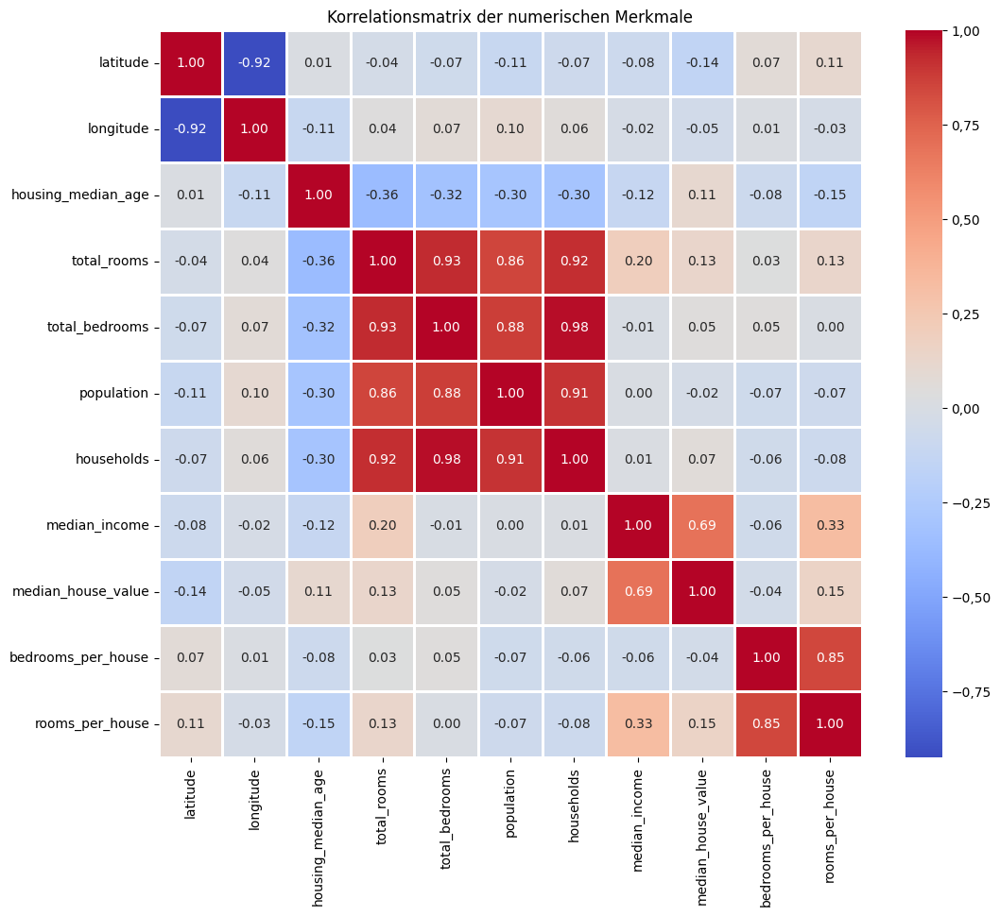

In [30]:
full_correlation = housing_sample.corr(numeric_only=True)
plt.figure(figsize=(12, 10))
sns.heatmap(full_correlation, annot=True, cmap='coolwarm', fmt=".2f", linewidths=1)
plt.title('Korrelationsmatrix der numerischen Merkmale')

Die Merkmale __total_rooms__, __total_bedrooms__, __population__ und __households__ sind stark (Korrelation von >=0,86) korreliert. Wenn ein Modell mit allen vier Merkmalen trainiert wird, besteht die Gefahr des Overfittings, während einem Modell mit nur einem der Merkmale durch die hohe Korrelation bereits fast den gleichen Informationsgehalt zur Verfügung steht. Zudem wird durch das Entfernen der Merkmale die Modellkomplexität reduziert. Gleiches gilt für die beiden berechneten Merkmale __bedrooms_per_house__ und __rooms_per_house__ (Korrelation 0,85). Somit können aus beiden Gruppen alle bis auf jeweils ein Merkmal entfernt werden. Die Entscheidung, die beiden Merkmale __population__ und __rooms_per_house__ zu behalten erscheint sinnvoll, da diese Daten für eine Prognose auf Basis des fertigen Modells wahrscheinlich am einfachsten zu ermitteln wären.

Text(0.5, 1.0, 'Korrelationsmatrix der übrigen numerischen Merkmale')

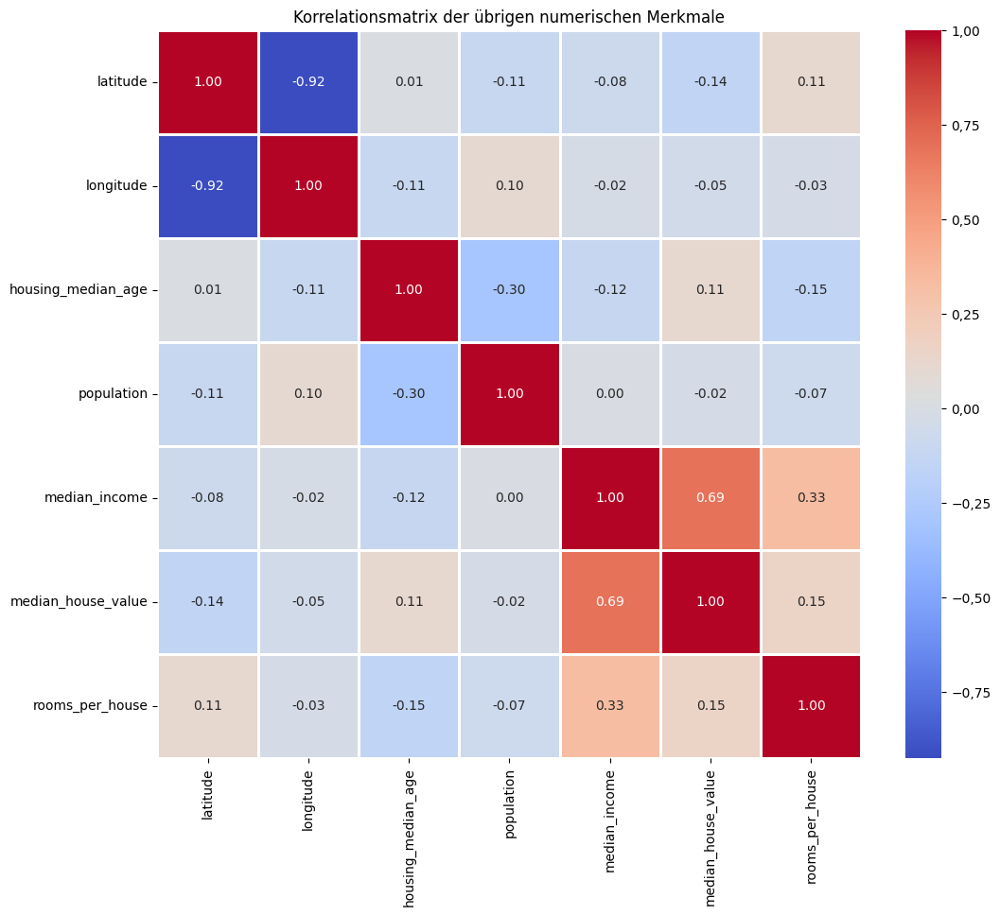

In [31]:
reduced_housing_sample = housing_sample.drop(columns=['households', 'total_rooms', 'total_bedrooms', 'bedrooms_per_house'])
reduced_correlation = reduced_housing_sample.corr(numeric_only=True)
plt.figure(figsize=(12, 10))
sns.heatmap(reduced_correlation, annot=True, cmap='coolwarm', fmt=".2f", linewidths=1)
plt.title('Korrelationsmatrix der übrigen numerischen Merkmale')

### [Aufgabe A-3: Hauspreise sowie regionale Strukturen untersuchen und visualisieren [Lernziele 3.3/3.4 & 5.2; 10 Punkte]](#toc0_)

#### Aufgabenteil A-3a
Visualisieren Sie den Datensatz mit Hilfe der Karte von Kalifornien (siehe:
https://github.com/ageron/handson-ml3/blob/main/02_end_to_end_machine_learning_project.ipynb) und den folgenden Merkmalen:
- __median_house_value__
- __housing_median_age__
- __median_income__

Die Ergebnisse sind zu kommentieren und zu interpretieren

Download der Karte von Kalifornien, analog zum angegebenen Beispiel.

In [32]:
filename = 'california.png'

if not (Path(img_path)/filename).is_file():
    homl3_root = "https://github.com/ageron/handson-ml3/raw/main/"
    url = homl3_root + "images/end_to_end_project/" + filename
    print(f'{filename} wird heruntergeladen')
    urlretrieve(url, Path(img_path) / filename)
    if (Path(img_path)/filename).is_file():
        print('Download abgeschlossen')
    else:
        print('Download fehlgeschlagen')
else:
    print(f'{filename} bereits vorhanden')

california.png bereits vorhanden


Zunächst werden zwei Scatterplots über der Karte von Kalifornien erzeugt, die die Merkmale __median_income__ bzw. __housing_median_age__ durch die Größe der Punkte abbilden. Dabei wird __median_income__ mit Faktor 10 und __housing_median_age__ mit Faktor 3 skaliert, damit die Größenunterschiede innerhalb der Grafiken besser erkennbar werden und die Abbildung der Maxima für beide Merkmale ähnlich ist (10x15,0001 für __median_income__ und 3x52 für __housing_median_age__). Zusätzlich werden die Daten jeweils absteigend nach dem über die Größe der Punkte abgebildeten Merkmal sortiert, da die kleinen Ausprägungen sonst durch benachbarte große Werte überlagert würden.<br>
Das Merkmal __median_house_value__ wird in beiden Grafiken über die Farbe der Punkte dargestellt.

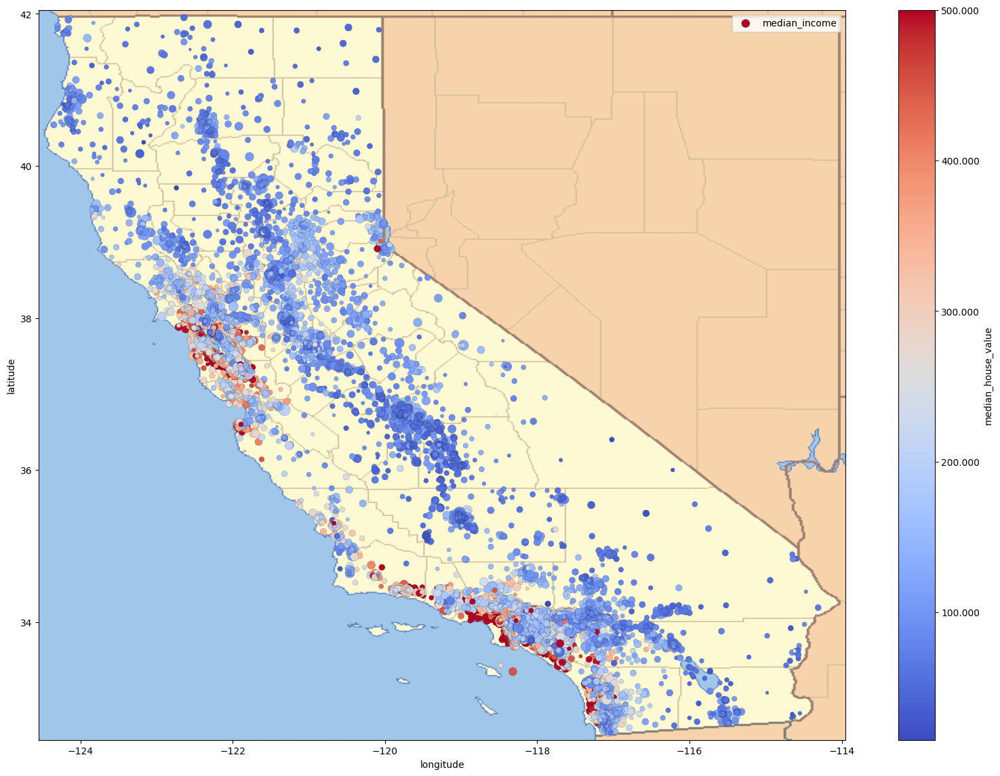

In [33]:
axis = -124.55, -113.95, 32.45, 42.05

reduced_housing_sample.sort_values(by='median_income', ascending=False).plot(kind='scatter',
                                                                             x='longitude', y='latitude',
                                                                             s=reduced_housing_sample['median_income']*10, label='median_income',
                                                                             c='median_house_value', cmap='coolwarm', colorbar=True,
                                                                             edgecolor='black', linewidths=0.1, figsize=(20, 14))
plt.axis(axis)
plt.imshow(plt.imread(Path(img_path) / filename), extent=axis)

Es zeigt sich eine starke Konzentration der Bezirke mit hohem __median_house_value__ in den Küstengebieten um San Francisco / San José und Los Angeles / San Diego. Zudem gibt es weitere kleinere Regionen, in denen mehrere Bezirke mit hohem __median_house_value__ zusammenfallen, wie der Küstenabschnitt zwischen San Francisco und Los Angeles, die Umgebung von Sacramento, das weitere Umland von Los Angeles und Lake Tahoe. Die Bezirke mit niedrigerem __median_house_value__ dominieren deutlich das Inland und die nördliche Küstenregion, es gibt aber auch in San Francisco, San José, Los Angeles und San Diego Gegenden mit niedrigerem / mittlerem __median_house_value__.

Die hohen __median_income__ treten ebenfalls eher in den Ballungszentren auf. Dies beschränkt sich aber nicht nur auf die Küstenregion, auch im Inland sind in den Regionen mit vielen Bezirken höhere Einkommen erkennbar als in den größeren Bezirken / Regionen mit weniger Bezirken. Durch die Sortierung der Daten und die daraus resultierende Reihenfolge in der Erzeugung des Plots ist für Los Angeles und San Diego, in etwas geringerem Maße aber auch San Francisco, erkennbar, dass die niedrigen __median_income__ in Bezirken mit niedrigerem __median_house_value__ auftreten.

(-124.55, -113.95, 32.45, 42.05)

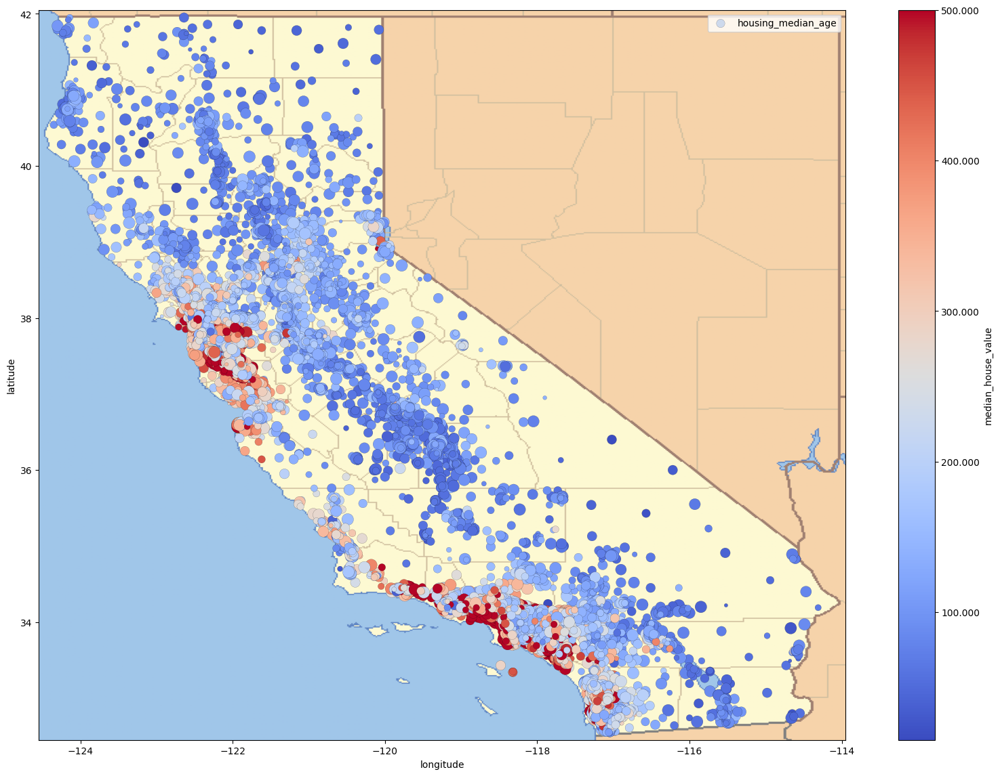

In [34]:
reduced_housing_sample.sort_values(by='housing_median_age', ascending=False).plot(kind='scatter',
                                                                                  x='longitude', y='latitude',
                                                                                  s=reduced_housing_sample['housing_median_age']*3, label='housing_median_age',
                                                                                  c='median_house_value', cmap='coolwarm', colorbar=True,
                                                                                  edgecolor='black', linewidths=0.1, figsize=(20, 14))
plt.imshow(plt.imread(Path(img_path) / filename), extent=axis)
plt.axis(axis)

Anders als bei __median_income__ ist für __housing_median_age__ keine klare Trennung zwischen den großen Küstenstädten und dem Inland erkennbar, es gibt im gesamten Staat sowohl Bezirke mit älteren als auch Bezirke mit neueren Häusern. In den großen Küstenstädten sind unabhängig vom __median_house_value__ Bezirke mit neueren und älteren Häusern erkennbar.

Da in [Aufgabenteil A-2d](#aufgabenteil-a-2d) für __median_house_value__ und __housing_median_age__, in geringem Maße aber auch __median_income__, aufgefallen war, dass viele Datensätze im Bereich der jeweiligen Maxima auftreten, werden alle drei Merkmale nochmal einzeln über die Farbskala bei konstanter Größe der Punkte abgebildet. Dabei werden die Daten jeweils aufsteigend nach dem abgebildeten Merkmal sortiert, um die Extremwerte sichtbar zu machen.

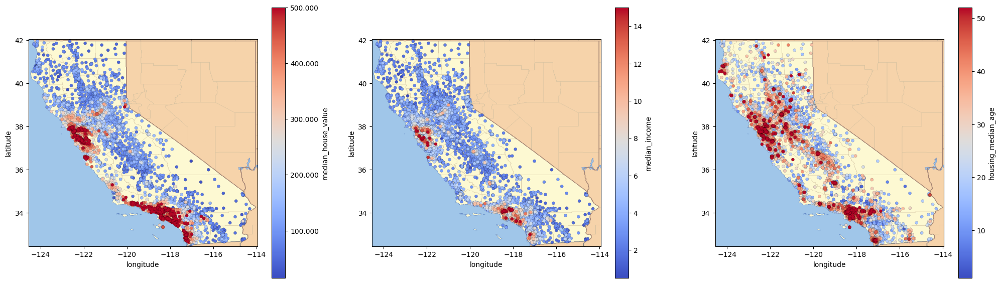

In [35]:
fig = plt.figure(figsize=(25, 7))
subfig1 = fig.add_subplot(1, 3, 1)
reduced_housing_sample.sort_values(by='median_house_value', ascending=True).plot(kind='scatter',
                                                                                 x='longitude', y='latitude',
                                                                                 c='median_house_value', cmap='coolwarm', colorbar=True,
                                                                                 edgecolor='black', linewidths=0.1, ax=subfig1)
subfig1.axis(axis)
subfig1.imshow(plt.imread(Path(img_path) / filename), extent=axis)

subfig2 = fig.add_subplot(1, 3, 2)
reduced_housing_sample.sort_values(by='median_income', ascending=True).plot(kind='scatter',
                                                                            x='longitude', y='latitude',
                                                                            c='median_income', cmap='coolwarm', colorbar=True,
                                                                            edgecolor='black', linewidths=0.1, ax=subfig2)
subfig2.axis(axis)
subfig2.imshow(plt.imread(Path(img_path) / filename), extent=axis)

subfig3 = fig.add_subplot(1, 3, 3)
reduced_housing_sample.sort_values(by='housing_median_age', ascending=True).plot(kind='scatter',
                                                                                 x='longitude', y='latitude',
                                                                                 c='housing_median_age', cmap='coolwarm', colorbar=True,
                                                                                 edgecolor='black', linewidths=0.1, ax=subfig3)
subfig3.axis(axis)
subfig3.imshow(plt.imread(Path(img_path) / filename), extent=axis)

Für __median_house_value__ sind die Maxima im Wesentlichen über die San Francisco / San José und Los Angeles / San Diego verteilt, wobei in Los Angeles auffällt, dass diese Bezirke über einen relativ großen Küstenabschnitt verteilt sind. Die Extremwerte in __median_income__ treten ebenfalls hauptsächlich in San Francisco und Los Angeles auf, wobei dies erwartungsgemäß deutlich weniger Bezirke betrifft (hier war nur eine kleine Spitze in [Aufgabenteil A-2d](#aufgabenteil-a-2d) aufgefallen). Das häufige Auftreten des Maximums von __housing_median_age__ scheint auch großteils auf die gleichen Regionen zurückzuführen zu sein, hier gibt es aber auch viele Bezirke im Inland und dem Küstenabschnitt nördlich von San Francisco.

#### Aufgabenteil A-3b
Betrachtet werden soll die Abhängigkeit des Hauspreises von den verfügbaren numerischen Merkmalen. Dazu ist eine geeignete Visualisierungsmöglichkeit zu wählen, auszuführen und zu interpretieren.

Um die Abhängigkeit des Hauspreises von den anderen numerischen Merkmalen darzustellen, wird ein Pairplot erzeugt. Da die Zusammenhänge zwischen den anderen numerischen Variablen an dieser Stelle nicht untersucht werden soll, wird der Pairplot auf eine Spalte reduziert. Diese Spalte enthält Scatterplots zwischen __median_house_value__ und den anderen numerischen Merkmalen und, zur besseren Einordnung der Anzahl der Punkte, ein Histogramm von __median_house_value__.

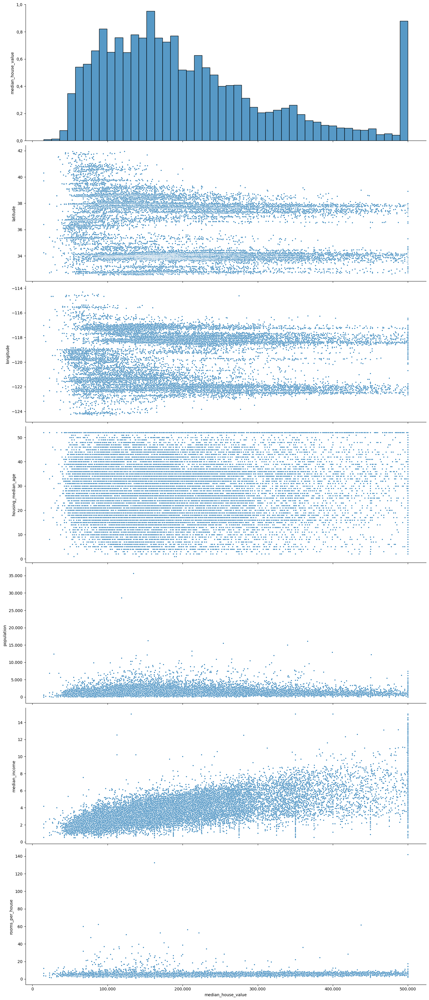

In [36]:
sns.pairplot(data=reduced_housing_sample,
             x_vars='median_house_value',
             y_vars=['median_house_value', 'latitude', 'longitude', 'housing_median_age', 'population', 'median_income', 'rooms_per_house'],
             kind='scatter', markers='.',
             height=5, aspect=3)

<u>__latitude__ und __longitude__</u><br>
Für die beiden Koordinaten-Merkmale zeigt die Darstellung vor allem erneut, dass die hohen Hauspreise primär in jeweils zwei Koordinatenabschnitten, nämlich San Francisco / San José und Los Angeles / San Diego auftreten, wobei auch die Extremwerte im Maximum von __median_house_value__ vor allem auf diese Gegenden zurückzuführen sind. Es lässt sich aber auch wieder erkennen, dass die Bezirke in diesen Regionen auch einen großen Anteil der Daten ausmachen.

<u>__housing_median_age__</u><br>
Der Plot zwischen __housing_median_age__ und __median_house_value__ zeigt eine starke Streuung über die gesamten Wertebereiche und auch die Extremwerte in den Maxima der beiden Merkmale verteilen sich über den gesamten Wertebereich des jeweils anderen Merkmals. Lediglich im Bereich über 350.000 Dollar __median_house_value__ und unter 15 Jahren __housing_median_age__ scheint es etwas weniger Daten zu geben. Darüber hinaus ist kein klarer Zusammenhang erkennbar, das auffällige horizontale Linienmuster resultiert aus der Ganzzahligen Belegung von __housing_median_age__.

<u>__population__</u><br>
Die Bevölkerungszahl des Bezirks bewegt sich im Wesentlichen unter 5.000, wobei für Hauspreise unter ca. 300.000 noch relativ viele Bezirke bis 5.000 auftreten, während darüber die meisten Bezirke unter 2.500 Einwohner haben. Allerdings scheinen die Extremwerte im Maximum von __median_house_value__ wieder stärker über die Einwohnerzahlen bis 5.000 gestreut zu sein.

<u>__median_income__</u><br>
Für höhere Hauspreise ist auch tendenziell ein höheres __median_income__, aber auch eine wachsende Streuung des Einkommens, zu beobachten. Auffällig ist, dass selbst im Bereich bis 500.000 __median_house_value__ kaum __median_income__ über ca. 9 zu beobachten sind. Die hohen Einkommen sind im Wesentlichen erst im Maximum des __median_house_value__ zu beobachten, wobei hier auch eine sehr starke Streuung des __median_income__ erkennbar ist, sodass selbst Einkommenswerte bis ca. 2 keine Ausreißer zu sein scheinen. Auffällig ist auch, dass es einzelne Preise mit einer größeren Streuung der Einkommen zu geben scheint, die im Plot als Linien nach unten aus der Punktewolke hervortreten. Dabei handelt es sich vermutlich um die gleichen Preisschwellen, die bereits bei der Betrachtung von __median_house_value__ in [Aufgabenteil A-2d](#aufgabenteil-a-2d) aufgefallen waren.

<u>__rooms_per_house__</u><br>
Die Anzahl der Räume pro Haus liegt für alle __median_house_value__ im gleichen Bereich bis ca. 10 ohne nennenswerte Unterschiede in der Streuung. Zwar sind im Bereich bis ca. 200.000 __median_house_value__ mehr Ausreißer erkennbar, auf diesen Bereich entfallen aber auch mehr Daten als auf höhere __median_house_value__. Auch im Maximum der Hauspreise bewegt sich die Raumanzahl pro Haus (bis auf einen extremen Ausreißer) im gleichen Bereich, wie für niedrigere Preise.


### [Aufgabe A-4: Erste Hauspreisprognosemodelle auf Basis der numerischen Features [Lernziele 3.3/3.4, 4.1 & 6; 14 Punkte]](#toc0_)

#### Aufgabenteil A-4a
Es ist anzugeben, wie die Fehler- bzw. Gütemaße Root Mean Squared Error (RMSE) bzw. R² eines Prognoseverfahrens bei einem Regressionsproblem berechnet werden. Im Anschluss soll der mathematische Zusammenhang zwischen den beiden Größen aufgezeigt werden. Dabei soll einerseits darauf eingegangen werden, welche Rolle ein naives Nullmodell einnimmt, das stets den Mittelwert des Zielmerkmals ausgibt, und andererseits begründet werden, wieso der RMSE bei steigendem R² sinkt und bei fallendem R² steigt.

$RMSE = \sqrt{\frac{1}{n}\sum_{i=1}^{n}(y_i - \hat{y}_i)^2}$<br>
und<br>
$R^2 = 1 - \frac{\sum_{i=1}^{n}(y_i - \hat{y}_i)^2}{\sum_{i=1}^{n}(y_i - \bar{y})^2}$<br>
mit:<br>
- $y_i$ die beobachteten Werte des Zielmerkmals
- $\hat{y}_i$ die mit dem Regressionsmodell prognositzierten Werte des Zielmerkmals
- $\bar{y}$ der Mittelwert des Zielmerkmals
- $n$ die Anzahl der Beobachtungen

In einem naiven Nullmodell, das stets den Mittelwert des Zielmerkmals annimmt, gilt: 
$$
\hat{y}_i=\bar{y}_i \implies \frac{\sum_{i=1}^{n}(y_i - \hat{y}_i)^2}{\sum_{i=1}^{n}(y_i - \bar{y})^2}=1 \implies R^2=0
$$
Für beide Kennzahlen ist nur die Summe der quadratischen Fehler $\sum_{i=1}^{n}(y_i - \hat{y}_i)^2$ modellabhängig, wobei $R^2$ für größere quadratische Fehler kleiner und für kleinere quadratische Fehler größer wird. Da $RMSE$ die mit $\frac{1}{n}$ gewichtete Wurzel der Summe der quadratischen Summe ist, liegt hier der umgekehrte Zusammenhang vor: $RMSE$ wird größer für größere quadratische Fehler und kleiner für kleinere quadratische Fehler.

#### Aufgabenteil A-4b
Der Datensatz ist in einen Trainingsteil (konkret: x_train & y_train) und einen Validierungsteil (konkret: x_val & y_val) zu splitten. Dabei ist die Spalte sample zu berücksichtigen: Zeilen mit dem Eintrag „A“ sollten für das Training und Zeilen mit dem Eintrag „B“ für die Validierung verwendet werden. Die entsprechend benötigten Datenstrukturen sind anzulegen.

Für die beiden x-Variablen werden alle Merkmale außer __median_house_value__, __ocean_proximity__, __county_name__ und __sample__ behalten, für die beiden y-Variablen wird jeweils nur das Merkmal __median_house_value__ übernommen.

In [37]:
x_train = reduced_housing_sample[reduced_housing_sample['sample'] == 'A'].drop(columns=['median_house_value', 'ocean_proximity', 'county_name', 'sample'])
y_train = reduced_housing_sample[reduced_housing_sample['sample'] == 'A']['median_house_value']

x_val = reduced_housing_sample[reduced_housing_sample['sample'] == 'B'].drop(columns=['median_house_value', 'ocean_proximity', 'county_name', 'sample'])
y_val = reduced_housing_sample[reduced_housing_sample['sample'] == 'B']['median_house_value']

#### Aufgabenteil A-4c
Für die Ergebnisse dieser und der nachfolgenden Modelle in Teil A ist eine geeignete Datenstruktur anzulegen. Diese soll für jedes Modell den Wert für den Root Mean Squared Error (RMSE) enthalten.

Um den RMSE der Modelle zu speichern wird ein Dictionary genutzt:

In [38]:
# model_rmse = {} wurde bereits in Aufgabe A-0 angelegt

#### Aufgabenteil A-4d
Zu verwenden ist ein einfaches lineares Modell ohne besondere Anpassungen. Ein Ergebnisbericht ist auszugeben und die Ergebniswerte sind zu speichern und zu kommentieren.

In [39]:
model_name = 'Modell A-4d'
model_description[model_name] = 'lineares Modell mit numerischen Merkmalen'

model_a4d = ols('median_house_value ~ latitude + longitude + housing_median_age + population + median_income + rooms_per_house', data=pd.concat([x_train, y_train], axis=1))
return_model_a4d = model_a4d.fit()

predict_a4d = return_model_a4d.predict(x_val)
model_rmse[model_name] = root_mean_squared_error(y_val, predict_a4d)

print_model_stats(model_name)

RMSE 74509 für lineares Modell mit numerischen Merkmalen


Zur Beurteilung des Modells folgen ein Plot der tatsächlichen Zielwerte aus den Validierungsdaten gegen die vorhergesagten Werte, ein Residuenplot und Histogramme für die tatsächlichen und die vorhergesagten Werte, sowie die Schätzungen der Bezirke mit __median_house_value__ = 500.001. Da im Weiteren die gleichen Plots für mehrere Modelle erzeugt werden sollen, ist deren Erzeugung in Form von zwei Funktionen in den Abschnitt [Hilfsfunktionen](#hilfsfunktionen) ausgelagert.

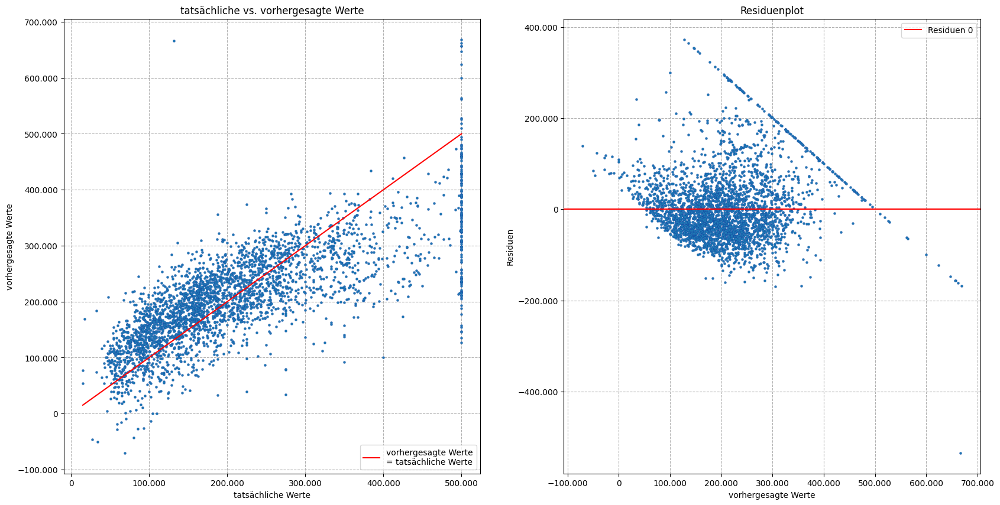

In [40]:
plot_model_scatter(prediction=predict_a4d, validation=y_val)

Der Plot der tatsächlichen gegen die vorhergesagten Werte zeigt, dass das Modell eine grundsätzliche Tendenz für __median_house_value__ abbildet, aber relativ stark streut. Im Bereich bis ca. 300.000 ergibt sich eine dichte Punktwolke um die eingezeichnete "perfekte" Vorhersage, wobei sich in diesem Bereich eine leichte Tendenz zur Überbewertung zeigt. Der Großteil der Schätzungen in diesem Bereich liegt zwischen einer Überbewertung von 100.000 und einer Unterbewertung von 50.000 - 75.000, was auch gut zum RMSE von ca. 75.000 passt. Einzelne Schätzungen für tatsächliche Werte bis ca. 100.000 liegen dabei auch im negativen Bereich. Für die tatsächlichen Werte ab ca. 300.000 scheint die Prognose stärker zu streuen und meistens zu niedrig in einem Band bis zu ca. 200.000 unter den tatsächlichen Werten zu liegen. Die Schätzung für __median_house_value__ im Maximum bei 500.001 schließlich zeigt eine sehr breite Streuung von etwas über 100.000 bis fast 700.000, wobei auch hier der tatsächliche Preis meistens unterschätzt wird und ein Großteil der Schätzungen zwischen 200.000 und 500.000 liegt.

Der Residuenplot spiegelt für die Schätzungen bis ca. 300.000 ebenfalls die Tendenz zur Überbewertung durch eine Häufung negativer Residuen in diesem Bereich dar. Da die höheren tatsächlichen Werte größtenteils unterschätzt werden, verschiebt sich deren Darstellung im Residuenplot in den Bereich von 200.000 bis 400.000 Vorhersage und überlagert sich dementsprechend mit den Schätzungen für kleinere tatsächliche Werte also relativ lose Wolke positiver Residuen. Durch den augenscheinlich geringeren Anteil an den Gesamtdaten überwiegen aber die tatsächlich niedrigen Werte. Zudem ist durch die schlechten Schätzungen der tatsächlichen Werte im Maximum eine diagonale Linie erkennbar, die den Plot nach rechts oben begrenzt.

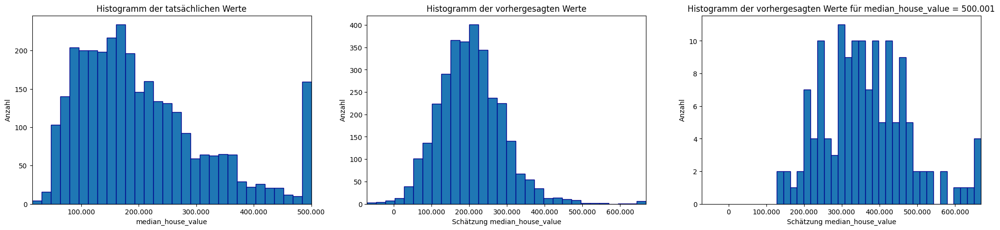

In [41]:
plot_model_hist(prediction=predict_a4d, validation=y_val)

Das Histogramm der vorhergesagten Werte zeigt im Vergleich zu dem Histogramm der tatsächlichen Werte eine deutlich stärkere Bündelung der Werte im Bereich um die 200.000. Das passt wieder zu der Überbewertung kleiner und Unterbewertung großer Hauspreise, wodurch beides im Übergangsbereich zusammenläuft. Auch das Fehlen der Häufung bei 500.000, sowie die über die Grenzen der tatsächlichen Werte hinausgehenden Schätzungen sind hier zu beobachten und die starke Streueung der Schätzungen für diese Bezirke bestätigt sich nochmals in deren Histogramm.

#### Aufgabenteil A-4e
Analog zu Teilaufgabe d) ist CatBoost mit Standardparametern zu verwenden, wobei die Ausgabe der einzelnen Iterationen sowohl hier als auch in nachfolgenden Aufgaben zu unterdrücken ist. Ein Ergebnisbericht samt allen verwendeten Parametern ist auszugeben und die Ergebniswerte sind zu speichern. Zusätzlich ist die Feature Importance auszugeben und zusammen mit den Ergebniswerten zu kommentieren.

Bei der Definition des CatBoost-Modells wird mittels `verbose=False` die Ausgabe der einzelnen Iterationen unterdrückt. Mit `allow_writing_files=False` werden potenzielle Probleme mit fehlenden Schreibrechten für nicht benötigte Dateien umgangen.

In [42]:
model_name = 'Modell A-4e'
model_description[model_name] = 'CatBoost mit numerischen Merkmalen'

model_a4e = CatBoostRegressor(verbose=False, allow_writing_files=False)
model_a4e.fit(x_train, y_train)

predict_a4e = model_a4e.predict(x_val)
model_rmse[model_name] = root_mean_squared_error(y_val, predict_a4e)

print_model_stats(model_name)

RMSE 48913 für CatBoost mit numerischen Merkmalen


Auch hier werden zur Beurteilung des Modells ein Plot der tatsächlichen Zielwerte aus den Validierungsdaten gegen die vorhergesagten Werte, ein Residuenplot und Histogramme für tatsächliche und geschätzte Werte, sowie die Schätzungen der Bezirke mit __median_house_value__ = 500.001, erstellt.

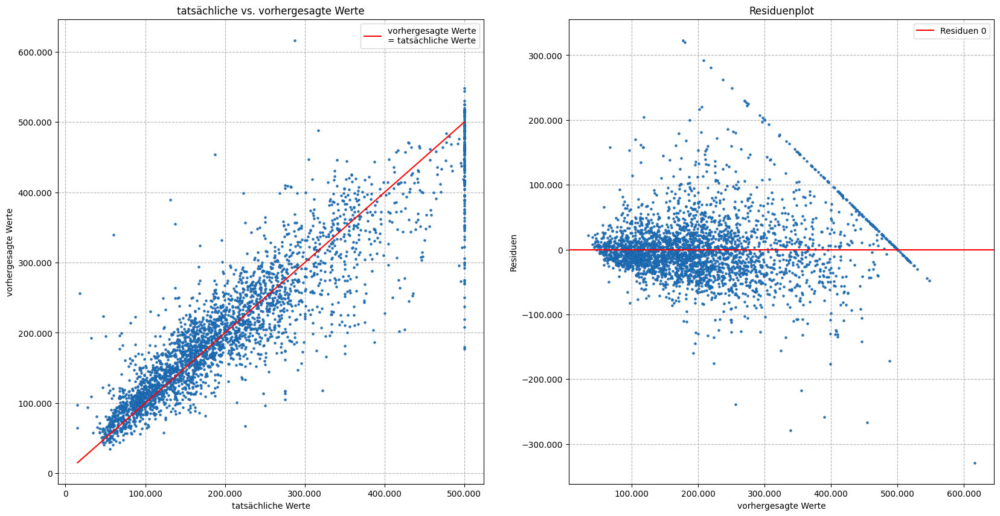

In [43]:
plot_model_scatter(prediction=predict_a4e, validation=y_val)

Im Bereich bis ca. 200.000 liegen die Schätzungen großteils relativ nah an den tatsächlichen Werten, wieder mit einer leichten Tendenz zur Überbewertung um bis ca. 50.000, was sich auch im geringeren RMSE äußert. Über 200.000 streuen die Schätzungen weiter um die tatsächlichen Werte. Während in diesem Bereich wieder eher unterbewertet wird, scheinen die Schätzungen grundsätzlich höher zu sein als im linearen Modell und großteils eher zwischen einer Überbewertung bis 50.000 und einer Unterbewertung bis 100.000 zu liegen. Bei den tatsächlichen Preisen von 500.001 ist wieder eine breite Streuung zu beobachten, wobei die Schätzungen im Bereich zwischen 175.000 und 500.000 liegen, also insbesondere die Überbewertungen weniger extrem ist als im linearen Modell. Ein Großteil der Schätzungen liegt hier zwischen 325.000 und 525.000, der Bereich ist also zum einen enger als im linearen Modell, zum anderen ist aber auch hier die tendenziell höhere Schätzung für die tatsächlichen Werte über 200.000 zu beobachten.

Im Residuenplot ist ebenfalls erkennbar, dass die Schätzungen für kleine Werte besser sind als im linearen Modell und die Residuen allgemein weniger stark gestreut sind. Gleichzeitig zeigt der Residuenplot aber auch die wachsenden und stärker gestreuten Abweichungen für höhere Schätzungen. Wie bereits beim linearen Modell resultieren die Schätzungen für die __medium_house_value__ im Maximum auch hier in einer deutlich erkennbaren Linie, die die rechte obere Ecke des Plots begrenzt.

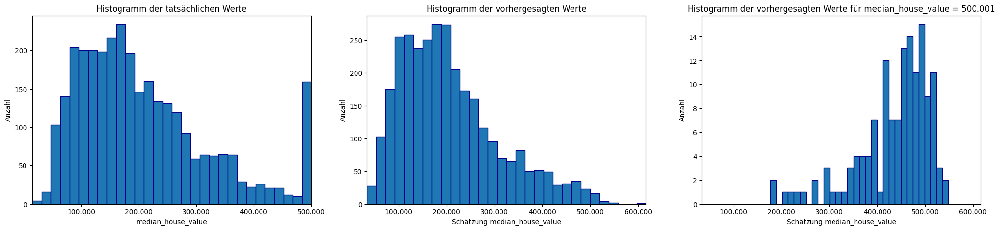

In [44]:
plot_model_hist(prediction=predict_a4e, validation=y_val)

Der Vergleich der Histogramme zeigt eine schwächere Bündelung im Übergang zwischen den niedrigeren und höheren tatsächlichen Hauspreisen, ist aber im Bereich 100.000 bis 300.000 weiter erkennbar. Auch das Fehlen der Spitze bei 500.001 fällt hier wieder auf und auch die engere Streuung der Schätzungen für diese Werte (im Vergleich zum linearen Mdell) kann im zugehörigen Histogramm bestätigt werden. Allgemein ist hier, abgesehen von den Extremwerten, bereits eine strukturelle Ähnlichkeit zu den tatsächlichen Werten erkennbar.

In [45]:
catboost_params_a4e = model_a4e.get_all_params()
print('verwendete Parameter:')
for param, value in catboost_params_a4e.items():
    print(f'{param}: {value}')

verwendete Parameter:
nan_mode: Min
eval_metric: RMSE
iterations: 1000
sampling_frequency: PerTree
leaf_estimation_method: Newton
random_score_type: NormalWithModelSizeDecrease
grow_policy: SymmetricTree
penalties_coefficient: 1
boosting_type: Plain
model_shrink_mode: Constant
feature_border_type: GreedyLogSum
bayesian_matrix_reg: 0.10000000149011612
eval_fraction: 0
force_unit_auto_pair_weights: False
l2_leaf_reg: 3
random_strength: 1
rsm: 1
boost_from_average: True
model_size_reg: 0.5
pool_metainfo_options: {'tags': {}}
subsample: 0.800000011920929
use_best_model: False
random_seed: 0
depth: 6
posterior_sampling: False
border_count: 254
classes_count: 0
auto_class_weights: None
sparse_features_conflict_fraction: 0
leaf_estimation_backtracking: AnyImprovement
best_model_min_trees: 1
model_shrink_rate: 0
min_data_in_leaf: 1
loss_function: RMSE
learning_rate: 0.06241700053215027
score_function: Cosine
task_type: CPU
leaf_estimation_iterations: 1
bootstrap_type: MVS
max_leaves: 64


Die Ausgabe der Feature Importance für alle Merkmale ist ebenfalls als Funktion in den Abschnitt [Hilfsfunktionen](#hilfsfunktionen) ausgelagert.:

In [46]:
list_feature_importance(model=model_a4e, columns=x_train.columns)

Feature Importance von median_income: 29.724008478316748
Feature Importance von latitude: 29.144908189740867
Feature Importance von longitude: 28.9540488643117
Feature Importance von housing_median_age: 5.8741119369703245
Feature Importance von rooms_per_house: 4.561589109561224
Feature Importance von population: 1.7413334210991498


Die mit Abstand wichtigsten Merkmale sind die beiden Koordinaten __latitude__ und __longitude__ sowie das __median_income__. Unter den übrigen Merkmalen haben __housing_median_age__ und __rooms_per_house__ noch etwas mehr Einfluss als __population__. Dieses Ergebnis ist auch intuitiv nachvollziehbar: Die Koordinaten sind die wesentlichen Merkmale, um die teureren Städte vom günstigeren Inland zu unterscheiden, das Haushaltseinkommen hingegen unterscheidet unterschiedlich teure Wohngegenden. Nachdem diese Merkmale ein grundsätzliches Preisniveau eingrenzen, sind das Alter und Größe gebäudespezifischere Merkmale. Die Bevölkerungszahl im Bezirk ist vermutlich nur eingeschränkt aussagekräftig, wenn die Bezirke nicht vergleichbar groß sind.

### [Aufgabe A-5: Kategorielle Merkmale analysieren und aufbereiten [Lernziele 3.3/3.4 & 5.2; 7 Punkte]](#toc0_)

#### Aufgabenteil A-5a
Zu erstellen ist eine grafische prozentuale Häufigkeitsverteilung für die nominalen Merkmale ocean_proximity und county_name. Die Ergebnisse sind zu erläutern.

Text(0, 0.5, 'Prozentuale Häufigkeit')

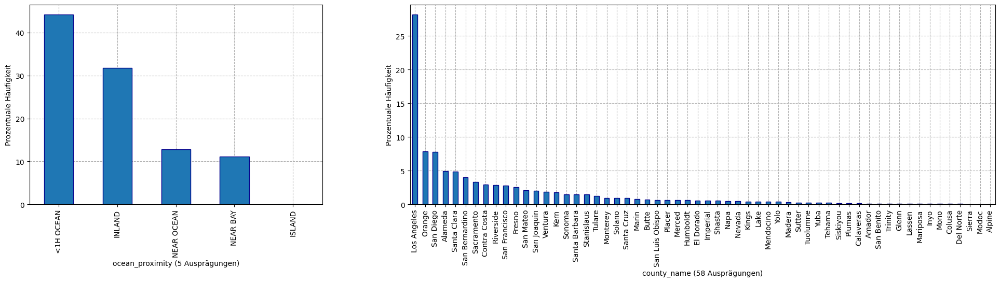

In [47]:
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 5), gridspec_kw={'width_ratios': [1, 2]})
(reduced_housing_sample['ocean_proximity'].value_counts( normalize=True)*100).plot(kind='bar', edgecolor='darkblue', zorder=2, ax=ax1)
ax1.grid(visible=True, linestyle='--')
ax1.set_xlabel(f'ocean_proximity ({reduced_housing_sample["ocean_proximity"].nunique()} Ausprägungen)')
ax1.set_ylabel('Prozentuale Häufigkeit')

(reduced_housing_sample['county_name'].value_counts(normalize=True)*100).plot(kind='bar', edgecolor='darkblue', zorder=2, ax=ax2)
ax2.grid(visible=True, linestyle='--')
ax2.set_xlabel(f'county_name ({reduced_housing_sample["county_name"].nunique()} Ausprägungen)')
ax2.set_ylabel('Prozentuale Häufigkeit')

Für __ocean_proximity__ gibt es lediglich fünf Ausprägungen. Ein großer Teil von über 40% der Bezirke fällt in die Kategorie _<1H OCEAN_, während weitere ca. 30% als _INLAND_ kategorisiert werden. Die beiden Ausprägungen _NEAR OCEAN_ und _NEAR BAY_ machen jeweils weitere etwas über 10% der Daten aus. Die Ausprägung _ISLAND_ scheint fast gar nicht vorzukommen, was im Folgenden noch kurz genauer betrachtet wird.

Für __county_name__ ist _Los Angeles_ die mit Abstand häufigste Ausprägung mit über 25% der Daten, gefolgt von _Orange_ und _San Diego_ unter 10%, _Alameda_ und _San Bernadino_ bei ca. 5%. Die relative Häufigkeit der weiteren Ausprägungen sinkt bis nahe 0, die seltensten Ausprägungen  _Sierra_, _Modoc_ und _Alpine_ werden im Folgenden ebenfalls noch kurz genauer betrachtet.

Für __ocean_proximity__ wird zunächst die absolute Häufigkeit aller Ausprägungen ausgegeben:

In [48]:
print('Anzahl der Datensätze pro Ausprägung von ocean_proximity:')
print(reduced_housing_sample['ocean_proximity'].value_counts())

Anzahl der Datensätze pro Ausprägung von ocean_proximity:
ocean_proximity
<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: count, dtype: int64


Da __county_name__ deutlich mehr Ausprägungen hat als __ocean_proximity__, werden nur die fünf seltensten und (zum Vergleich) die fünf häufigsten Ausprägungen ausgegeben:

In [49]:
print('Anzahl der Datensätze für die fünf häufigsten und die fünf seltensten Ausprägung von county_name:')
print(reduced_housing_sample['county_name'].value_counts().head(5))
print(reduced_housing_sample['county_name'].value_counts().tail(5))

Anzahl der Datensätze für die fünf häufigsten und die fünf seltensten Ausprägung von county_name:
county_name
Los Angeles    5823
Orange         1619
San Diego      1610
Alameda        1019
Santa Clara    1003
Name: count, dtype: int64
county_name
Colusa       16
Del Norte    16
Sierra        8
Modoc         8
Alpine        3
Name: count, dtype: int64


Die in den Plots kaum erkennbaren Ausprägungen _ISLAND_ für __ocean_proximity__ und _Sierra_, _Modoc_ und _Alpine_ für __county_name__ machen jeweils weniger als 10 Datensätze aus, im Vergleich zu (mehreren) tausend für die häufigsten Ausprägungen.

#### Aufgabenteil A-5b
Der Einfluss der nominalen Merkmale auf die Hauspreise ist mit geeigneten Mitteln zu visualisieren. Auffälligkeiten sind zu kommentieren.

Um den Zusammenhang zwischen __median_house_value__ und den beiden nominalen Merkmalen __ocean_proximity__ und __county_name__ zu visualisieren, werden zwei Boxplots für __median_house_value__ erzeugt, die jeweils nach einem der beiden nominalen Merkmale gruppiert werden. Um die Streuung der Werte besser sichtbar zu machen, werden die Whisker nicht, wie üblich, für den 1,5-fachen Interquartalsabstand genutzt, sondern bilden das 5%- bzw. 95%-Quantil ab. Zur Verbesserung der Übersichtlichkeit werden zudem die einzelnen Gruppen nach dem Median von __median_house_value__ innerhalb der jeweiligen Gruppe sortiert.

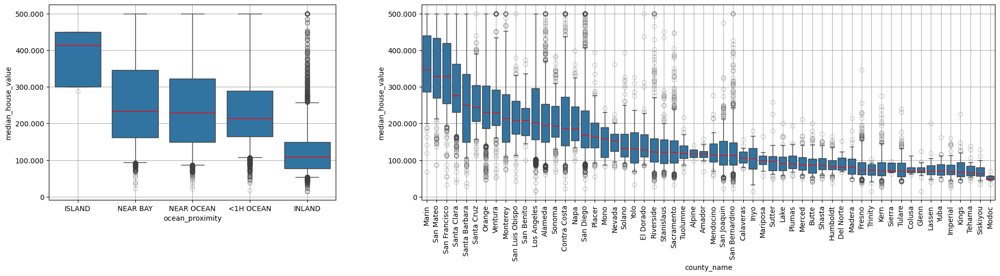

In [50]:
_, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 5), gridspec_kw={'width_ratios': [1, 2]})
sns.boxplot(data=reduced_housing_sample,
            x='ocean_proximity', y='median_house_value',
            order=reduced_housing_sample.groupby('ocean_proximity', observed=False)['median_house_value'].median().sort_values(ascending=False).index,
            flierprops=dict(alpha=0.25), whis=[5, 95], medianprops=dict(color='red'), ax=ax1)
ax1.grid(True)

plt.xticks(rotation=90) # vor den eigentlichen Plot verschoben, um unnötigen Output zu unterdrücken (durch sich überschneidende Beschriftung?)
sns.boxplot(data=reduced_housing_sample,
            x='county_name', y='median_house_value',
            order=reduced_housing_sample.groupby('county_name', observed=False)['median_house_value'].median().sort_values(ascending=False).index,
            flierprops=dict(alpha=0.25), whis=[5, 95], medianprops=dict(color='red'), ax=ax2)
ax2.grid(True)

<u>__ocean_proximity__</u><br>
Die drei Ausprägungen _NEAR BAY_, _NEAR OCEAN_ und _<1H OCEAN_ haben einen ähnlichen Median und das 95%-Quantil liegt bereits im Maximum von __median_house_value__, weshalb nur Ausreißer nach unten vorliegen. Die drei Ausprägungen unterscheiden sich hauptsächlich über leicht unterschiedliche Quartile und einen geringeren Abstand zwischen dem 25%- und dem 75%-Quartil. Für _INLAND_ liegen sowohl Median als auch die 25%-,75%- und 95%-Quantile deutlich unter den entsprechenden Werten für _NEAR BAY_, _NEAR OCEAN_ und _<1H OCEAN_, es treten allerdings auch viele Ausreißer bis zum Maximum von __median_house_value__ auf. Die Ausprägung _ISLAND_ zeigt deutlich höhere Hauspreise als die anderen Ausprägungen und es fällt auf, dass hier keine Whisker existieren und es einen einzelnen Ausreißer nach unten gibt. 

Die Ausprägung _ISLAND_ tritt nur in fünf Datensätzen auf, darum können alle Hauspreise einfach ausgegeben werden:

In [51]:
print('median_house_value für ocean_proximity=ISLAND:')
print(reduced_housing_sample['median_house_value'][reduced_housing_sample['ocean_proximity'] == 'ISLAND'].sort_values(ascending=False))

median_house_value für ocean_proximity=ISLAND:
1698    450000
1704    450000
1697    414700
1694    300000
1741    287500
Name: median_house_value, dtype: int64


Durch die geringe Anzahl an Datensätzen fallen für _ISLAND_ das 5%- und 25%- sowie das 75%- und 95%-Quantil zusammen. Da die beiden größten __median_house_value__ darüber hinaus gleich sind, gibt es zudem keine Ausreißer nach oben und es ergibt sich das ungewöhnlilche Aussehen des Boxplots für diese Ausprägung.

<u>__county_name__</u><br>
Grundsätzlich zeigt sich für couties mit höherem Median __median_house_value__ auch eine wesentlich größere Streuung der Werte, insbesondere auch ein deutlich größerer Abstand zwischen den Quartilen. Für die counties _Marin_, _San Mateo_, _San Francisco_, _Santa Clara_, _Santa Barbara_, _Orange_ und _Los Angeles_ liegt das 95%-Quantil bereits im Maximum von __median_house_value__, diese counties liegen dabei alle im oberen Viertel der Median __median_house_value__. Zudem tritt dieses Maximum noch in weiteren counties als Ausreißer auf, wobei hier auch counties mit ansonsten deutlich geringeren Hauspreisen auftreten.<br>
Unter den counties mit hohem __median_house_value__ fallen zum Einen _San Benito_ sowie (bis auf jeweils einen Ausreißer) _Santa Cruz_ und_San Luis Obispo_ auf, die deutlich weniger nach oben streuen. Zum Anderen fallen _Santa Barbara_ und _Monterey_ auf, deren 25%-Quantile niedriger sind als bei (im Median) ähnlich teuren counties, während das 75%-Quantil für _Los Angeles_ auffällig hoch und die Spanne zwischen 25%- und 75%-Quantil in Contra Costa weiter als bei (im Median) ähnlich teuren counties ist.<br>
Im "mittleren" Bereich (~__county_name__ _Placer_ bis _San Bernadino_ in der Grafik) treten deutliche Schwankungn in den Quartilabständen, aber auch den 95%-Quantilen und Ausreißern auf. Grundsätzlich sind die Schwankungen nach oben (die 75%- und 95%-Quantile, sowie die Ausreißer) hier stärker ausgeprägt als die entsprechenden Schwankungen nach unten (die 25%- und 5%-Quantile, sowie die Ausreißer). Die fehlenden Whisker bei jeweils einem Ausreißer nach oben und nach unten für _Alpine_ sind der in [Aufgabenteil A-5a](#aufgabenteil-a-5a) festgestellten geringen Anzahl an Datensätzen geschuldet.<br>
Im "unteren Bereich" sind die Schwankungen im Quartilsabstand geringer, bzw. die counties mit auffällig kleinen Abständen (_Colusa_, _Glenn_ und _Modoc_) finden sich in [Aufgabenteil A-5a](#aufgabenteil-a-5a) auch unter den Ausprägungen mit wenig Bezirken. Wie auch bereits im mittleren Bereich beobachtet sind die Schwankungen nach oben deutlich stärker ausgeprägt als die Schwankungen nach unten. Die kaum erkennbaren Whisker für _Sierra_ und _Modoc_ sind, ähnlich wie _Alpine_ zuvor, auf die geringe Anzahl an Datensätzen zurückzuführen.

### [Aufgabe A-6: Hauspreisprognosemodelle auf Basis der kategoriellen Features erstellen [Lernziel 3.3/3.4, 4.1 & 6; 6 Punkte]](#toc0_)

#### Aufgabenteil A-6a
Die Datenstrukturen für Training und Validierung sind analog zu Aufgabe A-4 b) anzulegen und zu verwenden.

Die kategoriellen Merkmale werden nach __sample__ getrennt in Trainings- und Validierungsdaten unterschieden. Da die Zielgröße gleich bleibt, werden y_train_cat und y_val_cat aus [Aufgabenteil A-4b](#aufgabenteil-a-4b) übernommen.

In [52]:
x_train_cat = reduced_housing_sample[['ocean_proximity', 'county_name']][reduced_housing_sample['sample'] == 'A']
y_train_cat = y_train

x_val_cat = reduced_housing_sample[['ocean_proximity', 'county_name']][reduced_housing_sample['sample'] == 'B']
y_val_cat = y_val

#### Aufgabenteil A-6b
Zu verwenden ist ein einfaches lineares Modell ohne besondere Anpassungen. Ein Ergebnisbericht ist auszugeben und die Ergebniswerte sind zu speichern und zu kommentieren. Was ergibt sich im Vergleich mit den Modellen aus Aufgabe A-4?

Da das lineare Modell numerische Merkmale benötigt, werden die kategorischen Merkmale mit C() gekennzeichnet, damit sie automatisch encodet werden.

In [53]:
model_name = 'Modell A-6b'
model_description[model_name] = 'lineares Modell mit kategoriellen Merkmalen'

model_a6b = ols('median_house_value ~ C(ocean_proximity) + C(county_name)',data=pd.concat([x_train_cat, y_train_cat], axis=1))
return_model_a6b = model_a6b.fit()

predict_a6b = return_model_a6b.predict(x_val_cat)
model_rmse[model_name] = root_mean_squared_error(y_val_cat, predict_a6b)

print_model_stats(model_name)

RMSE 91193 für lineares Modell mit kategoriellen Merkmalen


Der RMSE für das einfache lineare Modell mit kategoriellen Merkmalen ist größer als die RMSE für beide rein numerischen Modelle.

Auch hier werden zur Beurteilung des Modells ein Plot der tatsächlichen Zielwerte aus den Validierungsdaten gegen die vorhergesagten Werte, ein Residuenplot und die Histogramme der tatsächlichen und vorhergesagten Werte, sowie die Schätzungen der Bezirke mit __median_house_value__ = 500.001, erstellt.

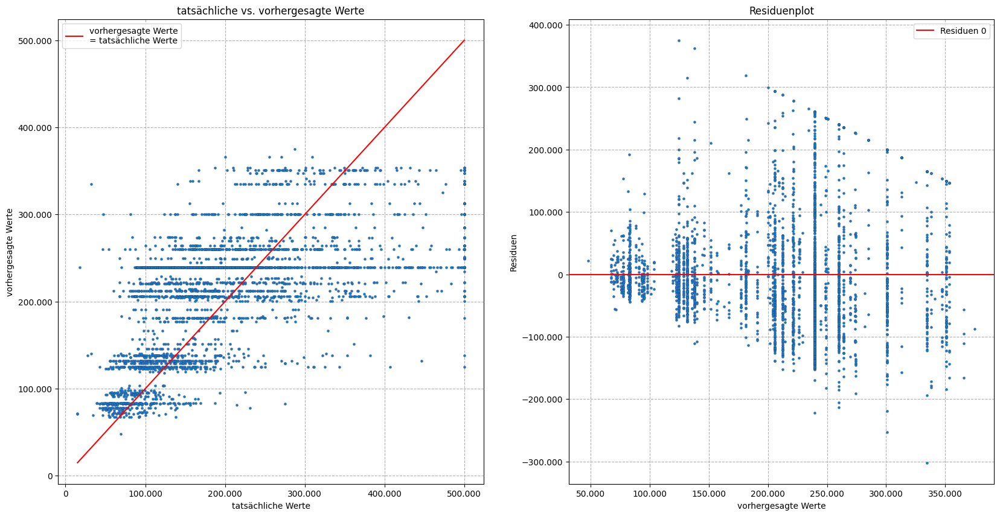

In [54]:
plot_model_scatter(prediction=predict_a6b, validation=y_val_cat)

Beide Plots zeigen deutliche Linienmuster, da das rein kategorielle Modell für eine diskrete Ergebnismenge sorgt. Wie bereits bei den rein numerischen Modellen ist auch hier für niedrigere tatsächliche Werte (bis ca. 200.000) eine Überbewertung der Hauspreise zu sehen, die allerdings hier deutlich stärker ausfällt und im Wesentlichen bei bis zu 150.000 liegt. Im Vergleich zu den rein numerischen Modellen schlägt dieses Modell jedoch noch stärker in eine Unterbewertung für höhere tatsächliche Werte um, sodass jenseits von 300.000 nur noch ein einzelner Ausreißer einen offensichtliche Grenze von ca. 350.000 (knapp) überschreitet. Die Werte ab 300.000 werden größtenteils in einem Bereich von 200.000 bis 350.000 geschätzt. In diesen Bereich fallen dementsprechend auch die Schätzungen für die 500.001er-Daten, die damit zwar im Vergleich zu den vorhergehenden Modellen relativ eng gestreut sind, aber trotzdem stark abweichen. Rein optisch scheinen hier deutlich weniger Daten zu existieren, da sich die Selektion der Validierungsdaten aber nicht geändert hat, ist davon auszugehen, dass es hier starke Überlagerungen durch die diskrete Ergebnismenge gibt.

Der Residuenplot zeigt ebenfalls das schnelle Anwachsen der Abweichungen für höhere Schätzungen und die größeren Residuen im Vergleich zu den beiden rein numerischen Modellen, die sich auch in dem hohen RMSE niederschlagen. Dennoch ist auch hier noch die gleiche Diagonale durch die 500.001er-Daten sichtbar, die den Plot nach oben rechts begrenzt, wobei auch hier vermutlich durch Überlagerungen weniger Punkte sichtbar sind. 

In beiden Plots zeichnen sich verschiedene Cluster in den Schätzungen ab. Am deutlichsten sichtbar sind zwei größere Gruppen unterhalb von 100.000 bzw. 150.000 geschätztem __median_house_value__ und eine Linie unterhalb von 250.000 Schätzung.

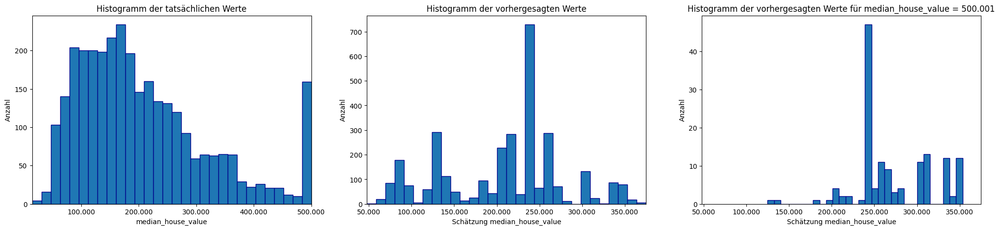

In [55]:
plot_model_hist(prediction=predict_a6b, validation=y_val_cat)

Die beiden Histogramme für die tatsächlichen und die vorhergesagten Werte weisen keine nennenswerten Ähnlichkeiten mehr auf. In den vorhergesagten Werten sind die beiden Cluster unterhalb von 100.000 bzw. 150.000 sowie die Starke Häufung unterhalb von 250.000, die bereits in den vorhergehenden PLots sichtbar waren, wieder erkennbar. Bei Betrachtung der Schätzungen für die Bezirke mit __median_house_value__ = 500.001 zeigt sich, dass auch ein großer Teil dieser Daten auf den Bereich unterhalb von 250.000 abgebildet wird. Während das rein kategorielle Modell also den tatsächlichen Hauspreis deutlich schlechter schätzt, scheint es etwas besser dafür geeignet zu sein, diese Extremwerte zu clustern.

#### Aufgabenteil A-6c
Analog zu Aufgabe A-4 ist CatBoost ohne weitere Anpassungen zu verwenden. Ein Ergebnisbericht ist auszugeben und die Ergebniswerte sind zu speichern. Zusätzlich ist die (CatBoost-interne) Feature Importance auszugeben und zusammen mit den Ergebniswerten zu kommentieren. Was ergibt sich im Vergleich zu dem Modell aus Aufgabe A-4?

In [56]:
model_name = 'Modell A-6c'
model_description[model_name] = 'CatBoost mit kategoriellen Merkmalen'

model_a6c = CatBoostRegressor(verbose=False, cat_features=['ocean_proximity', 'county_name'], allow_writing_files=False)
model_a6c.fit(x_train_cat, y_train_cat)

predict_a6c = model_a6c.predict(x_val_cat)
model_rmse[model_name] = root_mean_squared_error(y_val_cat, predict_a6c)

print_model_stats(model_name)

RMSE 89633 für CatBoost mit kategoriellen Merkmalen


Der RMSE für CatBoost mit kategoriellen Merkmalen ist zwar etwas niedriger als der RMSE für das einfache lineare Modell mit kategoriellen Merkmalen, aber höher als bei beiden rein numerischen Modellen. Somit ist CatBoost mit numerischen Merkmalen über die vier bisherigen Modelle hinweg nach diesem Kennzeichen das beste Modell.

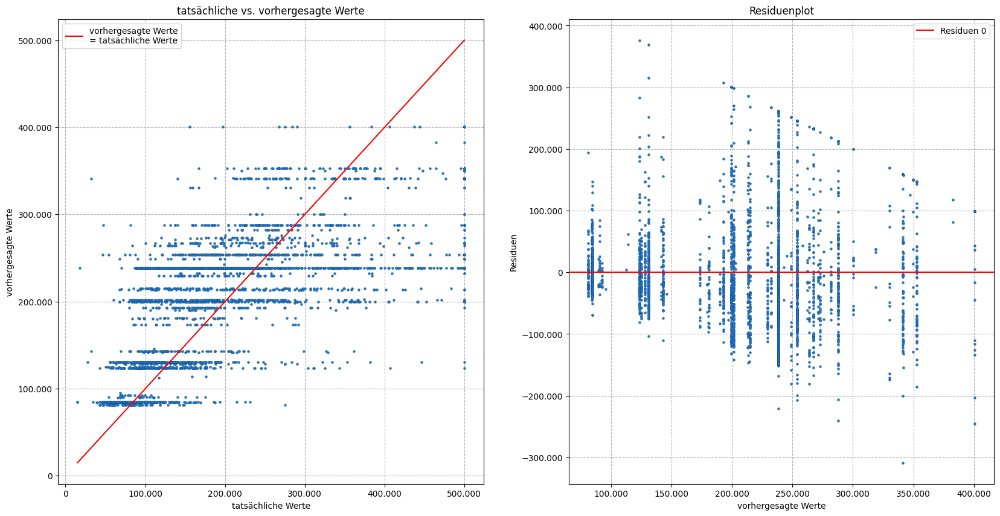

In [57]:
plot_model_scatter(prediction=predict_a6c, validation=y_val_cat)

Das kategorielle CatBoost-Modell liefert ein ähnliches Bild wie das kategorielle lineare Modell. Auffällig ist, dass die höheren Werte hier etwas weniger unterschätzt werden und die obere Grenze der Schätzungen für diesen Bereich etwas entschärft zu sein scheint, weshalb vermutlich auch der RMSE etwas besser ist. Das sorgt auch dafür, dass die Schätzungen für die tatsächlichen Werte im Maximum etwas weiter gestreut sind, sich aber wieder deutlich zu überlagern scheinen. Der Residuenplot zeigt, wie bei allen vorhergehenden Modellen auch, eine Abgrenzung nach rechts oben durch die Bezirke mit Maximalwert für __median_house_value__.

Zudem sind die bereits im kategoriellen linearen Modell erkennbaren Cluster in beiden Plots noch deutlicher abgegrenzt und es wird noch eine zusätzliche Gruppe im Bereich um 200.000 sichtbar.

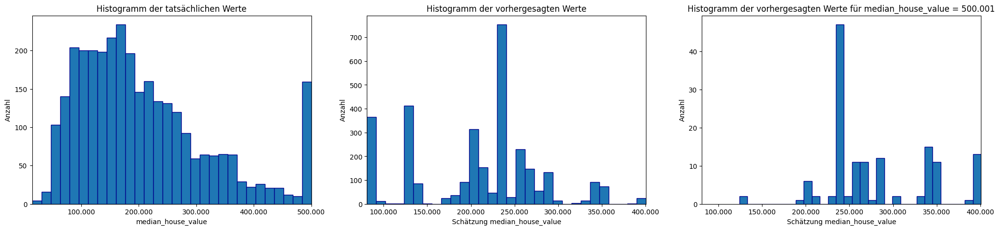

In [58]:
plot_model_hist(prediction=predict_a6c, validation=y_val_cat)

Die Histogramme der tatsächlichen und der geschätztenm Werte sind wieder kaum Vergleichbar, im Unterschied zum kategoriellen linearen Modell ist jetzt nur die Wertebereiche ähnlich zu den tatsächlichen Werten. Die bereits in den vorhergehenden Plots auffallenden Cluster sind hier ebenfalls wieder sichtbar, für die Bezirke mit maximalem tatsächlichem Hauspreis scheinen sich die Schätzungen aber nun eher auf mehrere Bereiche zu verteilen, wobei die Gruppe unterhalb von 250.000 immer noch die größte ist.

Wie bereits beim kategoriellen linearen Modell schätzt also auch das kategorielle CatBoost-Modell den tatsächlichen Hauspreis deutlich schlechter alsdie beiden numerischen Modelle, es scheint aber etwas besser dafür geeignet zu sein, die Extremwerte zusammenzufassen.

Die Feature Importance für die kategoriellen Merkmale sieht wie folgt aus:

In [59]:
list_feature_importance(model=model_a6c, columns=x_train_cat.columns)

Feature Importance von ocean_proximity: 57.043379369736805
Feature Importance von county_name: 42.95662063026324


Aufgrund der Anzahl der Ausprägungen wird für __county_name__ nun die Feature Importance auf Werte > 1 eingeschränkt und die Feature Importance der beiden Merkmale getrennt

Laut der Feature_Importance ist __ocean_proximity__ wichtiger als __county_name__, was darauf zurückzuführen sein könnte, dass die teureren Bezirke eher küstennah liegen und somit vor allem basierend auf __ocean_proximity__ unterschieden wird, ob sich der Bezirk im Inland oder an der Küste liegt und __county_name__ eher für die Unterscheidung innerhalb dieser Gruppen relevant ist.

Bei dem numerischen CatBoost hatte auch bereits die Lage des Bezirks, dort über Längen- und Breitengrade abgebildet, eine hohe Bedeutung, dort wurde aber auch das Einkommen als wichtig identifiziert. Im Gegensatz dazu sind im rein kategoriellen Modell nur Informationen über die Lage des Bezirks verfügbar.

### [Aufgabe A-7: Benchmark-Modelle mit numerischen und kategoriellen Features erstellen [Lernziele 3.3/3.4, 4.1 & 6; 7 Punkte]](#toc0_)

#### Aufgabenteil A-7a
Analog zu den Aufgaben A-4 und A-6 ist ein lineares Modell mit Berücksichtigung sowohl der numerischen Merkmale als auch der kategoriellen Merkmale ocean_proximity und county_name zu erstellen. Die Ergebnisse der Modellierung sind auszugeben und zu kommentieren sowie die Ergebniswerte samt Laufzeit zu speichern. Wie ist dieses Modell im Vergleich zu den beiden anderen (linearen) zu bewerten?

Zunächst werden Trainings- und Validierungsdaten mit allen Merkmalen nach __sample__ getrennt angelegt. Die Zielwerte bleiben weiter unverändert und können deshalb übernommen werden.

In [60]:
x_train_full = reduced_housing_sample[reduced_housing_sample['sample'] == 'A'].drop(labels=['median_house_value', 'sample'], axis=1)
y_train_full = y_train

x_val_full = reduced_housing_sample[reduced_housing_sample['sample'] == 'B'].drop(labels=['median_house_value', 'sample'], axis=1)
y_val_full = y_val

Anschließend werden diese Daten genutzt, um (analog zu den vorhergehenden Modellen) das lineare Modell mit allen Merkmalen zu trainieren, wobei die kategoriellen Merkmale wieder für das automatische Encoding gekennzeichnet werden. Zusätzlich wird dabei die Laufzeit des Trainingsprozesses gemessen und analog zum RMSE abgelegt.

In [61]:
model_name = 'Modell A-7a'
model_description[model_name] = 'lineares Modell mit allen Merkmalen'

model_a7a = ols('median_house_value ~ latitude + longitude + housing_median_age + population + median_income + rooms_per_house + C(ocean_proximity) + C(county_name)', data=pd.concat([x_train_full, y_train_full], axis=1))
start = time()
predict_model_a7a = model_a7a.fit()
model_training_time[model_name] = time()-start

predict_a7a = predict_model_a7a.predict(x_val_full)
model_rmse[model_name] = root_mean_squared_error(y_val_full, predict_a7a)

print_model_stats(model_name)

RMSE 69098 und Trainingszeit 0.055 Sekunden für lineares Modell mit allen Merkmalen


Zum Vergleich nochmal die RMSE der bisherigen linearen Modelle:

In [62]:
print_model_stats('Modell A-4d')
print_model_stats('Modell A-6b')

RMSE 74509 für lineares Modell mit numerischen Merkmalen
RMSE 91193 für lineares Modell mit kategoriellen Merkmalen


Der RMSE des lineare Modell mit allen Merkmalen ist also geringer als die RMSE der beiden vorhergehenden linearen Modelle, das Modell mit allen Merkmalen ist nach dieser Kennzahl also das beste lineare Modell.

Es folgen wieder die bereits bekannten Plots, um das Modell besser bewerten zu können.

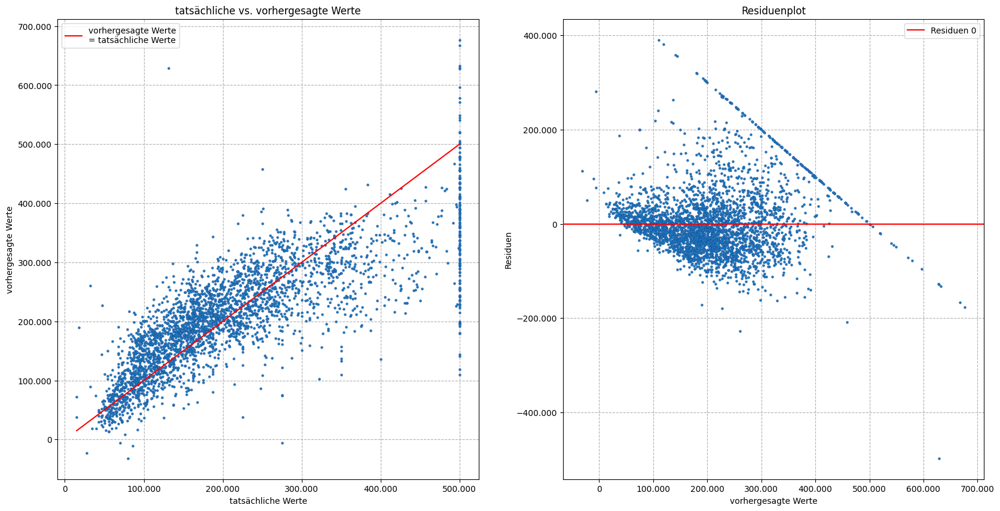

In [63]:
plot_model_scatter(prediction=predict_a7a, validation=y_val_full)

Die Gegenüberstellung der tatsächlichen und vorhergesagten Werte ähnelt sehr stark dem rein numerischen linearen Modell. Bei genauerer Betrachtung scheint das neue Modell im Bereich bis ca 100.000 tatsächlichem Preis etwas geringere Werte zu liefern, während die Schätzungen ab ca. 250.000 tatsächlichem Wert etwas höher sind, was beides zu der leichten Reduktion des RMSE beiträgt. Im Bereich 100.000 bis 200.000 ist weiter eine leichte Tendenz zur Überbewertung ersichtlich, während das Modell den Hauspreis für Bezirke über 300.000 weiter deutlich unterbewertet. Für die Schätzungen im Maximum der der tatsächlichen Werte ist in dieser Darstellung keine signifikanter Unterschied erkennbar. Der Vergleich zum rein kategoriellen linearen Modell deckt sich hier im Wesentlichen mit den Beobachtungen aus dem Vergleich des rein kategoriellen mit dem rein numerischen Linearen Modells: Die Nutzung numerischer Merkmale führt grundsätzlich zu einer besseren Schätzung, hat aber auch eine stärkere Streuung der Schätzungen für die Maximalwerte zur Folge.

Auch der Residuenplot ähnelt sehr stark dem rein numerische Modell. Die im ersten Plot sichtbaren Verbesserungen sind hier etwas weniger sichtbar, stattdessen ist aber ersichtlich, dass mit dem gemischten linearen etwas mehr bzw. extremere Ausreißer auftreten. Die Linie aus den Schätzungen für die Maximalwerte erscheint hier etwas stärker auf den Bereich 250.000 bis 500.000 konzentriert als im rein numerischen Modell, aber auch hier deutlich stärker gestreut als im rein kategoriellen linearen Modell.

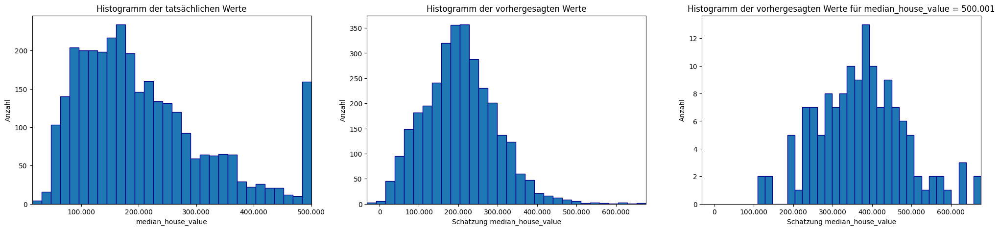

In [64]:
plot_model_hist(prediction=predict_a7a, validation=y_val_full)

Im Vergleich zum rein numerischen linearen Modell, ist im gemischten linearen Modell eine leichte Verschiebung der Werte um 200.000 in den Bereich unter 100.000. Zudem ist die Verteilung der Schätzungen für die Maximalwerte gleichmäßiger und etwas stärker auf den Bereich um 400.000 gebündelt. Da für das rein kategorielle lineare Modell aus den Histogrammen, bis auf eine starke Fokussierung der 500.001er-Bezirke auf den Bereich unter 250.000, keine nutzbaren Erkenntnisse für weitere die Modellierung gewonnen werden konnten, deckt sich der Vergleich mit dem gemischten linearen Modell im Wesentlichen mit dem Vergleich zwischen den beiden vorherigen linearen Modellen.

#### Aufgabenteil A-7b
Analog zu den Aufgaben A-4 und A-6 ist CatBoost (ohne weitere Anpassungen) mit Berücksichtigung sowohl der numerischen Merkmale als auch der kategoriellen Merkmale ocean_proximity und county_name anzuwenden. Ein Ergebnisbericht ist auszugeben und die Ergebniswerte samt Laufzeit zu speichern. Zusätzlich ist eine grafische Feature Importance auszugeben und zusammen mit den Ergebniswerten zu kommentieren. Wie ist dieses Modell im Vergleich zu den beiden anderen (CatBoost) zu bewerten?

Da die Daten bereits in [Aufgabenteil A-7a](#aufgabenteil-a-7a) passend strukturiert und aufgeteilt wurden, können sie hier analog weiterverwendet werden. Die Modellierung erfolgt damit analog zu den bisherigen CatBoost-Modellen mit zusätzlicher Laufzeitmessung für das Training.

In [65]:
model_name = 'Modell A-7b'
model_description[model_name] = 'CatBoost mit allen Merkmalen'

model_a7b = CatBoostRegressor(verbose=False, cat_features=['ocean_proximity', 'county_name'], allow_writing_files=False)
start = time()
model_a7b.fit(x_train_full, y_train_full)
model_training_time[model_name] = time()-start

predict_a7b = model_a7b.predict(x_val_full)
model_rmse[model_name] = root_mean_squared_error(y_val_full, predict_a7b)

print_model_stats(model_name)

RMSE 48471 und Trainingszeit 34.906 Sekunden für CatBoost mit allen Merkmalen


Zum Vergleich die RMSE der CatBoost-Modelle mit getrennten Daten:

In [66]:
print_model_stats('Modell A-4e')
print_model_stats('Modell A-6c')

RMSE 48913 für CatBoost mit numerischen Merkmalen
RMSE 89633 für CatBoost mit kategoriellen Merkmalen


Wie bereits beim linearen Modell mit allen Merkmalen hat auch CatBoost mit allen Merkmalen einern geringeren RMSE als das rein numerische und das rein kategorielle CatBoost-Modell und ist somit nach dieser Metrik besser. Allerdings ist der Unterschied für CatBoost deutlich geringer als bei den linearen Modellen.

Zur weiteren bewertung des Modells folgen wieder die bereits bekannten Plots.

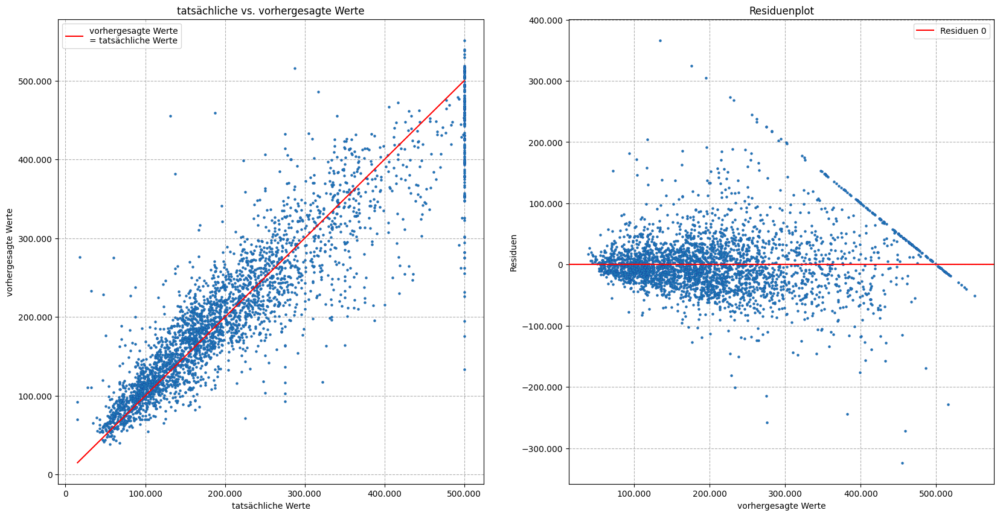

In [67]:
plot_model_scatter(prediction=predict_a7b, validation=y_val_full)

Wie bereits beim gemischten linearen Modell ähneln beide Plots wieder stark dem rein numerischen Modell, wobei hier nun noch weniger Unterschiede erkennbar sind. Die Wesentlichen scheinen sich hier die Ausreißer vom numerischen CatBoost zu unterscheiden und die Schätzungen der Maximalwerte liegen etwas anders, ohne jedoch über einen signifikant anderen Bereich gestreut zu sein. Der Großteil der Punktewolke ist jedoch in beiden Plots optisch nicht strukturell vom rein numerischen Modell zu unterscheiden.

Die hohe Ähnlichkeit zum rein numerischen CatBoost hat zur Folge, dass auch der Vergleich mit dem rein kategoriellen CatBoost dem Vergleich der beiden getrennten Modelle folgt. Das gemischte Modell liefert allgemein eine bessere Schätzung alsdas rein kategorielle Modell und durch die Überlagerung der Schätzungen wegen der eingeschränkten Ergebnissmenge des rein kategoriellen Modells ist die Konzentration der Schätzungen für die Extremwerte in dieser Darstellung kaum möglich.

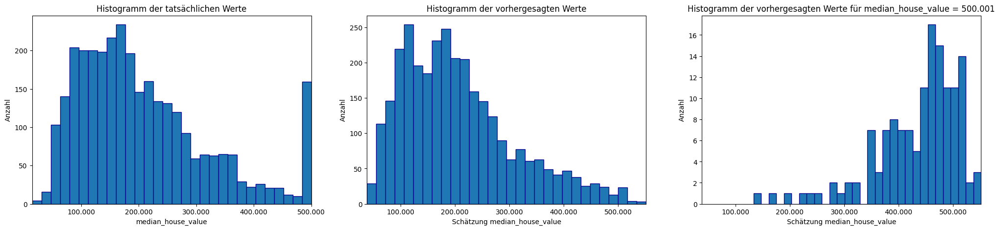

In [68]:
plot_model_hist(prediction=predict_a7b, validation=y_val_full)

Im Vergleich zum rein numerischen Modell zeigt das Histogramm der vorhergesagten Werte im Bereich um 150.000 eine leichte Verschiebung der Schätzungen Richtung 100.000, sonst sind aber keine signifikanten Unterschiede erkennbar. Die Schätzungen für die Extremwerte sind gegenüber dem rein numerischen Modell um 400.000 etwas stärker geglättet und um 500.000 etwas verschoben. Hier könnte aber auch die Lage der Bins die Darstellung der Veränderungen beeinflussen.

Gegenüber dem rein kategoriellen CatBoost zeigt das Histogramm der vorhergesagten Werte wieder eine deutlich bessere Schätzung, allerdings auch eine schwächere Bündelung der Schätzungen für die Extremwerte.

Die Feature Importance wird zunächst für alle Merkmale ausgegeben und auch direkt geplottet.

Feature Importance von median_income: 26.37651937823048
Feature Importance von longitude: 19.65372775170727
Feature Importance von latitude: 17.907517585287984
Feature Importance von ocean_proximity: 17.710342788801697
Feature Importance von county_name: 7.62638941635695
Feature Importance von housing_median_age: 5.193188593790991
Feature Importance von rooms_per_house: 3.604955802740375
Feature Importance von population: 1.9273586830842533


Text(0.5, 1.0, 'Feature Importance für CatBoost mit allen Merkmalen')

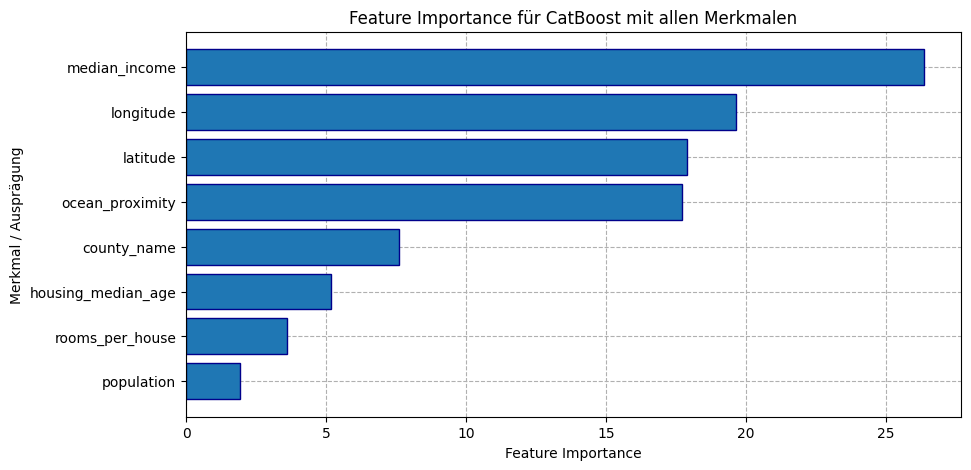

In [69]:
list_feature_importance(model=model_a7b, columns=x_train_full.columns)

feature_importance_a7b = pd.DataFrame({'Merkmal': x_train_full.columns, 'Importance': model_a7b.get_feature_importance(
)}).sort_values(by='Importance', ascending=True)
plt.figure(figsize=(10, 5))
plt.barh(range(len(feature_importance_a7b)), feature_importance_a7b['Importance'], 
         edgecolor='darkblue', zorder=2)
plt.yticks(range(len(feature_importance_a7b)),feature_importance_a7b['Merkmal'])
plt.grid(visible=True, linestyle='--')
plt.xlabel('Feature Importance')
plt.ylabel('Merkmal / Ausprägung')
plt.title(f'Feature Importance für {model_description.get(model_name)}')

Die drei wichtigsten Merkmale __median_income__, __longitude__ und __latitude__ waren auch im rein numerischen CatBoost die Hauptmerkmale. Dort waren sie allerdings noch ungefähr gleich gewichtet, während sie im gemischten Modell das __median_income__ deutlich relevanter ist alsdie beiden Koordinaten. Knapp dahinter an vierter Stelle liegt die __ocean_proximity__, die im rein kategoriellen CatBoost das wichtigste Merkmal war. Dahinter liegt wieder __county_name__, allerdings ist dieses Merkmal in Relation zu __ocean_proximity__ deutlich weniger von Bedeutung alsim rein kategoriellen Modell. Die restlichen numerischen Merkmale scheinen auf einem ähnlichen absoluten und (zueinander) relativen Niveau zu liegen, wie im rein numerischen Modell.

Es scheint so, dass der Unterschied zwischen dem rein numerischen und dem gemischten Modell darin liegt, dass durch die zusätzlichen kategoriellen Merkmale die Lage des Bezirks über die in den Koordinaten enthaltenen Informationen hinaus weiter differenziert werden können, wodurch die relative Bedeutung der Koordinaten etwas sinkt, zusammen mit den weiteren Lage-Merkmalen aber wieder einen Großteil der Feature Importance ausmacht.

#### Aufgabenteil A-7c
Wie sind die Laufzeiten und Prognosefehler der in dieser Aufgabe erstellten Modelle im Vergleich und wie sind die Werte und Unterschiede zu bewerten? Basierend auf den Ergebnissen dieses Abschnitts soll ein abschließendes Fazit gezogen werden.

RMSE und Trainingsdauer für die beiden gemischten Modelle:

In [70]:
print_model_stats('Modell A-7a')
print_model_stats('Modell A-7b')

RMSE 69098 und Trainingszeit 0.055 Sekunden für lineares Modell mit allen Merkmalen
RMSE 48471 und Trainingszeit 34.906 Sekunden für CatBoost mit allen Merkmalen


Der ca. 30% niedrigere RMSE zeigt, dass CatBoost ein deutlich besseres Modell liefert als die lineare Regression, dies wird allerdings mit einer deutlich höheren Trainingsdauer erkauft. 

Die betrachtete Feature Importance zeigt, dass die Lage des Bezirks einen großen Anteil an den Hauspreisen hat. Damit steht ein einfaches lineares Modell aber vor dem Problem, dass diese Lage auf Basis der Koordinaten-Merkmale __longitude__ und __latitude__ nicht einfach linear abgebildet werden kann. Während CatBoost hier einfacher Regionen isolieren und mit den kategoriellen Merkmalen weiter verfeinern kann, muss in einem linearen Modell entweder die Bedeutung der Koordinaten deutlich geringer sein und ein ausreichend deutliches Muster in den kategoriellen Merkmalen gefunden werden oder die kategoriellen Merkmale müssen dazu geeignet sein, die Ungenauigkeiten infolge von stark gewichteten Koordinaten zu kompensieren.

## Teil B: Prognosemodelle optimieren und Overfitting verhindern [60 Punkte]

### Aufgabe B-1: Encoding, Skalierung und Vergleich [Lernziele 3.3/3.4, 4.1 & 6; 11 Punkte]

#### Aufgabenteil B-1a
Die numerischen Daten sind geeignet zu skalieren. Das ausgewählte Skalierungsverfahren ist kurz zu beschreiben und die Auswahl kurz zu begründen. Es sind vor und nach Skalierung die gleichen sieben zufälligen Zeilen der Daten anzuzeigen (die gleichen Datensätze) und das Ergebnis ist zu bewerten.

Zur Standardisierung wird der StandardScaler genutzt. Dieser transformiert die Daten, indem der Mittelwert des jeweiligen Merkmals von allen Daten subtrahiert und das Ergebnis durch die Standardabweichung des Merkmals dividiert wird. Durch diese Transformation haben alle transformierten Merkmale den Mittelwert 0 und die Standardabweichung und Varianz 1.

Es kommt ein gesonderter Scaler für die Zielvariable zum Einsatz, um die Transformation für die Vorhersage leichter umkehren zu können

In [71]:
x_scaler = StandardScaler()
y_scaler = StandardScaler()
scaled_housing_sample = pd.DataFrame(x_scaler.fit_transform(reduced_housing_sample.drop(columns=['median_house_value', 'ocean_proximity', 'county_name', 'sample'])),
                                     columns=reduced_housing_sample.drop(columns=['median_house_value', 'ocean_proximity', 'county_name', 'sample']).columns)
scaled_house_value = pd.DataFrame(y_scaler.fit_transform(reduced_housing_sample[['median_house_value']]),
                                  columns=['median_house_value'])
scaled_housing_sample = pd.concat([scaled_house_value,
                                   scaled_housing_sample,
                                   reduced_housing_sample[['ocean_proximity', 'county_name', 'sample']]],
                                  axis=1)
np.random.seed(42)
random_rows = np.random.choice(reduced_housing_sample.index,
                               7,
                               replace=False)

print("Vor der Skalierung:")
print(reduced_housing_sample.loc[random_rows])
print("Nach der Skalierung:")
print(scaled_housing_sample.loc[random_rows])

Vor der Skalierung:
       latitude  longitude  housing_median_age  population  median_income  median_house_value ocean_proximity    county_name sample  rooms_per_house
20046     39.51    -121.56                  46         871         1.6352               53100          INLAND          Butte      A         5.432277
3024      33.77    -117.23                   5        1666         2.0000               83000          INLAND      Riverside      A         4.572668
15663     37.74    -122.50                  45        1098         3.7552              296600      NEAR OCEAN  San Francisco      C         5.178363
20484     40.78    -124.16                  43         932         2.9038               82000      NEAR OCEAN       Humboldt      A         5.673418
9814      34.20    -118.87                  26         775         7.0010              286800       <1H OCEAN        Ventura      A         7.885246
13311     37.25    -121.92                  34        1035         4.7917             

Die zuvor sehr unterschieldichen Merkmale sind jetzt alle in eine vergleichbare Größenordnung skaliert, es gibt auch keine festen Vorzeichen mehr für die einzelnen Merkmale. Durch die Aufteilung der Daten in Zielvariable, numerische Merkmale und kategorielle Merkmale gibt es teilweise Verschiebungen in der Reihenfolge der Spalten nachdem die Daten wieder zusammengesetzt wurden.

#### Aufgabenteil B-1b
Die kategoriellen Daten sind geeignet in numerische Werte zu überführen. Das ausgewählte Encoding ist kurz zu beschreiben und die Auswahl kurz zu begründen. Für die sieben Zeilen aus Teilaufgabe a) sind die bearbeiteten Datensätze anzuzeigen und das Ergebnis ist zu bewerten. Es ist darauf einzugehen, wie viele Merkmale ggf. neu hinzugekommen sind und ob die Daten zu einem überbestimmten linearen Modell führen würden.

Zur Transformation der kategoriellen in numerische Merkmale wird One Hot Encoding genutzt. Dabei wird für jede auftretende Ausprägung der Merkmale eine binäre Dummy-Variable erzeugt, die mit 1 belegt wird, wenn das ursprüngliche Merkmal diese Ausprägung hat und mit 0, wenn es eine andere Ausprägung hat. Für beide kategoriellen Merkmale wird dabei die erste Ausprägung nicht als neues Merkmal abgebildet, diese Information ist aber durch das Fehlen der anderen Ausprägungen implizit abgebildet. Dieses Verfahren hat gegenüber anderen Encodings den Vorteil, dass es keine inhärente Ordnung des Merkmals voraussetzt. Für __ocean_proximity__ wäre eventuell auch eine direkte Übersetzung in ordinalskalierte numerische Werte denkbar, da die Ausprägungen als Abstand zum Ozean angeordnet werden könnten. Dafür wären allerdings weitere Informationen zur Einordnung der Ausprägung _NEAR BAY_ nötig. Gegebenenfalls könnten _NEAR BAY_ und _NEAR OCEAN_ hierbei auch zu einer gemeinsamen numerischen Ausprägung zusammengefasst werden.

In [72]:
transformed_housing_sample = pd.get_dummies(scaled_housing_sample, columns=['ocean_proximity', 'county_name'], drop_first=True)
print("Nach Encoding:")
print(transformed_housing_sample.loc[random_rows])

Nach Encoding:
       median_house_value  latitude  longitude  housing_median_age  population  median_income  rooms_per_house sample  ocean_proximity_INLAND  ocean_proximity_ISLAND  ocean_proximity_NEAR BAY  ocean_proximity_NEAR OCEAN  county_name_Alpine  \
20046           -1.332456  1.815692  -0.993418            1.379433   -0.489632      -1.176703         0.001324      A                    True                   False                     False                       False               False   
3024            -1.073341 -0.871699   1.167818           -1.878348    0.212395      -0.984680        -0.346117      A                    True                   False                     False                       False               False   
15663            0.777728  0.987002  -1.462601            1.299975   -0.289179      -0.060781        -0.101304      C                   False                   False                     False                        True               False   
20484        

Für Merkmale mit vielen Ausprägungen, wie zum Beispiel __county_name__, führt One Hot Encoding sehr viele neue Merkmale ein, die zu einem überbestimmten linearen Modell führen können.

#### Aufgabenteil B-1c
Im Anschluss ist der nun skalierte und encodierte Datensatz in Trainingsdaten (sample = A) und Validierungsdaten (sample = B) aufzusplitten und die Zielvariable von den beschreibenden Variablen zu trennen.

Die Daten können analog zu [Aufgabenteil A-7a](#aufgabenteil-a-7a) aus den transformierten Daten übernommen werden, allerdings muss nun auch die Zielvariable für die Trainingsdaten neu extrahiert werden, da diese ebenfalls skaliert wurde. Die Zielvariable für die Validierungsdaten wird weiter aus y_val übernommen, da stattdessen das Ergebnis der Vorhersage auf den Validierungsdaten wieder zurück transformiert werden soll, um die Vergleichbarkeit mit den vorherigen Modellen zu gewährleisten.

In [73]:
x_train_transformed = transformed_housing_sample[transformed_housing_sample['sample'] == 'A'].drop(labels=['median_house_value', 'sample'], axis=1)
y_train_transformed = transformed_housing_sample[['median_house_value', 'sample']][transformed_housing_sample['sample'] == 'A']['median_house_value']

x_val_transformed = transformed_housing_sample[transformed_housing_sample['sample'] == 'B'].drop(labels=['median_house_value', 'sample'], axis=1)
y_val_transformed = y_val

#### Aufgabenteil B-1d
An die so aufbereiteten Daten ist erneut ein CatBoost-Modell anzupassen. Dabei ist eine Zeitmessung durchzuführen und die Feature Importance auszugeben. Die Güte des Modells (RMSE) ist zunächst für den Trainingsdatensatz, im Anschluss für den Validierungsdatensatz zu ermitteln und die Ergebnisse sind zu vergleichen und zu interpretieren. Abschließend ist ein Vergleich mit dem CatBoost-Modell aus Aufgabe A-7 vorzunehmen und auf Laufzeit, Modellgüte (Validierung) und ggf. Auffälligkeiten im Vergleich der Feature Importances einzugehen, mögliche Ursachen zu ergründen und eine Bewertung vorzunehmen.

In [74]:
model_name = 'Modell B-1d'
model_description[model_name] = 'CatBoost mit transformierten Merkmalen'

model_b1d = CatBoostRegressor(verbose=False, allow_writing_files=False)
start = time()
model_b1d.fit(x_train_transformed, y_train_transformed)
model_training_time[model_name] = time()-start

print(f'RMSE für die Trainingsdaten: {round(root_mean_squared_error(y_train, y_scaler.inverse_transform(model_b1d.predict(x_train_transformed).reshape(-1, 1))))}')
predict_b1d = y_scaler.inverse_transform(model_b1d.predict(x_val_transformed).reshape(-1, 1)).flatten()
model_rmse[model_name] = root_mean_squared_error(y_val_full, predict_b1d)

print_model_stats(model_name)

RMSE für die Trainingsdaten: 37683
RMSE 48461 und Trainingszeit 3.567 Sekunden für CatBoost mit transformierten Merkmalen


Der RMSE auf den Trainingsdaten ist niedriger als für die Validierungsdaten, was auf ein gewisses Maß an Overfitting hinweist. Zum Vergleich die gleiche Gegenüberstellung für das Modell aus [Aufgabenteil A-7b](#aufgabenteil-a-7b):

In [75]:
print(f'RMSE für die Trainingsdaten: {round(root_mean_squared_error(y_train_full, model_a7b.predict(x_train_full)))}')
print_model_stats('Modell A-7b')

RMSE für die Trainingsdaten: 38056
RMSE 48471 und Trainingszeit 34.906 Sekunden für CatBoost mit allen Merkmalen


Im Vergleich zu dem neuen Modell ist der RMSE sowohl für die Trainings- als auch die Validierungsdaten nur minimal höher, wobei ebenfalls der Prognosefehler für die Trainingsdaten deutlich niedriger ist als für die Validierungsdaten.  Auch hier scheint also bereits ein gewisses Maß an Overfitting vorzuliegen. Offensichtlich haben die Standardisierung der numerischen Variablen und das Encoding der kategoriellen Variablen also keinen Einfluss auf das Overfitting, dieses ist vermutlich eher in der Granularität der kategoriellen Variablen, insbesondere __county_name__ begründet.<br>
Der wesentliche Unterschied ist, dass das neue Modell deutlich schneller trainiert werden kann. CatBoost scheint also relativ viel Rechenaufwand in sein internes Encoding der kategoriellen Variablen zu investieren.

Trots der sehr ähnlichen RMSE folgt zunächst für das neue Modell wieder ein kurzer Blilck auf die bereits bekannten Plots.

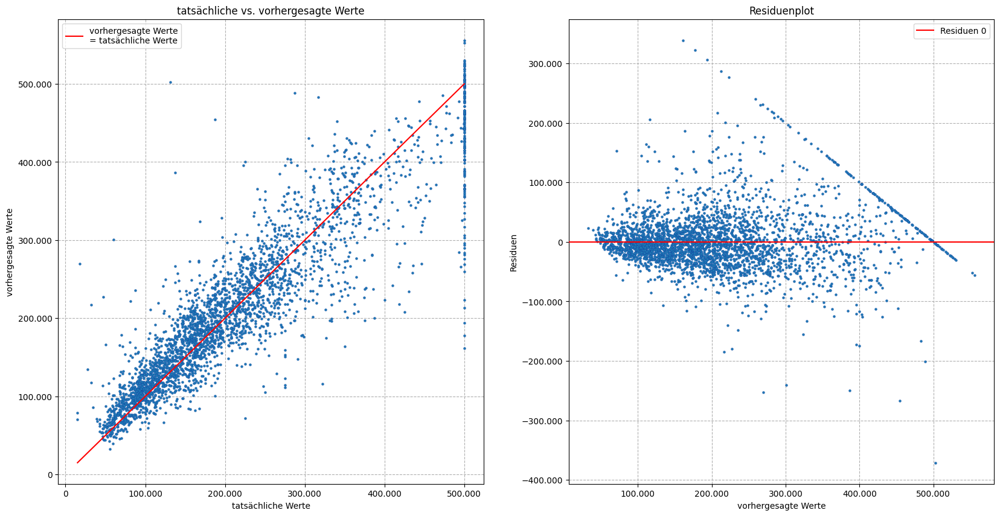

In [76]:
plot_model_scatter(prediction=predict_b1d, validation=y_val_transformed)

Wie an den sehr ähnlichen RMSE bereits erahnt werden konnte, ist sowohl in der Gegenüberstellung der tatsächlichen und vorhergesagten Werten alsauch im Residuenplot kein signifikanter struktureller Unterschied zwischen den beiden CatBoost mit allen Merkmalen erkennbar. Lediglich die Ausreißer sind etwas verschoben und die Schätzungen der Minimalwerte sind im Bereich 400.000 bis 500.000 etwas anders gruppiert, wobei letzteres wieder besser über die Histogramme vergleichbar ist.

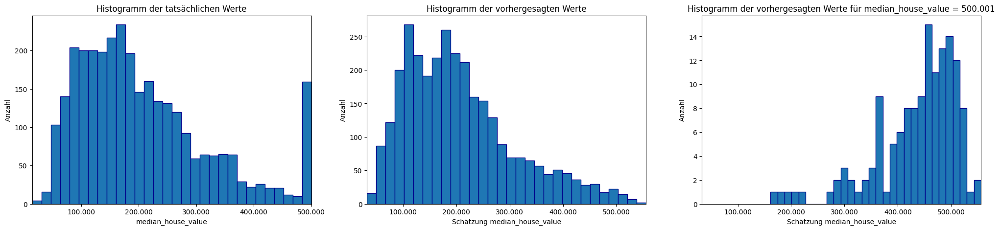

In [77]:
plot_model_hist(prediction=predict_b1d, validation=y_val_full)

Das Histogramm der vorhergesagten erte ähnelt ebenfalls stark dem Modell aus [Aufgabenteil A-7b](#aufgabenteil-a-7b), wobei es leichte Verschiebungen in den Bereichen über 100.000, über 200.000 und um 500.000 zu geben scheint. Im Vergleich zu den tatsächlichen Werten unterscheidet sich die Verteilung der Hauspreise im Wesentlichen durch Ungenauigkeiten im Bereich 100.000 - 200.000 und die fehlenden Maximalwerte. Das Histogramm der Schätzungen für die Extremwerte weist etwas stärkre Verschiebungen im Bereich 400.000 bis 500.000 auf, wobei deutlichere "Lücken" entstehen. Für beide Plots der Schätzungen muss allerdings berücksichtigt werden, dass die Darstellung solcher Verschiebungen durch die Abgrenzung der Bins in einem Histogramm verzerrt sein kann.

Feature Importance der transformierten Merkmale:

In [78]:
list_feature_importance(model=model_b1d, columns=x_train_transformed.columns)

Feature Importance von median_income: 28.11065115461901
Feature Importance von longitude: 19.459154891952345
Feature Importance von latitude: 16.42754847309836
Feature Importance von ocean_proximity_INLAND: 14.371031227909233
Feature Importance von housing_median_age: 4.8566861218490605
Feature Importance von rooms_per_house: 3.553236828230546
Feature Importance von county_name_San Francisco: 2.3701092662646195
Feature Importance von ocean_proximity_NEAR OCEAN: 2.073921082433046
Feature Importance von population: 1.8701805581236177
Feature Importance von county_name_Los Angeles: 1.7151857756639368
Feature Importance von county_name_Santa Clara: 1.0859509383164845
Feature Importance von ocean_proximity_NEAR BAY: 0.9419884347041517
Feature Importance von county_name_Santa Barbara: 0.7100569930789338
Feature Importance von county_name_San Mateo: 0.5138902685457356
Feature Importance von county_name_Orange: 0.25785452477151405
Feature Importance von county_name_Ventura: 0.21183153181252898

Im Vergleich zum gemischten CatBoost mit nicht transformierten Merkmalen, ist die Feature Importance von __median_income__ leicht gestiegen und für die restlichen numerischen Merkmale leicht gesunken. Die Feature Importance von __ocean_proximity__ im vorherigen Modell ist anscheinend hauptsächlich der Ausprägung _INLAND_ geschuldet, wobei _NEAR OCEAN_ zumindest noch etwas wichtiger ist als _NEAR BAY_ und _<1H OCEAN_. Dass die Ausprägung _ISLAND_ keine große Rolle spielt, war in Anbetracht der geringen Anzahl an Datensätzen mit dieser Ausprägung bereits absehbar. Die Bedeutung von __county_name__ verteilt sich auf viele einzelne Ausprägungen, wobei hier vor allem _San Francisco_, _Los Angeles_ und weitere, bereits in [Aufgabenteil A-3a](#aufgabenteil-a-3a) als besonders teuer aufgefallene, Küstenregionen wichtig sind. Viele Ausprägungen von __county_name__ haben jedoch auch kaum bis gar keine Feature Importance.

Die naheliegende Interpretation dieser Ergebnisse ist:<br>
Das Modell ordnet die Lage des Bezirks anhand von Längen- und Breitengraden ein, wobei das Inland dabei als relativ homogen getrennt werden kann. Auf Basis von _county_name_ und den weiteren Ausprägungen von __ocean_proximity__ werden dann besonders teure Regionen weiter differenziert. Neben der Lage des Bezirks wird auch eine sozioökonimische Einordnung anhand des __median_income__ berücksicht. Dieses Merkmal scheint in den verfügbaren Daten die sinnvollste Beurteilung der nötigen Kaufkraft zu sein. Eher strukturelle Kennzahlen, wie das Alter der Häuser oder ihre Größe, repräsentiert durch die Anzahl der Räume, und in geringerem Maß die Bevölkerungszahl des Bezirks spielen ebenfalls eine Rolle, sind aber deutlich weniger relevant als Lage und Einkommen. Die Bevölkerungszahl ist eventuell auch nur bedingt aussagekräftig, da die zugehörigen Bezirke nicht vergleichbar groß sind. Die Bevölkerungsdichte hätte vermutlich mehr Informationsgehalt, wäre aber gegebenenfalls auch stark mit den Lagemerkmalen, insbesondere einigen Ausprägungen von __county_name__ korreliert.

Die sehr geringe Feature Importance vieler Ausprägungen von __county_name__ zeigt, dass die Modellkomplexität reduziert werden könnte, indem diese unwichtigen counties zusammengefasst, bzw. die daraus resultierenden Dummyvariablen entfernt werden. Das könnte auch dabei helfen, das Overfitting des Modells zu reduzieren. Eine Zusammenfassung dieser Ausprägungen könnte auch dabei helfen, die Trainingsdauer des Modells ohne transformierte Daten zu reduzieren.

### Aufgabe B-2: Under-/Overfitting am Beispiel von Neuronalen Netzen [Lernziele 3.2, 3.3/3.4, 4.1, 4.3 & 6; 18 Punkte]

#### Aufgabenteil B-2a
Es ist ein Teildatensatz aus dem oben erstellten encodierten und skalierten Datensatz zu erstellen, der nur die ersten 100 Zeilen des Datensatzes enthält. Damit sind 3 einfache Neuronale Netze unterschiedlicher Größe mit Keras/Tensorflow sequenziell zu definieren, zu kompilieren, anzuzeigen (via summary) und jeweils über eine hohe Anzahl von Epochen (> 2000) zu trainieren:
- klein: 1.000 bis 10.000 Gewichte
- mittel: 50.000 bis 100.000 Gewichte
- groß: mindestens 1.000.000 Gewichte

Die history der einzelnen Modelle ist in einem (einzigen) Diagramm zu plotten. Dabei soll der Verlauf des RMSE auf den Trainingsdaten sowie der Verlauf des RMSE auf der internen Modellvalidierung (Split 0.2) dargestellt werden. Die Ergebnisse sind zu beschreiben und zu bewerten.

Zunächst wird der transformierte Datensatz auf die ersten 100 Zeilen reduziert:

In [79]:
small_housing_sample = transformed_housing_sample.iloc[:100]
small_x = np.array(small_housing_sample.drop(columns=['median_house_value', 'sample'])).astype(np.float32)
small_y = np.array(small_housing_sample['median_house_value']).astype(np.float32)

In [80]:
print(small_housing_sample)

    median_house_value  latitude  longitude  housing_median_age  population  median_income  rooms_per_house sample  ocean_proximity_INLAND  ocean_proximity_ISLAND  ocean_proximity_NEAR BAY  ocean_proximity_NEAR OCEAN  county_name_Alpine  \
0            -1.207665 -1.447568   1.262653           -1.719432   -0.210588      -1.370673        -0.849904      C                   False                   False                     False                        True               False   
1            -0.541245 -1.442886   1.237697           -1.639974    2.977234       0.046126         0.049130      C                   False                   False                     False                        True               False   
2            -0.849757 -1.442886   1.252671           -1.878348    1.641175      -1.280294        -0.668925      A                   False                   False                     False                        True               False   
3            -0.984947 -1.442886   1.262

Da die transformierten Daten ohne die Zielvariable 69 Merkmale haben, entstehen zwischen Input-Layer und Hidden Layer $(69+1)\cdot Neuronen$ Gewichte und weitere $(Neuronen+1)\cdot 1$ Gewichte zwischen Hidden layer und Output-Layer. Damit ergeben sich für die drei Netze die folgenden Neuronenanzahlen:
- klein: 15 bis 140 Neuronen
- mittel: 705 bis 1.408 Neuronen
- groß: mindestens 14.085 Neuronen

Zunächst werden die drei Neuronalen Netze nur definiert, kompiliert und angezeigt.<br> 
Für die Definition wird nicht Sequential(), sondern Model() genutzt, um das Modell einfacher überschreiben zu können, die Layer werden dabei aber so strukturiert, dass sich die resultierenden Netze nicht von Sequential() unterscheiden.

In [81]:
set_random_seed(42)  # Zur Reproduzierbarkeit der kommentierten Ergebnisse

neurons_small = 15
neurons_medium = 705
neurons_large = 14085

model_name = 'Modell B-2a klein'
model_description[model_name] = f'Neuronales Netz mit transformierten Merkmalen und {neurons_small} Neuronen'

input_layer_model_b2a_small = Input(shape=(small_x.shape[1],),
                                    name='input_layer_small')
hidden_layer_model_b2a_small = Dense(neurons_small,
                                     name='hidden_layer_small'
                                     )(input_layer_model_b2a_small)
output_layer_model_b2a_small = Dense(1,
                                     name='output_layer_small'
                                     )(hidden_layer_model_b2a_small)

model_b2a_small = Model(inputs=input_layer_model_b2a_small,
                        outputs=output_layer_model_b2a_small,
                        name='small')
model_b2a_small.compile(optimizer=Nadam(),
                        loss='mse')
model_b2a_small.summary()

set_random_seed(42)  # Zur Reproduzierbarkeit der kommentierten Ergebnisse

model_name = 'Modell B-2a mittel'
model_description[model_name] = f'Neuronales Netz mit transformierten Merkmalen und {neurons_medium} Neuronen'

input_layer_model_b2a_medium = Input(shape=(small_x.shape[1],),
                                     name='input_layer_medium')
hidden_layer_model_b2a_medium = Dense(neurons_medium,
                                      name='hidden_layer_medium'
                                      )(input_layer_model_b2a_medium)
output_layer_model_b2a_medium = Dense(1,
                                      name='output_layer_medium'
                                      )(hidden_layer_model_b2a_medium)

model_b2a_medium = Model(inputs=input_layer_model_b2a_medium,
                         outputs=output_layer_model_b2a_medium,
                         name='medium')
model_b2a_medium.compile(optimizer=Nadam(),
                         loss='mse')
model_b2a_medium.summary()

set_random_seed(42)  # Zur Reproduzierbarkeit der kommentierten Ergebnisse

model_name = 'Modell B-2a groß'
model_description[model_name] = f'Neuronales Netz mit transformierten Merkmalen und {neurons_large} Neuronen'

input_layer_model_b2a_large = Input(shape=(small_x.shape[1],),
                                    name='input_layer_large')
hidden_layer_model_b2a_large = Dense(neurons_large,
                                     name='hidden_layer_large'
                                     )(input_layer_model_b2a_large)
output_layer_model_b2a_large = Dense(1,
                                     name='output_layer_large'
                                     )(hidden_layer_model_b2a_large)
model_b2a_large = Model(inputs=input_layer_model_b2a_large,
                        outputs=output_layer_model_b2a_large,
                        name='large')
model_b2a_large.compile(optimizer=Nadam(),
                        loss='mse')
model_b2a_large.summary()

Model: "small"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_small (InputLayer)  │ (None, 67)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ hidden_layer_small (Dense)      │ (None, 15)             │         1,020 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer_small (Dense)      │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,036 (4.05 KB)

 Trainable params: 1,036 (4.05 KB)

 Non-trainable params: 0 (0.00 B)

Model: "medium"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_medium (InputLayer) │ (None, 67)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ hidden_layer_medium (Dense)     │ (None, 705)            │        47,940 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer_medium (Dense)     │ (None, 1)              │           706 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 48,646 (190.02 KB)

 Trainable params: 48,646 (190.02 KB)

 Non-trainable params: 0 (0.00 B)

Model: "large"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_large (InputLayer)  │ (None, 67)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ hidden_layer_large (Dense)      │ (None, 14085)          │       957,780 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer_large (Dense)      │ (None, 1)              │        14,086 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 971,866 (3.71 MB)

 Trainable params: 971,866 (3.71 MB)

 Non-trainable params: 0 (0.00 B)

Im nächsten Schritt werden die drei Neuronalen Netze trainiert.

In [82]:
set_epochs = 2001
history_model_b2a_small = model_b2a_small.fit(small_x,
                                              small_y,
                                              validation_split=0.2,
                                              epochs=set_epochs,
                                              verbose=False)
history_model_b2a_medium = model_b2a_medium.fit(small_x,
                                                small_y,
                                                validation_split=0.2,
                                                epochs=set_epochs,
                                                verbose=False)
history_model_b2a_large = model_b2a_large.fit(small_x,
                                              small_y,
                                              validation_split=0.2,
                                              epochs=set_epochs,
                                              verbose=False)

Anschließend können die Plots erzeugt werden.

Text(0.5, 1.0, 'Verlauf des RMSE auf Trainings- und Validierungsdaten')

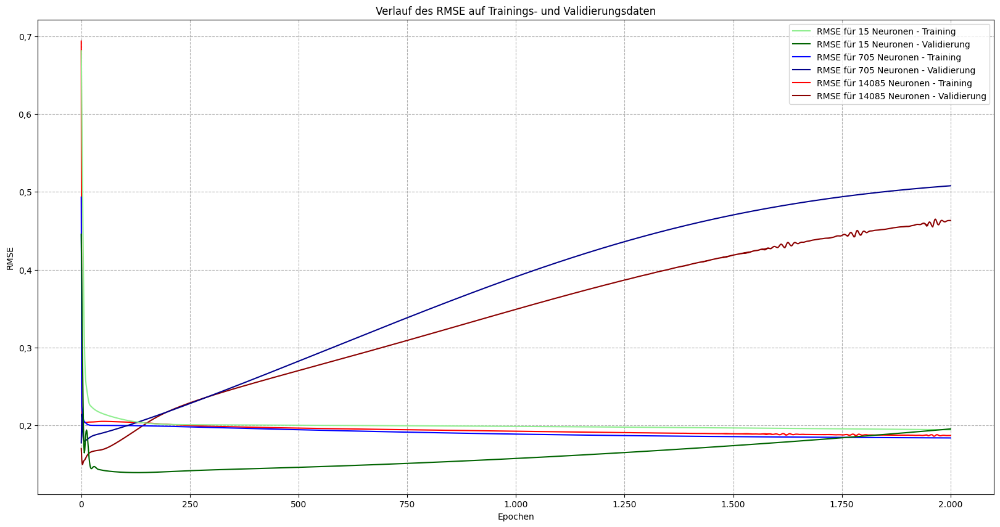

In [83]:
plt.figure(figsize=(20, 10))
plt.plot(np.sqrt(history_model_b2a_small.history['loss']),
         color='lightgreen', label=f'RMSE für {neurons_small} Neuronen - Training', zorder=6)
plt.plot(np.sqrt(history_model_b2a_small.history['val_loss']),
         color='darkgreen', label=f'RMSE für {neurons_small} Neuronen - Validierung', zorder=7)
plt.plot(np.sqrt(history_model_b2a_medium.history['loss']),
         color='blue', label=f'RMSE für {neurons_medium} Neuronen - Training', zorder=4)
plt.plot(np.sqrt(history_model_b2a_medium.history['val_loss']),
         color='darkblue', label=f'RMSE für {neurons_medium} Neuronen - Validierung', zorder=5)
plt.plot(np.sqrt(history_model_b2a_large.history['loss']),
         color='red', label=f'RMSE für {neurons_large} Neuronen - Training', zorder=2)
plt.plot(np.sqrt(history_model_b2a_large.history['val_loss']),
         color='darkred', label=f'RMSE für {neurons_large} Neuronen - Validierung', zorder=3)
plt.grid(visible=True, linestyle='--')
plt.legend()
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.title('Verlauf des RMSE auf Trainings- und Validierungsdaten')

Für das mittlere und das große Neuronale Netz erreicht der RMSE der Validierung bereits nach wenigen Epochen sein Minimum und beginnt wieder zu steigen, sodass er bereits nach ca. 150 bzw. ca. 200 Epochen den RMSE für die Trainingsdaten überschreitet. Spätestens ab diesem Punkt ist das Modell vermutlich overfitted und, während der RMSE des Trainings nach diesem Punkt nur noch sehr langsam fällt, steigt der RMSE für die Validierungsdaten weiter deutlich an. Für das kleine Netz hingegen sind offensichtlich mehr Epochen nötig, bevor der Validierungs-RMSE abflacht und (soweit in der Grafik erkennbar) erst nach mehreren hundert Epochen merklich steigt. Der RMSE des Trainings entwickelt sich nach ca. 150 Epochen relativ ähnlich zu den beiden größeren Modellen, sinkt aber etwas geringer. Erst zum Ende der 2.001 Epochen erreicht der RMSE der Validierung für das kleine Netz den Trainingswert, das Modell ist vermutlich underfitted. Allerdings ist für das kleine Netz der RMSE auf den Validierungsdaten (bis auf die ersten Epochen) auch deutlich geringer als die Minima der Validierungswerte der anderen beiden Modelle. Alle betrachteten RMSE entwickeln sich (zumindest im Maßstab der Darstellung) ohne große Schwankungen. Lediglich für das große Netz sind jenseits von 1.500 Epochen mehrere kleinere Bereiche mit kleineren Schwankungen im RMSE für Training und Validierung erkennbar.

Es wäre vermutlich am besten, im Folgenden ein Modell mit etwas mehr Neuronen als im kleinen Neuronalen Netz, aber dennoch deutlich weniger als im mittleren Netz aufzubauen, um das Training bzw. die Konvergenz etwas zu beschleunigen, ohne dabei viel Abbildungsqualität zu verlieren.

#### Aufgabenteil B-2b
Es soll ein Neuronales Netz für den kompletten Trainingsdatensatz (sample = A) erstellt werden. Hierbei sind bei der Architektur des Netzes ggf. Erkenntnisse aus Teilaufgabe a) miteinzubeziehen und die vorgenommenen Änderungen an der Architektur des Netzes zu beschreiben. Die Größe und Architektur des Neuronalen Netzes muss ausreichend groß sein, um die Komplexität des Datensatzes abbilden zu können. Overfitting soll durch geeignete Regularisierung verhindert werden. Die Daten sind zu fitten und die Lernkurve aus (interner) Trainings- und Modellvalidierung ist zu plotten. Im Anschluss ist das Modell mit den „externen“ Validierungsdaten (sample = B) zu validieren. Falls die Prognosegüte dieses hochparametrigen Modells schlechter als die des einfachen linearen Modells aus Aufgabe A-7 a) ist, sind die Ursachen zu suchen und zu beheben. Dieses Ergebnis (RMSE) ist samt Laufzeit anzuzeigen, dem Gesamtvergleich hinzuzufügen und zu bewerten.

Die Daten können inhaltlich aus [Aufgabenteil B-1c](#aufgabenteil-b-1c) übernommen werden und müssen nur umformatiert werden. Die Zielvariable für die Validierung kann dabei unverändert bleiben, da sie nicht im Modell verwendet, sondern nur für die externe Validierung benötigt wird.

In [84]:
x_train_transformed_np = np.array(x_train_transformed).astype(np.float32)
y_train_transformed_np = np.array(y_train_transformed).astype(np.float32)
x_val_transformed_np = np.array(x_val_transformed).astype(np.float32)
# y_val_transformed=y_val

Das lineare Modell aus [Aufgabenteil A-7a](#aufgabenteil-a-7a) hatte einen RMSE von:

In [85]:
print_model_stats('Modell A-7a')

RMSE 69098 und Trainingszeit 0.055 Sekunden für lineares Modell mit allen Merkmalen


Zunächst wird das Neuronale Netz analog dem kleinen Netz aus [Aufgabenteil B-2a](#aufgabenteil-b-2a) aufgebaut und mit den vollständigen Daten trainiert, allerdings werden etwas mehr Neuronen verwendet. Die Hidden Layer hat nun 35 Neuronen, zudem ist dort eine L2-Regularisierung ergänzt.

In [86]:
set_random_seed(42)  # Zur Reproduzierbarkeit der kommentierten Ergebnisse

neurons_b2b = 35

model_name = 'Modell B-2b'
model_description[model_name] = f'Neuronales Netz mit transformierten Merkmalen, {neurons_b2b} Neuronen und L2-Regularisierung'

input_layer_model_b2b = Input(shape=(x_train_transformed_np.shape[1],),
                              name='input_layer_b2b')
hidden_regularization_layer_model_b2b = Dense(neurons_b2b,
                                              kernel_regularizer=regularizers.l2(0.01),
                                              name='hidden_regularization_layer_b2b'
                                              )(input_layer_model_b2b)
output_layer_model_b2b = Dense(1,
                               name='output_layer_b2b'
                               )(hidden_regularization_layer_model_b2b)
model_b2b = Model(inputs=input_layer_model_b2b,
                  outputs=output_layer_model_b2b,
                  name='model_b2b')
model_b2b.compile(optimizer=Nadam(),
                  loss='mse')
model_b2b.summary()

Model: "model_b2b"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_b2b (InputLayer)    │ (None, 67)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ hidden_regularization_layer_b2b │ (None, 35)             │         2,380 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer_b2b (Dense)        │ (None, 1)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,416 (9.44 KB)

 Trainable params: 2,416 (9.44 KB)

 Non-trainable params: 0 (0.00 B)

Für das Training wir als zusätliches Abbruchkriterium Early-Stopping genutzt, sodass das Training endet, wenn seit 150 Epochen der Loss auf den Validierungsdaten nicht mehr verbessert werden konnte. Die Epochen für dieses Modell können nicht mit den Epochen der vorangegangenen Modelle verglichen werden. Da zuvor nur 100 Datensätze genutzt wurden, wurden pro Epoche 80 Datensätze für das Training verwendet. Nun werden die vollständigen Trainingsdaten mit ca. 14.400 Datensätzen genutzt, damit werden pro Epoche auch 80% davon, also ca. 11.500 Datensätze für das Training genutzt.

In [87]:
epochs_b2b = 2000
start = time()
history_model_b2b = model_b2b.fit(x_train_transformed_np,
                                  y_train_transformed_np,
                                  validation_split=0.2,
                                  epochs=epochs_b2b,
                                  verbose=False,
                                  callbacks=[EarlyStopping(patience=150, restore_best_weights=True, verbose=True)])
model_training_time[model_name] = time()-start

Epoch 161: early stopping
Restoring model weights from the end of the best epoch: 11.


Der RMSE für Training und Validierung wird wieder geplottet:

Text(0.5, 1.0, 'Verlauf des RMSE auf Trainings- und Validierungsdaten')

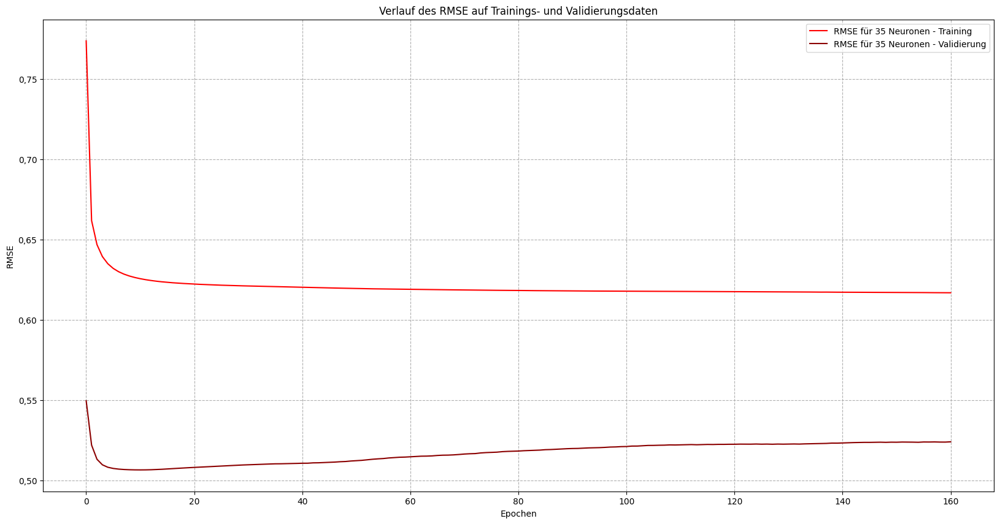

In [88]:
plt.figure(figsize=(20, 10))
plt.plot(np.sqrt(history_model_b2b.history['loss']),
         color='red', label=f'RMSE für {neurons_b2b} Neuronen - Training', zorder=2)
plt.plot(np.sqrt(history_model_b2b.history['val_loss']),
         color='darkred', label=f'RMSE für {neurons_b2b} Neuronen - Validierung', zorder=3)
plt.grid(visible=True, linestyle='--')
plt.legend()
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.title('Verlauf des RMSE auf Trainings- und Validierungsdaten')

Der RMSE der Validierung ist durchgängig geringer alsder Wert für die Trainingsdaten, allerdings ist über die gesamte Trainingsdauer nur eine geringe Annäherung der beiden Kurven erkennbar. Es gibt zwar ein frühes Minimum für die Validierung, jedoch bis zum Early Stopping keine vollständige Konvergenz zwischen den Trainings- und Validierungsdaten.<br>
Zum Vergleich mit dem linearen Modell wird dennoch der RMSE auf den gesonderten Validierungsdaten bestimmt.

In [89]:
predict_b2b = y_scaler.inverse_transform(model_b2b.predict(x_val_transformed_np)).flatten()
model_rmse[model_name] = root_mean_squared_error(y_val_transformed, predict_b2b)
print_model_stats(model_name)

98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
RMSE 70643 und Trainingszeit 49.383 Sekunden für Neuronales Netz mit transformierten Merkmalen, 35 Neuronen und L2-Regularisierung


Der RMSE ist noch höher als der Wert des linearen Modells, auch unabhängig vom Plot muss hier also noch weiter optimiert werden.

Der Hidden Layer nutzt bisher die Default-Aktivierungsfunktion "linear". Da hier ein Regressionsproblem gelöst werden soll, wird nun die ReLu-Funktion als Aktivierungsfunktion der Hidden Layer eingesetzt.

In [90]:
tf.keras.utils.set_random_seed(42) # Zur Reproduzierbarkeit der kommentierten Ergebnisse

# neurons_b2b=35

model_name = 'Modell B-2b'
model_description[model_name] = f'Neuronales Netz mit transformierten Merkmalen, {neurons_b2b} Neuronen, L2-Regularisierung und ReLu-Aktivierung'

input_layer_model_b2b = Input(shape=(x_train_transformed_np.shape[1],),
                              name='input_layer_b2b')
hidden_regularization_layer_model_b2b = Dense(neurons_b2b,
                                              activation='relu',
                                              kernel_regularizer=regularizers.l2(0.01),
                                              name='hidden_regularization_layer_b2b'
                                              )(input_layer_model_b2b)
output_layer_model_b2b = Dense(1,
                               name='output_layer_b2b'
                               )(hidden_regularization_layer_model_b2b)
model_b2b = Model(inputs=input_layer_model_b2b,
                  outputs=output_layer_model_b2b,
                  name='model_b2b')
model_b2b.compile(optimizer=Nadam(), loss='mse')
model_b2b.summary()

Model: "model_b2b"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_b2b (InputLayer)    │ (None, 67)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ hidden_regularization_layer_b2b │ (None, 35)             │         2,380 │
│ (Dense)                         │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer_b2b (Dense)        │ (None, 1)              │            36 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,416 (9.44 KB)

 Trainable params: 2,416 (9.44 KB)

 Non-trainable params: 0 (0.00 B)

In [91]:
epochs_b2b = 2000
start = time()
history_model_b2b = model_b2b.fit(x_train_transformed_np,
                                  y_train_transformed_np,
                                  validation_split=0.2,
                                  epochs=epochs_b2b,
                                  verbose=False,
                                  callbacks=[EarlyStopping(patience=150, restore_best_weights=True, verbose=True)])
model_training_time[model_name] = time()-start

Epoch 160: early stopping
Restoring model weights from the end of the best epoch: 10.


Es gibt fast keinen Unterschied in der Trainingsdauer im Vergleich zum ersten Versuch.

Text(0.5, 1.0, 'Verlauf des RMSE auf Trainings- und Validierungsdaten')

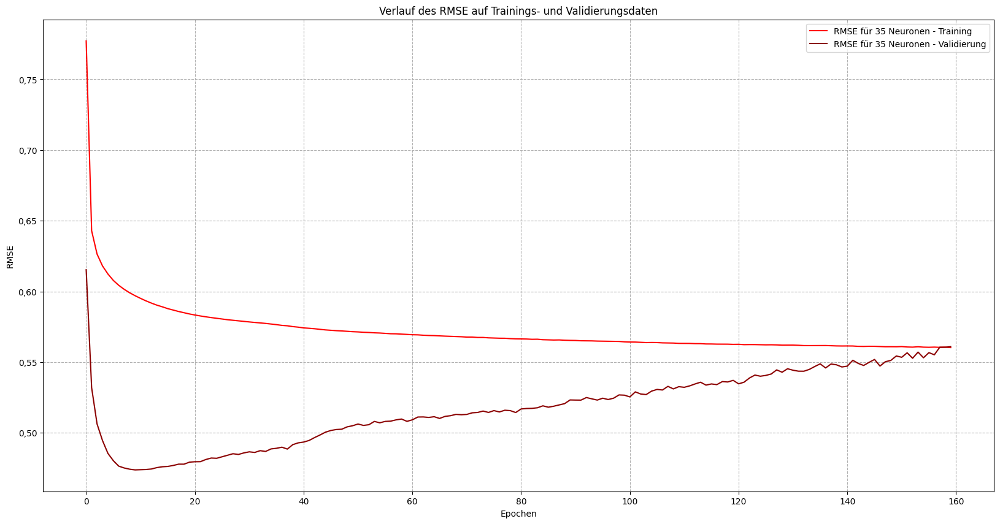

In [92]:
plt.figure(figsize=(20, 10))
plt.plot(np.sqrt(history_model_b2b.history['loss']),
         color='red', label=f'RMSE für {neurons_b2b} Neuronen - Training', zorder=2)
plt.plot(np.sqrt(history_model_b2b.history['val_loss']),
         color='darkred', label=f'RMSE für {neurons_b2b} Neuronen - Validierung', zorder=3)
plt.grid(visible=True, linestyle='--')
plt.legend()
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.title('Verlauf des RMSE auf Trainings- und Validierungsdaten')

Der Plot der RMSE zeigt, eine signifikant schnellere Konvergenz von Trainings- und (internen) Validierungsdaten alsim Modell mit linearer Aktivierungsfunktion. Dabei fallen auch deutlich Schwankungen im RMSE der Validierung auf, die allerdings erst im Bereich des Minimums beginnen.

In [93]:
predict_b2b = y_scaler.inverse_transform(model_b2b.predict(x_val_transformed_np)).flatten()
model_rmse[model_name] = root_mean_squared_error(y_val_transformed, predict_b2b)
print_model_stats(model_name)

98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 709us/step
RMSE 66724 und Trainingszeit 48.313 Sekunden für Neuronales Netz mit transformierten Merkmalen, 35 Neuronen, L2-Regularisierung und ReLu-Aktivierung


Auch der RMSE auf den internen Validierungsdaten ist durch die Anpassung gesunken und nun niedriger als im einfachen linearen Modell mit allen Merkmalen.<br>
Zur weiteren Bewertung werden die gleichen Plots wie in den vorherigen Modellen genutzt:

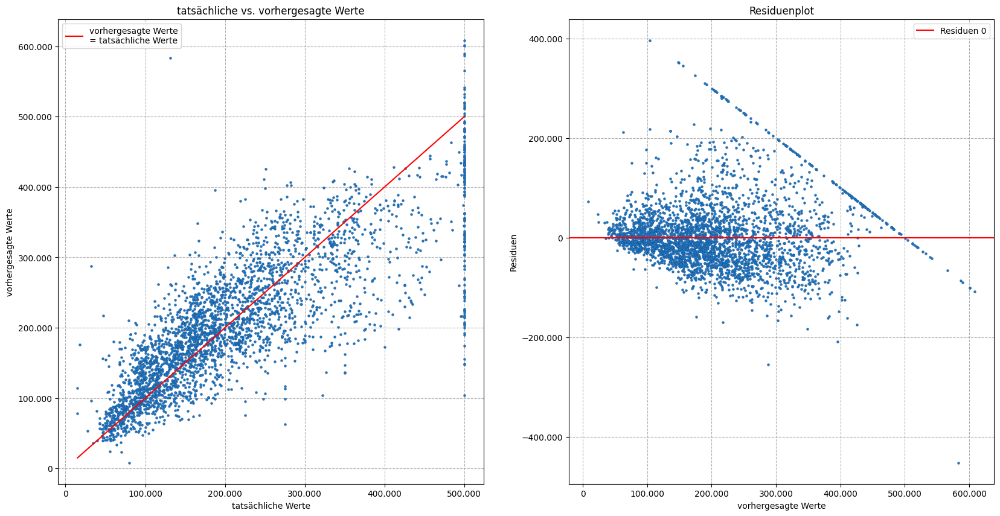

In [94]:
plot_model_scatter(prediction=predict_b2b, validation=y_val_transformed)

Im Vergleich zum linearen Modell ist die Überbewertung für niedrige Hauspreise bis ca. 200.000 deutlich schwächer ausgeprägt und vor allem im Residuenplot unter 100.000 noch erkennbar. Für größere Werte über 300.000 ist aber die gleiche Unterbewertung erkennbar, die bisher in allen Modellen aufgetreten war. Im Vergleich zu CatBoost ist die Streuung der Schätzungen um die tatsächlichen Werte deutlich größer, wie auch bereits anhand des RMSE erahnt werden konnte. Die Schätzungen für die Maximal-Hauspreise streut relativ weit, scheint aber einen großen Anteil im Bereich 400.000 bis 500.000 zu haben.

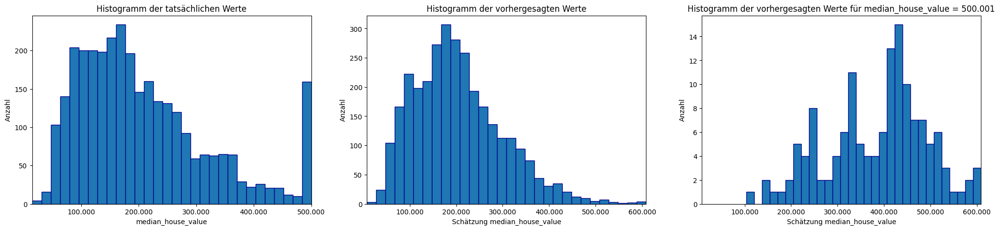

In [95]:
plot_model_hist(prediction=predict_b2b, validation=y_val_transformed)

Das Histogramm der vorhergesagten Werte zeigt eine stärkere Fokusierung der Werte zwischen 100.000 und 200.000. Die Stufe ab ca. 300.000 ist weniger ausgeprägt und (wie bereits bei den vorhergehenden Modellen) fehlen die Maximalwerte. Die Schätzungen für die tatsächlichen Maximalwerte haben drei erkennbare Cluster in den Bereichen 200.000 bis 250.000, 300.000 bis 350.000 und 400.000 bis 500.000, wobei der dritte Cluster deutlich größer ist alsdie anderen beiden.

### Aufgabe B-3: Neuronales Netz mit Embeddings [Lernziele 3.2, 4.1, 4.3, 5.2 & 6; 17 Punkte]

#### Aufgabenteil B-3a
Die kategoriellen Merkmale __ocean_proximity__ und __county_name__ sind über zweidimensionale Embeddings in ein Neuronales Netz einzufügen. Die verborgenen Schichten des Netzes sollen dabei aus dem Neuronalen Netz aus Aufgabe B-2 b) übernommen werden. Die nötigen Anpassungen der Modellumsetzung sind detailliert vorab zu beschreiben und dann durchzuführen. Die Trainingsdaten sind zu fitten und die Konvergenz ist zu bewerten. Falls Letztere nicht gegeben ist, so sind die notwendigen Veränderungen durchzuführen.

Um die Daten für die Embeddings vorzubereiten, werden die kategoriellen Merkmale in getrennte Strukturen separiert. Dabei wird allerdings nicht wie bisher ein One-Hot-Encoding, sondern ein Label-Encoding genutzt, d.h. es wird eine einzige numerische Spalte mit einem Integerwert für jede Ausprägung des jeweiligen Merkmals erzeugt. Das Encoding wird dabei bereits vor der Selektion der Trainings- und Validierungsdaten durchgeführt, um eine einheitliche Transformation zu gewährleisten und die Zuordnung wird in zusätzlichen Mapping-Variablen festgehalten.

In [96]:
factorized_ocean_proximity = scaled_housing_sample[['sample', 'ocean_proximity']].copy()
factorized_ocean_proximity['ocean_proximity'], ocean_proximity_mapping = factorized_ocean_proximity['ocean_proximity'].factorize()
factorized_county_name = scaled_housing_sample[['sample', 'county_name']].copy()
factorized_county_name['county_name'], county_name_mapping = factorized_county_name['county_name'].factorize()


x_train_num_transformed_np = np.array(scaled_housing_sample[scaled_housing_sample['sample'] == 'A'].drop(columns=['median_house_value', 'ocean_proximity', 'county_name', 'sample'])).astype(np.float32)
x_train_ocean_transformed_np = factorized_ocean_proximity[factorized_ocean_proximity['sample'] == 'A']['ocean_proximity'].factorize()[0]
x_train_county_transformed_np = factorized_county_name[factorized_county_name['sample'] == 'A']['county_name'].factorize()[0]
# y_train_transformed_np=y_train_transformed_np

x_val_num_transformed_np = np.array(scaled_housing_sample[scaled_housing_sample['sample'] == 'B'].drop(columns=['median_house_value', 'ocean_proximity', 'county_name', 'sample'])).astype(np.float32)
x_val_ocean_transformed_np = factorized_ocean_proximity[factorized_ocean_proximity['sample'] == 'B']['ocean_proximity'].factorize()[0]
x_val_county_transformed_np = factorized_county_name[factorized_county_name['sample'] == 'B']['county_name'].factorize()[0]
# y_val_transformed=y_val_transformed

Durch die Embeddings wird der Input-Layer in drei separate Layer aufgeteilt. Für die beiden Input-Layer der kategoriellen Merkmale wird jeweils ein Embedding angelegt, das die Ausprägungen auf zwei numerische Werte abbilden. Dabei haben die Input-Layer der Embeddings jeweils nur ein numerisches (Integer-) Merkmal und die jeweilige Anzahl der Ausprägungen wird dem Embedding als input_dim übergeben. Die Ergebnisse der Embeddings werden anschließend mittels Flatten und Concatenate mit dem Inputlayer der numerischen Merkmale zusammengefasst und das Ergebnis mit dem Hidden Layer verknüpft, der analog zum Neuronalen Netz aus [Aufgabenteil B-2b](#aufgabenteil-b-2b) definiert wird.

In [97]:
set_random_seed(42)  # Zur Reproduzierbarkeit der kommentierten Ergebnisse

neurons_b3a = neurons_b2b

model_name = 'Modell B-3a'
model_description[model_name] = f'Neuronales Netz mit transformierten Merkmalen, {neurons_b3a} Neuronen, L2-Regularisierung, RELU-Aktivierung und Embeddings'

input_layer_model_b3a = Input(shape=(x_train_num_transformed_np.shape[1],),
                              dtype='float32',
                              name='input_layer_b3a')

input_ocean_proximity_b3a = Input(shape=(1,),
                                  dtype='int32',
                                  name='input_ocean_proximity_b3a')
embedding_ocean_proximity_b3a = Embedding(input_dim=5,
                                          output_dim=2,
                                          name='embedding_ocean_proximity_b3a'
                                          )(input_ocean_proximity_b3a)
flatten_ocean_proximity_b3a = Flatten(name='flatten_ocean_proximity_b3a'
                                      )(embedding_ocean_proximity_b3a)

input_county_name_b3a = Input(shape=(1,),
                              dtype='int32',
                              name='input_county_name_b3a')
embedding_county_name_b3a = Embedding(input_dim=58,
                                      output_dim=2,
                                      name='embedding_county_name_b3a'
                                      )(input_county_name_b3a)
flatten_county_name_b3a = Flatten(name='flatten_county_name_b3a'
                                  )(embedding_county_name_b3a)

merged_layer_b3a = concatenate([input_layer_model_b3a, flatten_ocean_proximity_b3a, flatten_county_name_b3a],
                               name='merged_layer_b3a')

hidden_regularization_layer_model_b3a = Dense(neurons_b3a,
                                              activation='relu',
                                              kernel_regularizer=regularizers.l2(0.01),
                                              name='hidden_regularization_layer_b3a'
                                              )(merged_layer_b3a)

output_layer_model_b3a = Dense(1,
                               name='output_layer_b3a'
                               )(hidden_regularization_layer_model_b3a)

model_b3a = Model(inputs=[input_layer_model_b3a, input_ocean_proximity_b3a, input_county_name_b3a],
                  outputs=output_layer_model_b3a,
                  name='model_b3a')
model_b3a.compile(optimizer=Nadam(),
                  loss='mse')

model_b3a.summary()

Model: "model_b3a"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_ocean_proxim… │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_county_name_… │ (None, 1)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_ocean_pr… │ (None, 1, 2)      │         10 │ input_ocean_prox… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_county_n… │ (None, 1, 2)      │        116 │ input_county_nam… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer_b3a     │ (None, 6)         │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_ocean_prox… │ (None, 2)         │          0 │ embedding_ocean_… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_county_nam… │ (None, 2)         │          0 │ embedding_county… │
│ (Flatten)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ merged_layer_b3a    │ (None, 10)        │          0 │ input_layer_b3a[… │
│ (Concatenate)       │                   │            │ flatten_ocean_pr… │
│                     │                   │            │ flatten_county_n… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ hidden_regularizat… │ (None, 35)        │        385 │ merged_layer_b3a… │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ output_layer_b3a    │ (None, 1)         │         36 │ hidden_regulariz… │
│ (Dense)             │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 547 (2.14 KB)

 Trainable params: 547 (2.14 KB)

 Non-trainable params: 0 (0.00 B)

Abgesehen von den getrennt übergebenen Merkmalen ist der Aufruf des Trainings unverändert:

In [98]:
epochs_b3a = 2000
start = time()
history_model_b3a = model_b3a.fit([x_train_num_transformed_np, x_train_ocean_transformed_np, x_train_county_transformed_np],
                                  y_train_transformed_np,
                                  validation_split=0.2,
                                  epochs=epochs_b3a,
                                  verbose=False,
                                  callbacks=[EarlyStopping(patience=150, restore_best_weights=True, verbose=True)])
model_training_time[model_name] = time()-start

Epoch 168: early stopping
Restoring model weights from the end of the best epoch: 18.


Das Early Stopping löst kurz nach dem finalen Modell aus [Aufgabenteil B-2b](#aufgabenteil-b-2b), aber immer noch sehr schnell aus.

Text(0.5, 1.0, 'Verlauf des RMSE auf Trainings- und Validierungsdaten')

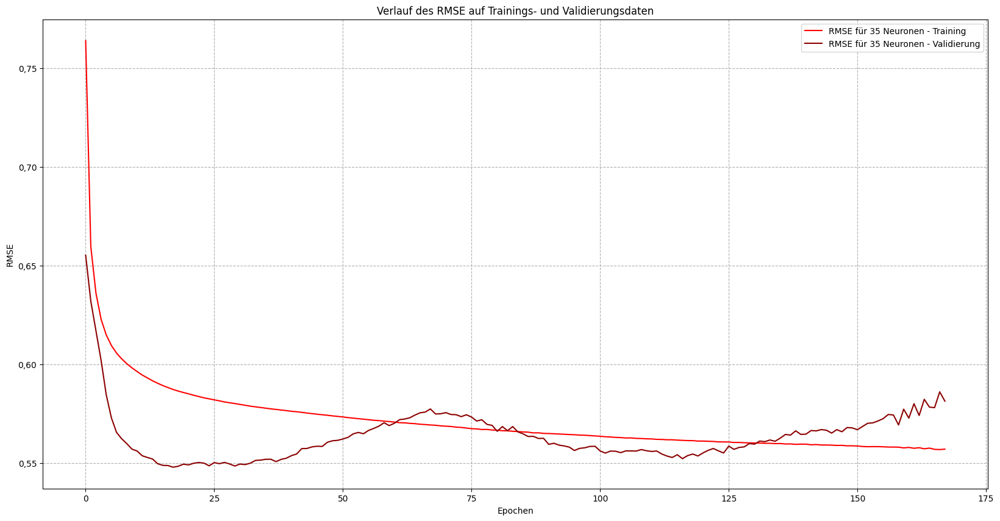

In [99]:
plt.figure(figsize=(20, 10))
plt.plot(np.sqrt(history_model_b3a.history['loss']),
         color='red', label=f'RMSE für {neurons_b3a} Neuronen - Training', zorder=2)
plt.plot(np.sqrt(history_model_b3a.history['val_loss']),
         color='darkred', label=f'RMSE für {neurons_b3a} Neuronen - Validierung', zorder=3)
plt.grid(visible=True, linestyle='--')
plt.legend()
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.title('Verlauf des RMSE auf Trainings- und Validierungsdaten')

Im Vergleich zum vorherigen Neuronalen Netz sind die Schwankungen des RMSE der Validierung zwischen den Epochen geringer. Es ist aber eine längerperiodige Schwingung in der Validierung erkennbar, die aber die Qualität nach den ersten Epochen nicht mehr erreicht. Insbesondere ist wieder eine deutlich schnellere Konvergenz zu beobachten alsim ersten Netz in [Aufgabenteil B-2b](#aufgabenteil-b-2b).

#### Aufgabenteil B-3b
Der RMSE der Validierungsdaten des Netzes mit Embeddings ist samt Fitting-Laufzeit zu ermitteln und dem Modellvergleich hinzuzufügen. Das Neuronale Netz mit Embeddings ist mit dem Neuronalen Netz aus Aufgabe B-2 b) zu vergleichen und zu bewerten.

Die Fitting-Laufzeit wurde bereits beim Training des Modells in [Aufgabenteil B-3a](#aufgabenteil-b-3a) ermittelt und abgelegt.

In [100]:
predict_b3a = y_scaler.inverse_transform(model_b3a.predict([x_val_num_transformed_np, x_val_ocean_transformed_np, x_val_county_transformed_np])).flatten()
model_rmse[model_name] = root_mean_squared_error(y_val, predict_b3a)
print_model_stats('Modell B-2b')
print_model_stats(model_name)

98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
RMSE 66724 und Trainingszeit 48.313 Sekunden für Neuronales Netz mit transformierten Merkmalen, 35 Neuronen, L2-Regularisierung und ReLu-Aktivierung
RMSE 72564 und Trainingszeit 58.379 Sekunden für Neuronales Netz mit transformierten Merkmalen, 35 Neuronen, L2-Regularisierung, RELU-Aktivierung und Embeddings


Der RMSE ist höher alsim Neuronalen Netz ohne Embedding, zudem dauert das Training auch noch länger. Das Netz mit Embeddings wurde zwar über 168 Epochen trainiert, im Vergleich zu den 160 des ersten Modells, dieser Unterschied ist jedoch zu gering, um den Unterschied in der Laufzeit zu erklären. Auch die Anzahl der Gewichte würde, wegen der starken Reduktion der Inputparameter und der Aufteilung der Inputdaten, eher dafür sprechen, dass das Netz mit Embeddings schneller trainiert werden kann. Offensichtlich hat die zusätzlich Komplexität des Modells durch die Embeddings also einen größeren Einfluss auf die Laufzeit alsdie Anzahl der Parameter.

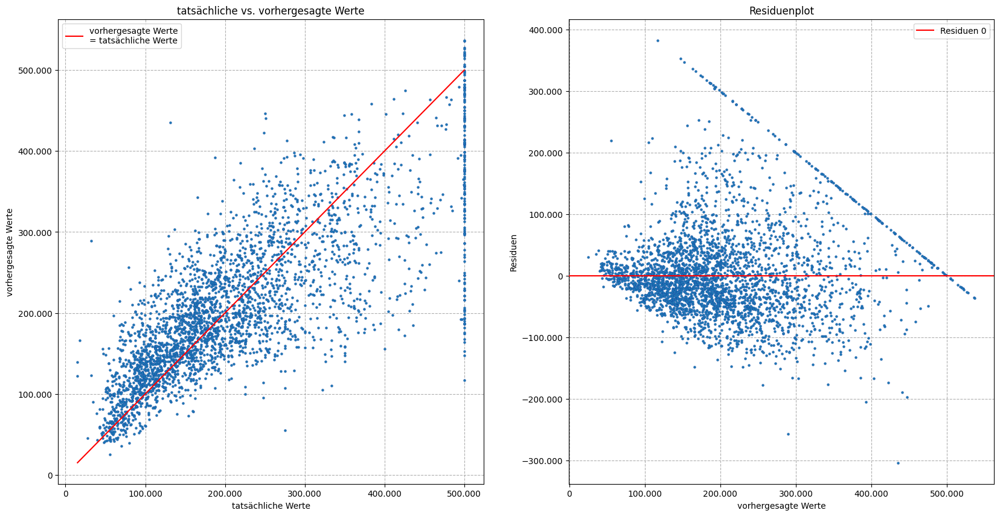

In [101]:
plot_model_scatter(prediction=predict_b3a, validation=y_val_transformed)

Im Gegensatz zu dem Neuronalen Netz ohne Embeddings ist hier wieder eine deutliche Überbewertung der niedrigeren tatsächlichen Werte sichtbar. Zudem streuen sind die Abweichungen für den gesamten Wertebereich nun größer, was vor allem im Residuenplot deutlich wird und vermutlich der Hauptgrund für den höheren RMSE ist. Die Schätzungen der Maximalwerte liegen in einem etwas kleineren Intervall, scheinen aber weniger gruppiert zu sein alsim Neuronalen Netz ohne Embeddings.

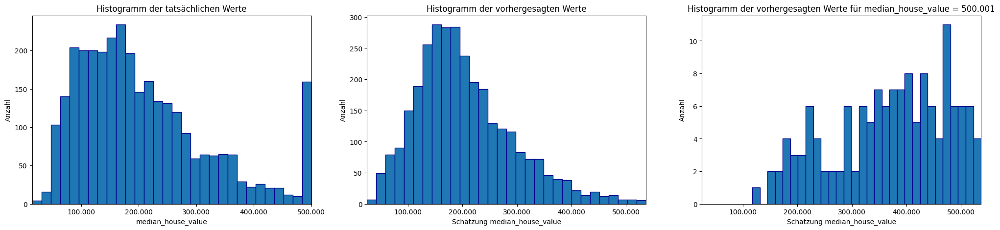

In [102]:
plot_model_hist(prediction=predict_b3a, validation=y_val_transformed)

Auch die Histogramme zeigen deutlich stärkere Abweichungen von den tatsächlichen Werten alsfür das Neuronale Netz ohne Embeddings. Durch die Überbewertung der niedrigen und Unterbewertung der hohen Hauspreise entsteht hier wieder eine deutlich stärkere Bündelung der Schätzungen unterhalb von 200.000. Die Darstellung der Schätzungen für die Maximalwerte bestätigt den Eindruck aus den vorhergehenden Plots, dass die Ergebnisse zwar in einem etwas engeren Intervall liegen, aber auch weniger stark gruppiert sind alsim vorhergehenden Modell.

#### Aufgabenteil B-3c
Die Embeddings der kategoriellen Merkmale sind aus dem Modell zu extrahieren und grafisch darzustellen.

Embeddings extrahieren:

In [103]:
embedding_ocean_proximity_weights_b3a = model_b3a.get_layer('embedding_ocean_proximity_b3a').get_weights()[0]
embedding_county_name_weights_b3a = model_b3a.get_layer('embedding_county_name_b3a').get_weights()[0]

Die Komponenten der Gewichte als Koordinaten plotten die Ausprägungen der kategoriellen Merkmale zuordnen.

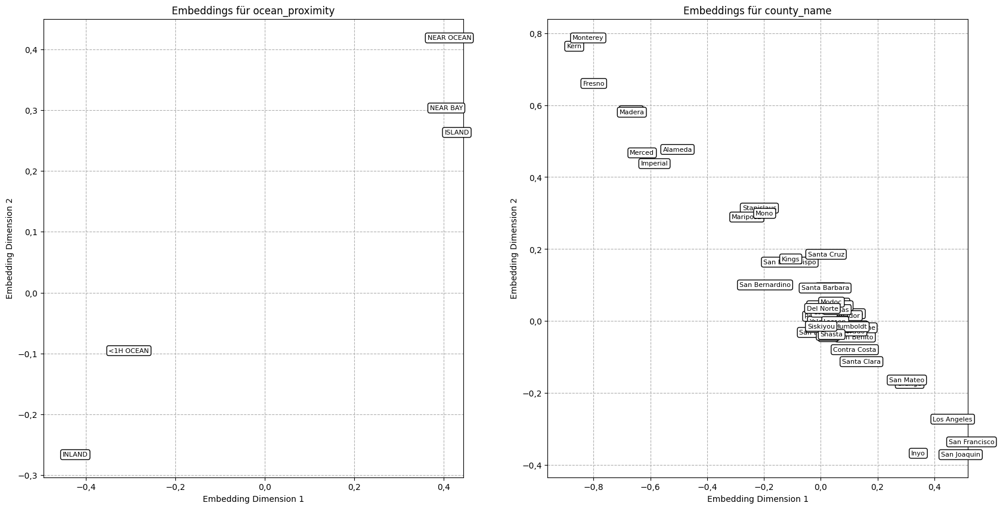

In [104]:
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.scatter(embedding_ocean_proximity_weights_b3a[:, 0],
            embedding_ocean_proximity_weights_b3a[:, 1], 
            marker='.', edgecolor='darkblue', zorder=2)
for i, txt in enumerate(ocean_proximity_mapping):
    plt.annotate(txt, (embedding_ocean_proximity_weights_b3a[i, 0], embedding_ocean_proximity_weights_b3a[i, 1]), 
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=1), fontsize=8)
plt.title('Embeddings für ocean_proximity')
plt.xlabel('Embedding Dimension 1')
plt.ylabel('Embedding Dimension 2')
plt.grid(True, linestyle='--')

plt.subplot(1, 2, 2)
plt.scatter(embedding_county_name_weights_b3a[:, 0],
            embedding_county_name_weights_b3a[:, 1], 
            marker='.', edgecolor='darkblue', zorder=2)
for i, txt in enumerate(county_name_mapping):
    plt.annotate(txt, (embedding_county_name_weights_b3a[i, 0], embedding_county_name_weights_b3a[i, 1]), 
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=1), fontsize=8)
plt.title('Embeddings für county_name')
plt.xlabel('Embedding Dimension 1')
plt.ylabel('Embedding Dimension 2')
plt.grid(True, linestyle='--')

#### Aufgabenteil B-3d
Das in Teilaufgabe a) aufgebaute Netz mit Embeddings soll als „clone“ nochmals, nun aber mit einem anderen Modellnamen und anderen (random) Startgewichten erzeugt, neu gefitted und die Konvergenz überprüft und ggf. hergestellt werden. Die entsprechenden Embedding-Gewichte sind zu extrahieren und in einer verbundenen Grafik den Embeddings aus Teilaufgabe c) gegenüberzustellen (z. B. 2x2 Grafiken über-/nebeneinander) und zu interpretieren.

Das Neuronale Netz aus [Aufgabenteil B-3a](#aufgabenteil-b-3a) wird kopiert, um andere Ergebnisse zu erhalten, wird ein abweichender Seed gesetzt.

In [105]:
set_random_seed(24)  # Zur Reproduzierbarkeit der kommentierten Ergebnisse

model_name = 'Modell B-3d'
model_description[model_name] = f'kopiertes Neuronales Netz mit transformierten Merkmalen, {neurons_b3a} Neuronen, L2-Regularisierung, RELU-Aktivierung und Embeddings'

model_b3d = clone_model(model_b3a)
model_b3d.compile(optimizer=Nadam(), loss='mse')

In [106]:
epochs_b3d = 2000
start = time()
history_model_b3d = model_b3d.fit([x_train_num_transformed_np, x_train_ocean_transformed_np, x_train_county_transformed_np],
                                  y_train_transformed_np,
                                  validation_split=0.2,
                                  epochs=epochs_b3d,
                                  verbose=False,
                                  callbacks=[EarlyStopping(patience=150, restore_best_weights=True, verbose=True)])
model_training_time[model_name] = time()-start

Epoch 312: early stopping
Restoring model weights from the end of the best epoch: 162.


Für die Kopie sind deutlich mehr Trainings-Epochen nötig.

Text(0.5, 1.0, 'Verlauf des RMSE auf Trainings- und Validierungsdaten')

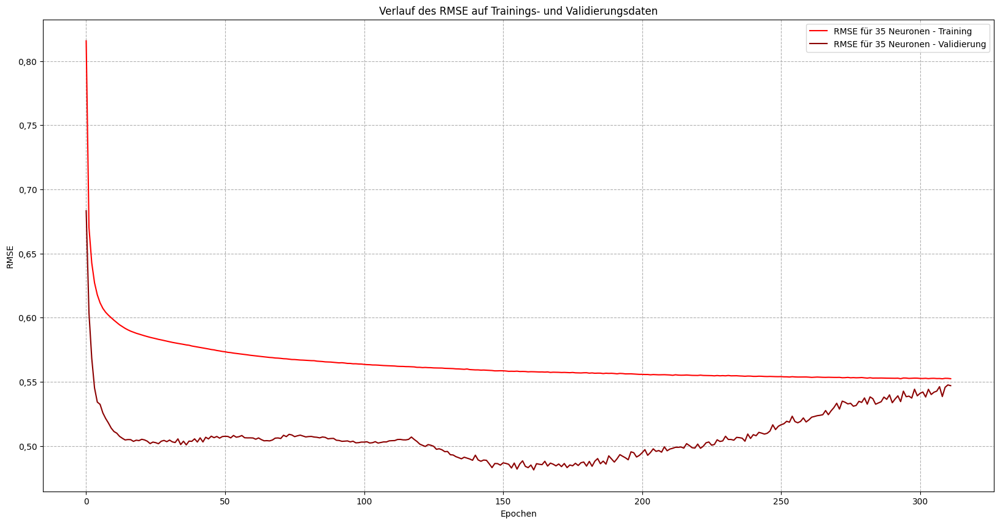

In [107]:
plt.figure(figsize=(20, 10))
plt.plot(np.sqrt(history_model_b3d.history['loss']),
         color='red', label=f'RMSE für {neurons_b3a} Neuronen - Training', zorder=2)
plt.plot(np.sqrt(history_model_b3d.history['val_loss']),
         color='darkred', label=f'RMSE für {neurons_b3a} Neuronen - Validierung', zorder=3)
plt.grid(visible=True, linestyle='--')
plt.legend()
plt.xlabel('Epochen')
plt.ylabel('RMSE')
plt.title('Verlauf des RMSE auf Trainings- und Validierungsdaten')

Grundsätzlich ähnelt die Entwicklung des RMSE stark dem vorherigen Training: Ab dem ersten Minimum schwankt der RMSE der Validierung zwischen den Epochen, es gibt aber auch eine längerperiodische Schwingung, während der RMSE der Trainingsdaten ohne große Schwankungen sinkt. Dieses mal unterschreitet die zweite Schwingung der Validierung jedoch das Minimum der ersten, was zu dem deutlich längeren Training führt.

In [108]:
embedding_ocean_proximity_weights_b3d = model_b3d.get_layer('embedding_ocean_proximity_b3a').get_weights()[0]
embedding_county_name_weights_b3d = model_b3d.get_layer('embedding_county_name_b3a').get_weights()[0]

Nachdem die Embeddings des kopierten Models kopiert wurden, werden sie zusammen mit den ersten Embeddings geplottet.

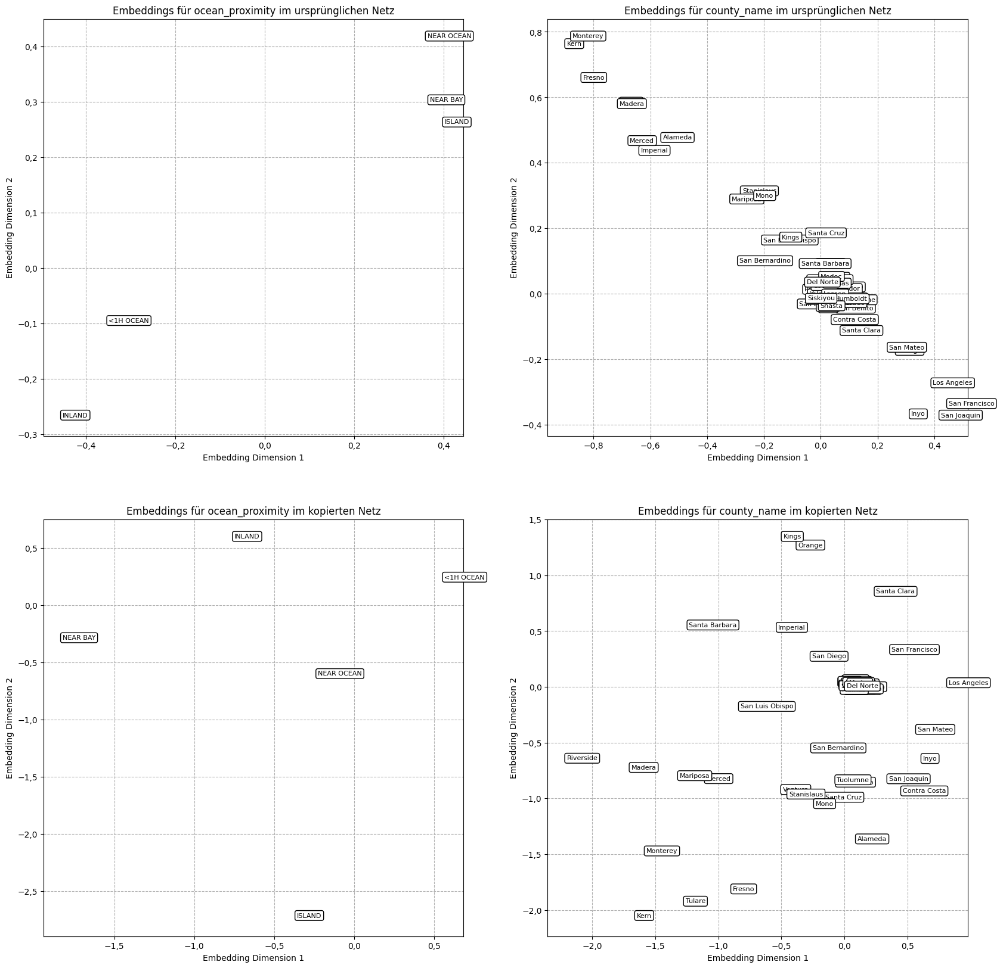

In [109]:
plt.figure(figsize=(20, 20))

plt.subplot(2, 2, 1)
plt.scatter(embedding_ocean_proximity_weights_b3a[:, 0],
            embedding_ocean_proximity_weights_b3a[:, 1],
            marker='.', edgecolor='darkblue', zorder=2)
for i, txt in enumerate(ocean_proximity_mapping):
    plt.annotate(txt, (embedding_ocean_proximity_weights_b3a[i, 0], embedding_ocean_proximity_weights_b3a[i, 1]),
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=1), fontsize=8)
plt.title('Embeddings für ocean_proximity im ursprünglichen Netz')
plt.xlabel('Embedding Dimension 1')
plt.ylabel('Embedding Dimension 2')
plt.grid(True, linestyle='--')

plt.subplot(2, 2, 2)
plt.scatter(embedding_county_name_weights_b3a[:, 0],
            embedding_county_name_weights_b3a[:, 1],
            marker='.', edgecolor='darkblue', zorder=2)
for i, txt in enumerate(county_name_mapping):
    plt.annotate(txt, (embedding_county_name_weights_b3a[i, 0], embedding_county_name_weights_b3a[i, 1]),
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=1), fontsize=8)
plt.title('Embeddings für county_name im ursprünglichen Netz')
plt.xlabel('Embedding Dimension 1')
plt.ylabel('Embedding Dimension 2')
plt.grid(True, linestyle='--')

plt.subplot(2, 2, 3)
plt.scatter(embedding_ocean_proximity_weights_b3d[:, 0],
            embedding_ocean_proximity_weights_b3d[:, 1], marker='.',
            edgecolor='darkblue', zorder=2)
for i, txt in enumerate(ocean_proximity_mapping):
    plt.annotate(txt, (embedding_ocean_proximity_weights_b3d[i, 0], embedding_ocean_proximity_weights_b3d[i, 1]),
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=1), fontsize=8)
plt.title('Embeddings für ocean_proximity im kopierten Netz')
plt.xlabel('Embedding Dimension 1')
plt.ylabel('Embedding Dimension 2')
plt.grid(True, linestyle='--')

plt.subplot(2, 2, 4)
plt.scatter(embedding_county_name_weights_b3d[:, 0],
            embedding_county_name_weights_b3d[:, 1],
            marker='.', edgecolor='darkblue', zorder=2)
for i, txt in enumerate(county_name_mapping):
    plt.annotate(txt, (embedding_county_name_weights_b3d[i, 0], embedding_county_name_weights_b3d[i, 1]),
                 bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="black", lw=1), fontsize=8)
plt.title('Embeddings für county_name im kopierten Netz')
plt.xlabel('Embedding Dimension 1')
plt.ylabel('Embedding Dimension 2')
plt.grid(True, linestyle='--')

Die beiden Trainings haben für beide kategorielle Variablen deutlich unterschiedliche Embeddings erzeugt. Im Original-Modell ist __ocean_proximity__ klar in zwei Gruppen aufgeteilt. Für __county_name__ gibt es eine größere Gruppe, allgemein scheint für das Merkmal aber ein relativ linearer Zusammenhang gefunden worden zu sein. Im zweiten Training sind die Ausprägungen beider Merkmale weiter über einen größeren Bereich verteilt, ohne vergleichbar klare Strukturen zu zeigen. Für __county_name__ gibt es wieder eine größere Gruppe von Ausprägungen, die jedoch enger platziert zu sein scheint. 

#### Aufgabenteil B-3e
Der RMSE der Validierungsdaten des Netzes aus Teilaufgabe d) ist samt Fitting-Laufzeit zu ermitteln und dem Modellvergleich hinzuzufügen. Die entsprechenden Ergebnisse der beiden Neuronalen Netz mit Embeddings sind miteinander und mit dem Neuronalen Netz aus Aufgabe B-2 b) sowie dem einfachen linearen Modell aus Aufgabe A-7 a) zu vergleichen und zu bewerten.

In [110]:
predict_b3d = y_scaler.inverse_transform(model_b3d.predict([x_val_num_transformed_np, x_val_ocean_transformed_np, x_val_county_transformed_np])).flatten()
model_rmse[model_name] = root_mean_squared_error(y_val, predict_b3d)
print_model_stats('Modell A-7a')
print_model_stats('Modell B-2b')
print_model_stats('Modell B-3a')
print_model_stats(model_name)

98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
RMSE 69098 und Trainingszeit 0.055 Sekunden für lineares Modell mit allen Merkmalen
RMSE 66724 und Trainingszeit 48.313 Sekunden für Neuronales Netz mit transformierten Merkmalen, 35 Neuronen, L2-Regularisierung und ReLu-Aktivierung
RMSE 72564 und Trainingszeit 58.379 Sekunden für Neuronales Netz mit transformierten Merkmalen, 35 Neuronen, L2-Regularisierung, RELU-Aktivierung und Embeddings
RMSE 84265 und Trainingszeit 105.366 Sekunden für kopiertes Neuronales Netz mit transformierten Merkmalen, 35 Neuronen, L2-Regularisierung, RELU-Aktivierung und Embeddings


Nur das Neuronale Netz ohne Embedding erreicht einen geringeren RMSE alsdas lineare Modell, beide Trainings mit Embeddings liefern schlechtere Ergebnisse auf den Validierungsdaten. Zudem fällt auf, dass das zweite Training mit Embeddings nochmal deutlich schlechter ist alsdas erste, obwohl es sich strukturell um das gleiche Netz mit anderen Startgewichten handelt. Anscheinend ist der lineare Zusammenhang in den Embeddings (insb. für __county_name__) für die weitere Abbildung von Vorteil alsdie eher unstrukturierten Embeddings des zweiten Trainings.

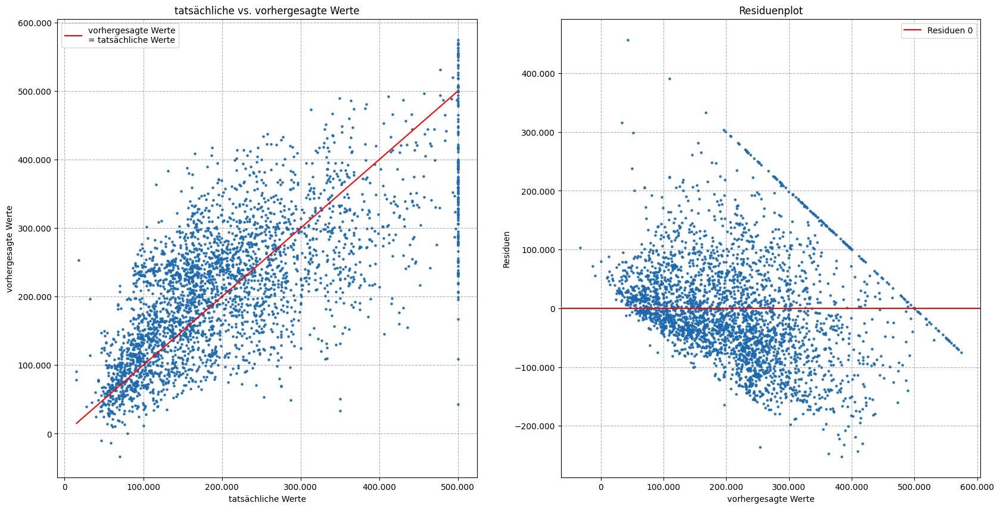

In [111]:
plot_model_scatter(prediction=predict_b3d, validation=y_val_transformed)

Gegenüber dem ersten Training mit Embeddings sind die Ergebnisse deutlich stärker gestreut. Es fällt im direkten Vergleich insbesondere auf, dass im Bereich bis 200.000 deutlich stärkere Unterbewertungen und zwischen 100.000 und 200.000 stärkere Überbewertungen auftreten. Insgesamt ist aber auch hier für kleinere tatsächlichen Werte ein Trend zur Überbewertung und bei höheren Werte vor Allem eine Unterbewertung erkennbar. Die Schätzungen der Maximalwerte scheinen im Vergleich zum ersten Training etwas nach oben verschoben zu sein, sodass kaum noch Schätzungen unter 200.000 auftreten.

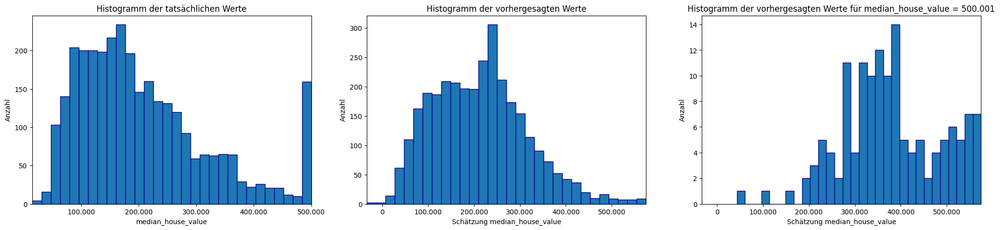

In [112]:
plot_model_hist(prediction=predict_b3d, validation=y_val_transformed)

Die Histogramme zeigen eine besondere Häufung über 200.000, was vermutlich ein Resultat der stärkeren Streuung in Verbindung mit der Kombination aus Über- und unterbewertung ist. Das Histogramm der Vorhersagen für die Maximalwerte bestätigt zwar, dass kaum noch Schätzungen unter 200.000 auftreten, allerdings sind die Schätzungen nicht insgesamt nach oben verschoben, stattdessen gibt es nun einen deutlichen Schwerpunkt von 300.000 bis 400.000.

Insgesamt zeigen die Ergebnissem dass es möglich ist, mit einem relativ simplen Neuronalen Netz bessere Ergebnisse zu erzielen alsmit dem linearen Modell, allerdings waren die CatBoost-Schätzungen deutlich besser. Nachdem CatBoost die Wichtigkeit einzelner kategorieller Merkmale gezeigt hat, liegt die Vermutung nahe, dass das einfache neuronale Netz mit One-Hot-Encoding zu viele Merkmale hat, um diese mit der geringes Komplexität des Netzes abzubilden. Die 2D-Embeddings scheinen dabei auch nicht auszureichen, die Ausprägungen zu strukturieren, eventuell reichen zwei Dimensionen für __county_name__ nicht aus.

### Aufgabe B-4: Hyperparameter-Tuning von lightGBM und XGBoost [Lernziele 3.2, 3.3/3.4, 4.1 & 6; 10 Punkte]

#### Aufgabenteil B-4a
Es ist ein lightGBM-Modell inkl. Hypertuning mit mehrdimensionalem Grid Search und vierfacher Kreuzvalidierung zu erstellen. Dabei sind die Parameter learning_rate und num_leaves zu optimieren, für den Parameter n_estimators ist der entsprechende Standardparameter des CatBoost Modells zu verwenden. Die mit dem Grid Search ermittelten besten fünf Parametersätze sind anzuzeigen und zu diskutieren. Im Anschluss ist ein Modell mit den besten Parametern auf allen Folds zu fitten, der Fehler auf den Validierungsdaten zu berechnen und die Ergebnisse dem Modellvergleich hinzuzufügen.

In [113]:
x_train_scaled = scaled_housing_sample[scaled_housing_sample['sample'] == 'A'].drop(columns=['median_house_value', 'sample'])
y_train_scaled = scaled_housing_sample[scaled_housing_sample['sample'] == 'A']['median_house_value']
x_val_scaled = scaled_housing_sample[scaled_housing_sample['sample'] == 'B'].drop(columns=['median_house_value', 'sample'])

Der lightGBM-Parameter n_estimators entspricht dem CatBoost-Parameter iterations. Der Standardwert für CatBoost wurde in [Aufgabenteil A-4e](#aufgabenteil-a-4e) als 1.000 ausgelesen.

In [114]:
model_name = 'Modell B-4a'
model_description[model_name] = 'lightGBM mit Grid Search'

param_grid_b4a = {
    'learning_rate': [0.001, 0.005, 0.01, 0.05, 0.1, 0.2],
    'num_leaves': range(10, 101, 10)
}
model_b4a = LGBMRegressor(n_estimators=1000, 
                          device='cpu',
                          verbose=-1)
grid_search_b4a = GridSearchCV(estimator=model_b4a, 
                               param_grid=param_grid_b4a, 
                               verbose=0, cv=4, n_jobs=-1)

start = time()
grid_search_b4a.fit(x_train_scaled, y_train_scaled)
model_training_time[model_name] = time()-start

top_five_params_b4a = pd.DataFrame(grid_search_b4a.cv_results_).sort_values(by='rank_test_score')[['params', 'mean_test_score']].head(5)
print("Die besten fünf Parametersätze:")
print(top_five_params_b4a)

Die besten fünf Parametersätze:
                                        params  mean_test_score
10  {'learning_rate': 0.005, 'num_leaves': 10}         0.460959
20   {'learning_rate': 0.01, 'num_leaves': 10}         0.439330
12  {'learning_rate': 0.005, 'num_leaves': 30}         0.435464
11  {'learning_rate': 0.005, 'num_leaves': 20}         0.433519
14  {'learning_rate': 0.005, 'num_leaves': 50}         0.433199


Die fünf besten Parametersätze zeigen klar, dass das lightGBM für diese Daten von einer geringen learning_rate, aus den getesteten Werten insbesondere 0.005, profitiert. Für num_leaves gibt es etwas mehr Variation in den besten Parametersätzen, aber auch hier scheinen prinzipiell die niedrigeren Werte besser zu sein.<br>
Zusammengefasst sollte also besser ein kleineres Modell in kleineren Schritten trainiert werden.<br>
Das lightGBM-Modell wird mit den besten Parametern nochmal neu trainiert, die Trainingsdauer wird aber nicht getrennt, sondern zur Dauer der GridSearch addiert.

In [115]:
learning_rate_b4a = grid_search_b4a.best_params_['learning_rate']
num_leaves_b4a = grid_search_b4a.best_params_['num_leaves']

model_b4a = LGBMRegressor(n_estimators=1000, 
                          learning_rate=learning_rate_b4a, 
                          num_leaves=num_leaves_b4a, 
                          device='cpu', verbose=-1)

start = time()
model_b4a.fit(x_train_scaled, y_train_scaled)
model_training_time[model_name] = model_training_time[model_name]+time()-start
print(f'Dauer des finalen Trainings: {round(time()-start, 3)} Sekunden')

Dauer des finalen Trainings: 0.526 Sekunden


In [116]:
predict_b4a = y_scaler.inverse_transform(model_b4a.predict(x_val_scaled).reshape(-1, 1)).flatten()
model_rmse[model_name] = root_mean_squared_error(y_val, predict_b4a)

print_model_stats(model_name)

RMSE 56860 und Trainingszeit 249.092 Sekunden für lightGBM mit Grid Search


#### Aufgabenteil B-4b
Analog ist ein XGBoost-Modell inkl. Hypertuning mit mehrdimensionalem Random Search und vierfacher Kreuzvalidierung zu erstellen. Dabei sind die Parameter depth, learning_rate, subsample und colsample_bytree zu optimieren. Dabei ist die gleiche Anzahl Iterationen wie bei CatBoost und lightGBM zu verwenden. Die mit dem Randomized Search ermittelten besten fünf Parameterkombinationen sind anzuzeigen und zu diskutieren. Im Anschluss ist ein Modell mit den besten Parametern auf allen Folds zu fitten, der Fehler auf den Validierungsdaten zu berechnen und die Ergebnisse dem Modellvergleich hinzuzufügen.


Bei der Modeldefinition wird erneut n_estimators von CatBoost übernommmen. Im Gegensatz zu lightGBM muss hier noch explizit die Verwendung kategorieller Variablen aktiviert werden. Zusätzlich zu den zu optimierenden Parametern wird in der Random Search n_iter gesetzt, um mehr Parameterkombinationen als die Default-Einstellungen von 10 Samples abzudecken.

In [117]:
model_name = 'Modell B-4b'
model_description[model_name] = 'XGBoost mit Randomized Search'

param_grid_b4b = {
    'max_depth': range(2, 10),
    'learning_rate': [0.001, 0.005, 0.01, 0.02, 0.05],
    'subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    'colsample_bytree': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
}

model_b4b = XGBRegressor(n_estimators=1000, 
                         tree_method='hist', device='cpu',
                         enable_categorical=True, verbosity=0, 
                         random_state=np.random.RandomState(42))
start = time()
random_search_b4b = RandomizedSearchCV(estimator=model_b4b, 
                                       param_distributions=param_grid_b4b,
                                       verbose=0, cv=4, n_iter=100, n_jobs=-1, 
                                       random_state=np.random.RandomState(42))
random_search_b4b.fit(x_train_scaled, y_train_scaled)
model_training_time[model_name] = time()-start

top_five_params_b4b = pd.DataFrame(random_search_b4b.cv_results_).sort_values(by='rank_test_score')[['params', 'mean_test_score']].head(5)
print("Die besten fünf Parameterkombinationen:")
print(top_five_params_b4b)

Die besten fünf Parameterkombinationen:
                                                                                 params  mean_test_score
3   {'subsample': 1.0, 'max_depth': 4, 'learning_rate': 0.005, 'colsample_bytree': 0.5}         0.483168
71   {'subsample': 1.0, 'max_depth': 4, 'learning_rate': 0.01, 'colsample_bytree': 0.6}         0.481797
19   {'subsample': 0.7, 'max_depth': 4, 'learning_rate': 0.01, 'colsample_bytree': 0.6}         0.477095
90  {'subsample': 0.8, 'max_depth': 4, 'learning_rate': 0.005, 'colsample_bytree': 0.6}         0.475929
79   {'subsample': 0.8, 'max_depth': 3, 'learning_rate': 0.01, 'colsample_bytree': 0.7}         0.473840


In den Top 5 Parametersätze treten wieder die gleichen learning_rates auf, wie bereits bei lightGBM und offensichtlich ist max_depth=4 aus den getestenten Sets zu bevorzugen. Für subsample sind grundsätzlich auch eher die höheren Werte vorzuziehen, allerdings sind die Top 5 hier nicht so eindeutig wie bei learning_rate und max_depth. Analog sind für colsample_bytree grundsätzlich kleinere Werte besser, aber auch nicht so klar eingeschränkt. Hier kommt noch hinzu, dass 0.5 zwar das Minimum der vorgegebenen Werte darstellt, geringere Werte aber prinzipiell noch möglich wären.<br>
Wie bereits bei lightGBM sind hier also wieder eher kleine Modelle mit kleineren Trainingsschritten zu bevorzugen. Dazu kommt, dass die Anzahl der Datensätze beim Sampling im Training nicht zu stark reduziert werden sollte, während Merkmale deutlich aggressiver weggelassen werden können.<br>
Es folgt wieder ein erneutes Training des Modells mit den besten Parametern, dessen Laufzeit mit der Parametersuche zusammengefasst wird.

In [118]:
max_depth_b4b = random_search_b4b.best_params_['max_depth']
learning_rate_b4b = random_search_b4b.best_params_['learning_rate']
subsample_b4b = random_search_b4b.best_params_['subsample']
colsample_bytree_b4b = random_search_b4b.best_params_['colsample_bytree']

start = time()
model_b4b = XGBRegressor(n_estimators=1000, 
                         max_depth=max_depth_b4b, learning_rate=learning_rate_b4b, 
                         subsample=subsample_b4b, colsample_bytree=colsample_bytree_b4b, 
                         tree_method='hist', device='cpu',
                         enable_categorical=True, verbosity=0, 
                         random_state=np.random.RandomState(42))
model_b4b.fit(x_train_scaled, y_train_scaled)
model_training_time[model_name] = model_training_time[model_name]+time()-start
print(f'Dauer des finalen Trainings: {round(time()-start, 3)} Sekunden')

Dauer des finalen Trainings: 0.698 Sekunden


In [119]:
predict_b4b = y_scaler.inverse_transform(model_b4b.predict(x_val_scaled).reshape(-1, 1)).flatten()
model_rmse[model_name] = root_mean_squared_error(y_val, predict_b4b)

print_model_stats(model_name)

RMSE 57417 und Trainingszeit 163.53 Sekunden für XGBoost mit Randomized Search


#### Aufgabenteil B-4c
Abschließend ist der Aufwand und der Nutzen der hier optimierten Modelle gegenüber dem CatBoost-Modell aus Aufgabe A-7 b) zu bewerten.

In [120]:
print_model_stats("Modell A-7b")
print_model_stats("Modell B-4a")
print_model_stats("Modell B-4b")

RMSE 48471 und Trainingszeit 34.906 Sekunden für CatBoost mit allen Merkmalen
RMSE 56860 und Trainingszeit 249.092 Sekunden für lightGBM mit Grid Search
RMSE 57417 und Trainingszeit 163.53 Sekunden für XGBoost mit Randomized Search


Der RMSE des CatBoost-Modells ist deutlich besser alsdie Werte des lightGBM und des XGBoost bei gleichzeitig deutlich geringerer Trainingszeiten. Dabei ist allerdings zu berücksichtigen, dass die Laufzeit von lightGBM und XGBoost fast vollständig auf das Hyperparameter-Tuning zurückzuführen ist, während für CatBoost einfach die Default-Einstllungen genutzt wurden. Betrachtet man nur das finale Training, sind lightGBM und XGBoost deutlich schneller als CatBoost.

Die Schätzungen von lightGBM und XGBoost werden noch kurz betrachtet, beginnend mit lightGBM:

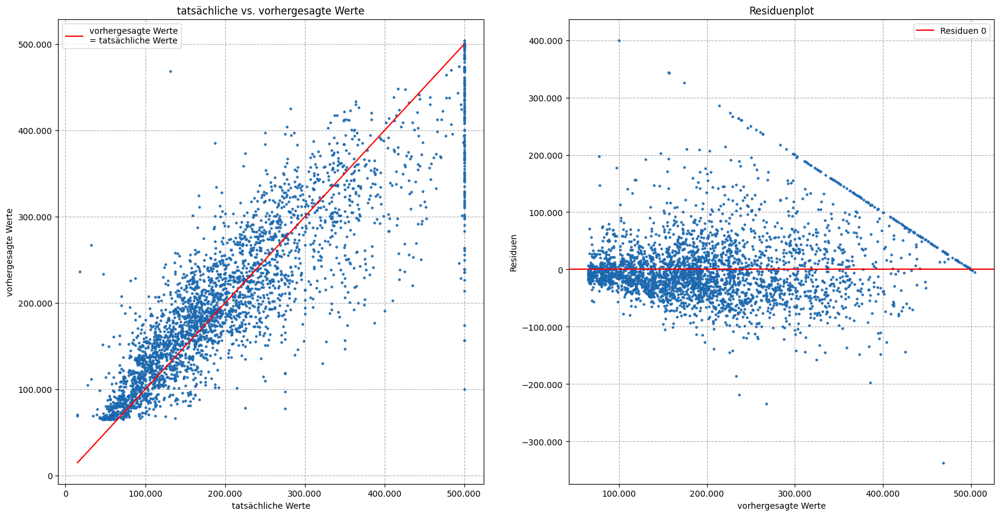

In [121]:
plot_model_scatter(prediction=predict_b4a, validation=y_val_transformed)

Die Streuung der Schätzungen scheint für lightGBM zwar wieder geringer zu sein alsbei den Neuronalen Netzen, aber im Vergleich mit CatBoost signifikant höher. Im Vergleich mit CatBoost ist auch die Überbewertung für niedrige Hauspreise stärker ausgeprät. Die Schätzungen für die Maximalwerte scheinen in einem etwas niedrigeren Bereich gebündelt zu sein alsbei CatBoost.

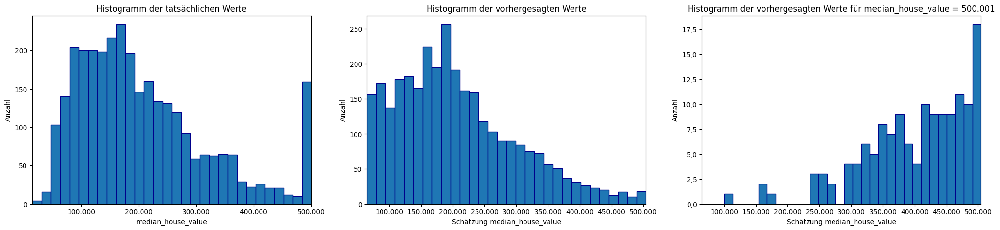

In [122]:
plot_model_hist(prediction=predict_b4a, validation=y_val_transformed)

Im Histogramm der vorhergesagten Werte ist eine stärkere Konzentration der Werte unter 100.000 erkennbar, und im Vergleich mit CatBoost scheinen die Schätzungen weniger stark gruppiert zu sein. LightGBM ist das erste Model, für das die Darstellungen der 500.001er-Schätzungen ein klares Maximum bei 500.000 zeigt, allerdings sind hier dennoch viele Datensätze über zwei Blöcke in den Bereichen 300.000 bis 400.000 und 400.000 bis 500.000 verteilt.

Es folgt XGBoost:

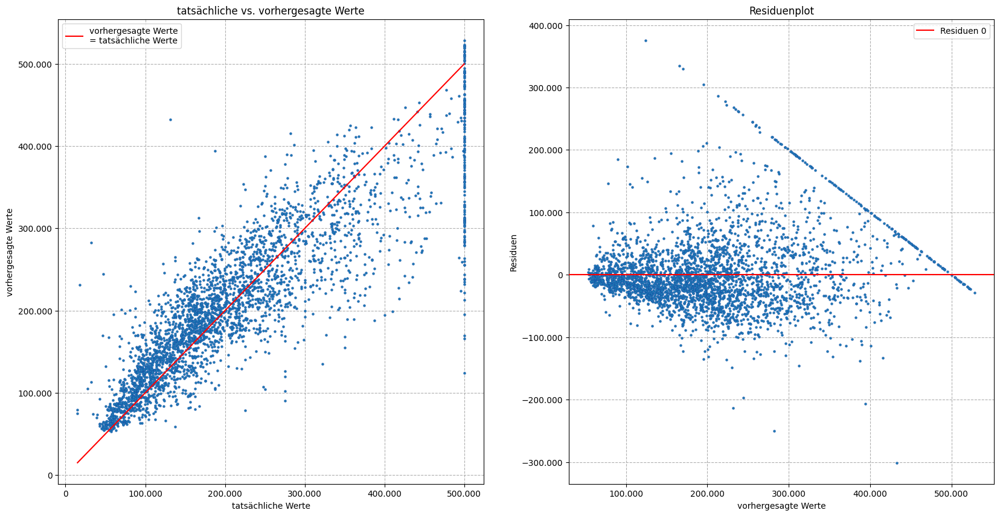

In [123]:
plot_model_scatter(prediction=predict_b4b, validation=y_val_transformed)

Wie bereits bei lightGBM scheinen auch die XGBoost-Ergebnisse stärker gestreut zu sein alsim CatBoost-Modell und die Überbewertung der Preise bis 200.000 ist deutlicher erkennbar, was auch insbesondere den Residuen-Plot etwas nach unten entzerrt. Grundsätzlich sind die Ergebnisse für lightGBM und XGBoost aber relativ ähnlich, was auch auf Basis des RMSE bereits vermutet werden konnte. Die Schätzungen für die Maximalwerte verteilen sich im Gegensatz zu lightGBM aber etwa über den gleichen Bereich, wie im CatBoost-Modell. Dabei scheint der Kern der Schätzungen allerdings über einen etwas weiteren Bereich gestreut zu sein.

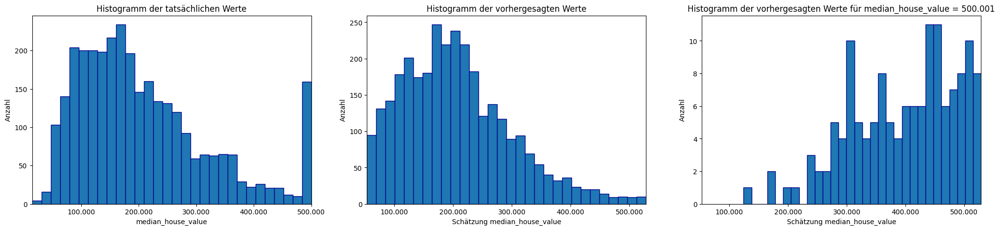

In [124]:
plot_model_hist(prediction=predict_b4b, validation=y_val_transformed)

XGBoost generiert weniger Schätzungen im Bereich unter 100.000 alslightGBM, aber immernoch deutlich mehr als CatBoost. Die Anzahl der Schätzungen zwischen 100.000 und 150.000 ist etwas näher an den tatsächlichen Werte alsbei CatBoost, dafür sind die Schätzungen der Werte zwischen 150.000 und 200.000 anscheinend weiter gestreut und etwas überbewertet. Es fehlt zudem die Stufe zwischen 300.000 und 400.000, die CatBoost zumindest ansatzweise abgebildet hat. Für die Maximalwerte sind die Schätzungen, wie bereits anhand der vorhergehenden Plots vermutet, stärker gestreut. Zudem sind hier mehrere Gruppen im Abstand von 50.000 bis 100.000 erkaennbar, in denen die Schätzungen konzentriert sind.

### Aufgabe B-5: Finale Modellbewertung an Testdaten [Lernziele 4.1 & 6; 4 Punkte]

#### Aufgabenteil B-5a
Das CatBoost-Modell aus Aufgabe A-7 sowie alle im Teil B des Notebooks enthaltenen Modelle sind abschließend mit den Testdaten (sample = C) zu bewerten und die Ergebnisse in den Testdaten abzulegen.

Die Testdaten werden analog zu den Trainings- und Validierungsdaten der zu prüfenden Modelle aus den Gesamtdate extrahiert. Für die Zielvariable wird dabei nur eine einzelne Datenstruktur angelegt, da diese nicht durch die Modelle verarbeitet wird, sondern stattdessen nur mit den (gegebenenfalls zurückskalierten) Ergebnissen der Vorhersagen in der Berechnung des RMSE genutzt wird.

In [125]:
x_test_full = reduced_housing_sample[reduced_housing_sample['sample'] == 'C'].drop(labels=['median_house_value', 'sample'], axis=1)
x_test_transformed = transformed_housing_sample[transformed_housing_sample['sample'] == 'C'].drop(labels=['median_house_value', 'sample'], axis=1)
x_test_transformed_np = np.array(x_test_transformed).astype(np.float32)
x_test_num_transformed_np = np.array(scaled_housing_sample[scaled_housing_sample['sample'] == 'C'].drop(columns=['median_house_value', 'ocean_proximity', 'county_name', 'sample'])).astype(np.float32)
x_test_ocean_transformed_np = factorized_ocean_proximity[factorized_ocean_proximity['sample'] == 'C']['ocean_proximity'].factorize()[0]
x_test_county_transformed_np = factorized_county_name[factorized_county_name['sample'] == 'C']['county_name'].factorize()[0]
x_test_scaled = scaled_housing_sample[scaled_housing_sample['sample'] == 'C'].drop(columns=['median_house_value', 'sample'])

y_test = reduced_housing_sample[reduced_housing_sample['sample'] == 'C']['median_house_value']

Alle Modelle werden auf die (analog den Traiinngsdaten extrahierten) Testdaten angewendet. Der jeweilige RMSE auf den Trainingsdaten wird berechnet, von den Werten der Validierung getrennt abgelegt und anschließend zusammen mit dem RMSE der Validierung ausgegeben.

Zunächste die neuronalen Netze:

In [126]:
model_test_rmse = {}
test_b2b = y_scaler.inverse_transform(model_b2b.predict(x_test_transformed_np)).flatten()
model_test_rmse["Modell B-2b"] = root_mean_squared_error(y_test, test_b2b)
print_model_stats("Modell B-2b")
print_model_stats("Modell B-2b", test=True)
print()
test_b3a = y_scaler.inverse_transform(model_b3a.predict([x_test_num_transformed_np, x_test_ocean_transformed_np, x_test_county_transformed_np])).flatten()
model_test_rmse["Modell B-3a"] = root_mean_squared_error(y_test, test_b3a)
print_model_stats("Modell B-3a")
print_model_stats("Modell B-3a", test=True)
print()
test_b3d = y_scaler.inverse_transform(model_b3d.predict([x_test_num_transformed_np, x_test_ocean_transformed_np, x_test_county_transformed_np])).flatten()
model_test_rmse["Modell B-3d"] = root_mean_squared_error(y_test, test_b3d)
print_model_stats("Modell B-3d")
print_model_stats("Modell B-3d", test=True)

98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 601us/step
RMSE 66724 und Trainingszeit 48.313 Sekunden für Neuronales Netz mit transformierten Merkmalen, 35 Neuronen, L2-Regularisierung und ReLu-Aktivierung
RMSE auf Testdaten 65052 für Neuronales Netz mit transformierten Merkmalen, 35 Neuronen, L2-Regularisierung und ReLu-Aktivierung

98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 870us/step
RMSE 72564 und Trainingszeit 58.379 Sekunden für Neuronales Netz mit transformierten Merkmalen, 35 Neuronen, L2-Regularisierung, RELU-Aktivierung und Embeddings
RMSE auf Testdaten 74692 für Neuronales Netz mit transformierten Merkmalen, 35 Neuronen, L2-Regularisierung, RELU-Aktivierung und Embeddings

98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 654us/step
RMSE 84265 und Trainingszeit 105.366 Sekunden für kopiertes Neuronales Netz mit transformierten Merkmalen, 35 Neuronen, L2-Regularisierung, RELU-Aktivierung und Embeddings
RMSE auf Testdaten 78288 für kopiertes Neuronales Netz mit transformierten Merkmalen, 35 Neuronen, L2-Regularisierung, RELU

Anschließend CatBoost, lightGBM und XGBoost:

In [127]:
test_a7b = model_a7b.predict(x_test_full)
model_test_rmse["Modell A-7b"] = root_mean_squared_error(y_test, test_a7b)
print_model_stats("Modell A-7b")
print_model_stats("Modell A-7b", test=True)

print()

test_b1d = y_scaler.inverse_transform(model_b1d.predict(x_test_transformed).reshape(-1, 1)).flatten()
model_test_rmse["Modell B-1d"] = root_mean_squared_error(y_test, test_b1d)
print_model_stats("Modell B-1d")
print_model_stats("Modell B-1d", test=True)

print()

test_b4a = y_scaler.inverse_transform(model_b4a.predict(x_test_scaled).reshape(-1, 1))
model_test_rmse["Modell B-4a"] = root_mean_squared_error(y_test, test_b4a)
print_model_stats("Modell B-4a")
print_model_stats("Modell B-4a", test=True)

print()

test_b4b = y_scaler.inverse_transform(model_b4b.predict(x_test_scaled).reshape(-1, 1))
model_test_rmse["Modell B-4b"] = root_mean_squared_error(y_test, test_b4b)
print_model_stats("Modell B-4b")
print_model_stats("Modell B-4b", test=True)

RMSE 48471 und Trainingszeit 34.906 Sekunden für CatBoost mit allen Merkmalen
RMSE auf Testdaten 45369 für CatBoost mit allen Merkmalen

RMSE 48461 und Trainingszeit 3.567 Sekunden für CatBoost mit transformierten Merkmalen
RMSE auf Testdaten 46096 für CatBoost mit transformierten Merkmalen

RMSE 56860 und Trainingszeit 249.092 Sekunden für lightGBM mit Grid Search
RMSE auf Testdaten 54795 für lightGBM mit Grid Search

RMSE 57417 und Trainingszeit 163.53 Sekunden für XGBoost mit Randomized Search
RMSE auf Testdaten 55784 für XGBoost mit Randomized Search


Fast alle Modelle zeigen auf den Testdaten einen etwas geringeren RMSE als auf den Validierungsdaten, allerdings treten hier keine extremen Veränderungen auf. Die einzige Auffälligkeit ist die, im Vergleich zu den anderen Modellen, größere Verbesserung des kopierten Neuronalen Netzes, die allerdings immernoch im Rahmen der Schwankungen des Netzes durch unterschiedliche Startgewichte liegt.

#### Aufgabenteil B-5b
Die Modellgüte der Modelle ist grafisch aufzubereiten. Welche Modelle haben die beste Prognosegüte? Gibt es im Hinblick auf Prognosegüte, Optimierungsaufwand und Laufzeit ein besonders geeignetes und empfehlenswertes Modell?

Zuordnung der Modelle:
Modell B-2b: Neuronales Netz mit transformierten Merkmalen, 35 Neuronen, L2-Regularisierung und ReLu-Aktivierung
Modell B-3a: Neuronales Netz mit transformierten Merkmalen, 35 Neuronen, L2-Regularisierung, RELU-Aktivierung und Embeddings
Modell B-3d: kopiertes Neuronales Netz mit transformierten Merkmalen, 35 Neuronen, L2-Regularisierung, RELU-Aktivierung und Embeddings
Modell A-7b: CatBoost mit allen Merkmalen
Modell B-1d: CatBoost mit transformierten Merkmalen
Modell B-4a: lightGBM mit Grid Search
Modell B-4b: XGBoost mit Randomized Search


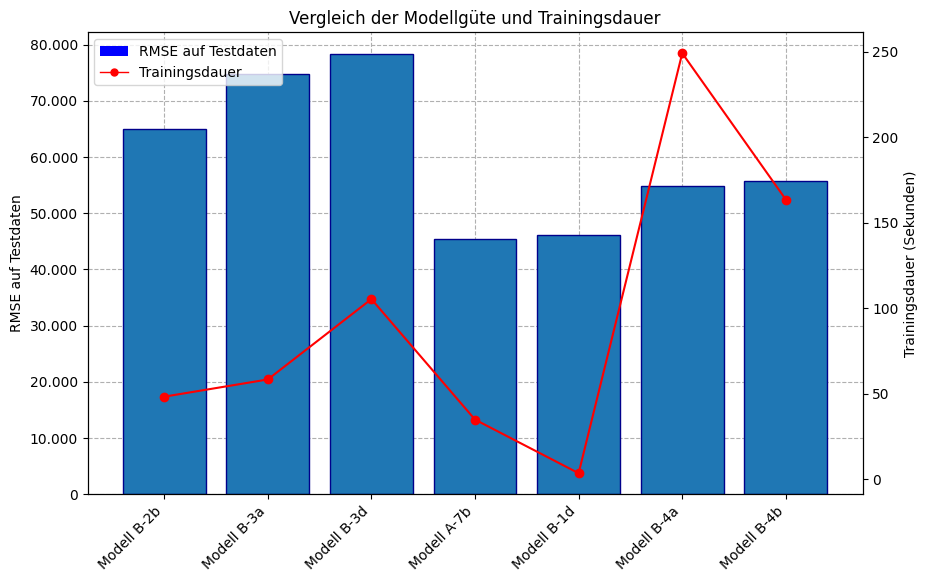

In [128]:
plt.figure(figsize=(10, 6))
plt.bar(model_test_rmse.keys(), model_test_rmse.values(),
        edgecolor='darkblue', zorder=2)
plt.xticks(rotation=45, ha='right')
plt.grid(visible=True, linestyle='--')
plt.ylabel('RMSE auf Testdaten')

model_training_time_selection = {key: model_training_time[key] for key in model_test_rmse.keys()}

plt.twinx()
plt.plot(model_training_time_selection.keys(), 
         model_training_time_selection.values(), 
         color='red', marker='o', linestyle='-')
plt.ylabel('Trainingsdauer (Sekunden)')

proxy_bars = plt.Rectangle((0, 0), 1, 1, 
                           fc="blue", edgecolor='darkblue', 
                           linewidth=0)
proxy_line = plt.Line2D([0], [0], 
                        color='red', marker='o',
                        linestyle='-', markersize=5, linewidth=1)
plt.legend([proxy_bars, proxy_line], ['RMSE auf Testdaten', 'Trainingsdauer'])
plt.title('Vergleich der Modellgüte und Trainingsdauer')

print('Zuordnung der Modelle:')
for model_name in model_test_rmse.keys():
    print(f'{model_name}: {model_description[model_name]}')

Aus dieser Darstellung ist deutlich, dass die Baumverfahren offenischtlich wesentlich bessere Ergebnisse liefern als die relativ einfachen Neuronalen Netze. Dabei tun sich vor allem die CatBoost-Modelle hervor, die den niedrigsten RMSE haben. Beide CatBoost sind dabei mit Default-Einstellungen deutlich schneller als lightGBM und XGBoost, wenn bei den diesen die Laufzeit des Hyperparametertunings mitgezählt wird. Ohne die Parametersuche sind beide jedoch schneller als die beiden CatBoost-Modelle. Zudem ist insbesondere bemerkenswert, dass beide mit den gleichen Daten (numerische Merkmale und kategorielle Merkmalen ohne Encoding) traininert wurden, das CatBoost-Modell ohne Encoding aber deutlich langsamer war alsdas CatBoost mit transformierten Merkmalen. Vermutlich könnte die Dauer des Hyperparametertunings durch geschickte Auswahl des Parameterraums und ein mehrstufiges Verfahren noch beschleunigt und die Modellgüte noch etwas verbessert werden.<br>
Auf Basis der Modellgüte sind beide CatBoost-Modelle zu empfehlen, da es für die Validierungs- und Testdaten keinen signifikanten Unterschied zwischen den RMSE der beiden Ansätze gibt. Berücksichtigt man die Laufzeit, muss zwischen der geringeren Trainingsdauer des CatBoost mit transformierten Daten und dem Aufwand der Transformation abgewogen werden. Im Rahmen der hier durchgeführten Trainings würde das nicht transformierte Modell ausreichen. Wenn allerdings mehr Daten für das Training zur Verfügung stehen und ggf. noch mehr Merkmale berücksichtigt werden sollen, würde der Aufwand für die Transformation weitaus weniger steigen als die Laufzeit des nicht transformierten Modells.

## Teil C: Clustering unter Verwendung von Feuergefährdungszonen [25 Punkte]

### Aufgabe C-1: Erweiterung des Hauptdatensatzes um Feuergefährdungszonen [Lernziele 3.3/3.4, 5.2 & 6; 12 Punkte]

#### Aufgabenteil C-1a
Der Datensatz california_fire_zones.shp ist einzulesen (siehe Anhang 1), im Anschluss sind 10 zufällige Zeilen davon auszugeben. Die absolute Häufigkeitsverteilung der Werte des Merkmals FHSZ ist zu erstellen. Weiter ist eine Funktion zu schreiben, welche für ein gegebenes Polygon die Anzahl an Eckpunkten zurückgibt. Unter Verwendung dieser Funktion ist ein Histogramm zur Anzahl an Eckpunkten der Polygone des eingelesenen Datensatzes zu erstellen, bei welchem die x-Achse logarithmiert dargestellt wird, und zu kommentieren. Schließlich ist ein Plot der Feuergefährdungszonen zu erzeugen und mit einer Karte von Kalifornien zu hinterlegen.

Einlesen der Daten gemäß Anhang 1:

In [129]:
df_fire_zones = gpd.read_file(data_root+'california_fire_zones.shp')

Zunächst wird das aktuell in den Daten verwendete Koordinatensystem geprüft.

In [130]:
print("Koordinatensystem:", df_fire_zones.crs)

Koordinatensystem: EPSG:3857


Dieses Kordinatensystem passt nicht zu den "Standard-" Längen- und Breitengraden, hierfür ist laut https://en.wikipedia.org/wiki/EPSG_Geodetic_Parameter_Dataset EPSG:4326 nötig, also müssen die Daten entsprechend neu codiert werden.

In [131]:
df_fire_zones = df_fire_zones.to_crs(epsg=4326)

Ausgabe von zehn zufälligen Zeilen:

In [132]:
np.random.seed(42)
print(df_fire_zones.sample(10))

      FHSZ FHSZ_Descr     Shape_Leng    Shape_Area                                                                                             geometry
578      2       High   28147.525549  3.858141e+06  POLYGON ((-122.54542 37.90001, -122.54541 37.89978, -122.54507 37.89979, -122.54503 37.89844, -1...
1146     3  Very High   60180.000000  2.027520e+07  POLYGON ((-123.14331 38.56227, -123.14330 38.56200, -123.14296 38.56201, -123.14295 38.56174, -1...
382      2       High   27540.000000  6.157800e+06  POLYGON ((-116.68401 33.81803, -116.68402 33.81776, -116.68338 33.81774, -116.68339 33.81747, -1...
583      2       High   14468.592234  7.746145e+06  POLYGON ((-118.68428 37.93851, -118.69345 37.93845, -118.69351 37.95290, -118.69331 37.95290, -1...
966      3  Very High   36821.003487  3.742586e+06  POLYGON ((-119.62247 34.54963, -119.62297 34.54569, -119.62344 34.54558, -119.62596 34.54614, -1...
1173     3  Very High    8882.258838  3.578957e+06  POLYGON ((-120.65767 38.93253, -120.

Absolute Häufigkeitsverteilung der Werte des Merkmals FHSZ:

In [133]:
print(df_fire_zones['FHSZ'].value_counts())

FHSZ
3    627
2    519
1    361
Name: count, dtype: int64


Datentyp von geometry prüfen:

In [134]:
print(df_fire_zones.dtypes)

FHSZ             int64
FHSZ_Descr      object
Shape_Leng     float64
Shape_Area     float64
geometry      geometry
dtype: object


Es handelt sich also nicht um einfache Strings, sondern ein extra Datentyp zur Darstellung von Geometrie, aus dem die Koordinaten der Eckpunkte als DataFrame extrahiert werden können. 

In [135]:
def count_coords(geometry):
    geometry_df = geometry.boundary.get_coordinates()
    return geometry_df.groupby(geometry_df.index).count()['x']

Statt die Achse des fertigen Plots zu logarithmieren, werden die Anzahlen der Eckpunkte direkt logarithmiert und die Achsenbeschriftung entsprechend angepasst.

Text(0.5, 1.0, 'Histogramm der Anzahl der Eckpunkte')

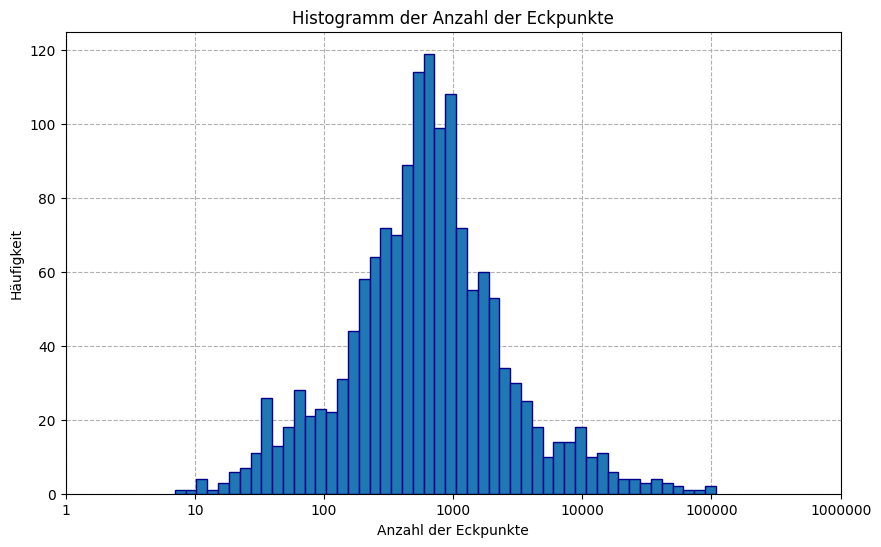

In [136]:
plt.figure(figsize=(10, 6))
np.log10(count_coords(df_fire_zones['geometry'])).hist(bins=50, edgecolor='darkblue', zorder=2)
plt.grid(True, linestyle='--')
plt.xticks(plt.xticks()[0], [10**int(x) for x in plt.xticks()[0]])
plt.xlabel('Anzahl der Eckpunkte')
plt.ylabel('Häufigkeit')
plt.title('Histogramm der Anzahl der Eckpunkte')

Ein Großteil der Polygone hat zwischen mehreren 100 und einigen 1.000 Eckpunkte, bis hin zu 100.000. Vermutlich handelt es sich hierbei also nicht um kleine, einfach strukturierten Gebiete, sondern um größere Regionen mit komplexen Grenzen.

Text(0.5, 1.0, 'Feuergefährdungszonen in Kalifornien')

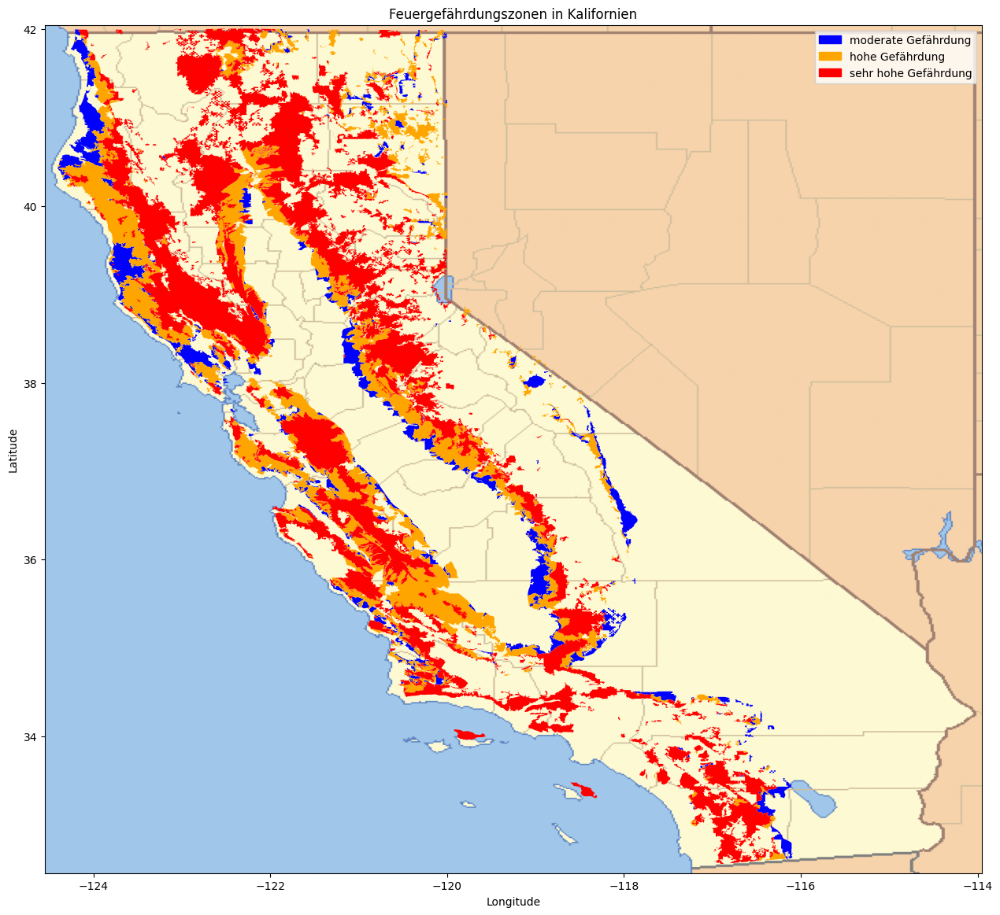

In [137]:
filename = 'california.png'
california_map = plt.imread(Path(img_path) / filename)

plt.figure(figsize=(20, 14))
df_fire_zones[df_fire_zones['FHSZ'] == 1].plot(ax=plt.gca(), color='blue')
df_fire_zones[df_fire_zones['FHSZ'] == 2].plot(ax=plt.gca(), color='orange')
df_fire_zones[df_fire_zones['FHSZ'] == 3].plot(ax=plt.gca(), color='red')
moderate_patch = mpatches.Patch(color='blue', label='moderate Gefährdung')
high_patch = mpatches.Patch(color='orange', label='hohe Gefährdung')
very_high_patch = mpatches.Patch(color='red', label='sehr hohe Gefährdung')
plt.imshow(california_map, extent=[-124.55, -113.95, 32.45, 42.05])
plt.axis([-124.55, -113.95, 32.45, 42.05])
plt.legend(handles=[moderate_patch, high_patch, very_high_patch])
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Feuergefährdungszonen in Kalifornien')

#### Aufgabenteil C-1b
Der Hauptdatensatz, der nach der Bearbeitung von Teil A vorliegt, ist um die in Teilaufgabe a) eingelesenen Feuergefährdungszonen zu erweitern. Zu diesem Zweck soll festgestellt werden, ob und ggf. in welcher Feuergefährdungszone die Longitude-Latitude-Paare der einzelnen Zeilen liegen. Das Resultat ist in der neuen Spalte fire_zone abzuspeichern. Liegt ein Longitude-Latitude-Paar in keiner Feuergefährdungszone, so ist als Wert 0 einzutragen. Liegt ein Longitude- Latitude-Paar in mehr als einer Feuergefährdungszone, so ist eine aktuariell angemessene Lösungsstrategie zu diesem Problem durchzuführen. Schließlich soll das Ergebnis überprüft werden, indem ein geeigneter Scatter-Plot der Daten erzeugt wird.

Zunächst wird aus den Längen- und Breitengraden des Hauptdatensatzes eine geometry-Spalte erzeugt, mit der die Geopandas-Join-Funktion die Datensätze abgleichen kann. Vor dem Join wird der Index des ursprünglichen Hauptdatensatzes für die weitere Verarbeitung gesichert.

In [138]:
joined_data = reduced_housing_sample
joined_data = gpd.GeoDataFrame(reduced_housing_sample, geometry=gpd.points_from_xy(reduced_housing_sample.longitude, 
                                                                                   reduced_housing_sample.latitude), 
                                                                                   crs="EPSG:4326") # https://geopandas.org/en/stable/gallery/create_geopandas_from_pandas.html
joined_data['org_index'] = joined_data.index
joined_data = gpd.sjoin(joined_data,
                        df_fire_zones[['geometry', 'FHSZ']],
                        how='left',
                        predicate='intersects')

In [139]:
print(f'Anzahl Datensätze vor dem Join: {len(reduced_housing_sample)}')
print(f'Anzahl Datensätze nach dem Join: {len(joined_data)}')

Anzahl Datensätze vor dem Join: 20640
Anzahl Datensätze nach dem Join: 20672


Da der Dataframe nach dem Join mehr Datensätze enthält als davor, wurden anscheinend einige Bezirke mehreren __FHSZ__ zugeordnet.

Aus dem gejointen DataFrame werden nun nur der frühere Index und __FHSZ__ verwendet, um zum Einen fehlende Belegungen von __FHSZ__ mit 0 zu füllen und zum Anderen die mehrdeutige Zuordnungen aufzulösen. Dabei wird jeweils dich höchste Einstufung des Bezirks übernommen. Anschließend werden die resultierenden __FHSZ__ wieder dem Hauptdatensatz zugeordnet, wobei nochmal sichergestellt wird, dass die Zuordnung jetzt eindeutig ist.

In [140]:
FHSZ = joined_data[['org_index', 'FHSZ']].fillna(0)
FHSZ = FHSZ.groupby('org_index').max()
joined_data = reduced_housing_sample.join(FHSZ, validate='one_to_one')

Zur Überprüfung der Ergebnisse werden die __FHSZ__ der Bezirke über die Karte von Kalifornien gelegt und mit den "echten" Zonen verglichen. Die Belegung __FHSZ__ = 0 wird dabei als "keine Gefährdung" interpretiert.

Text(0, 0.5, 'Latitude')

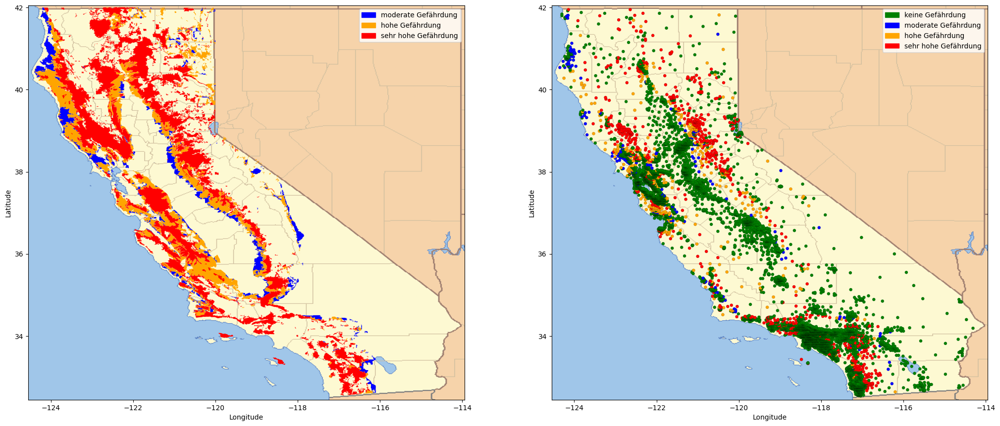

In [141]:
filename = 'california.png'
california_map = plt.imread(Path(img_path) / filename)
no_patch = mpatches.Patch(color='green', label='keine Gefährdung')
moderate_patch = mpatches.Patch(color='blue', label='moderate Gefährdung')
high_patch = mpatches.Patch(color='orange', label='hohe Gefährdung')
very_high_patch = mpatches.Patch(color='red', label='sehr hohe Gefährdung')

fig = plt.figure(figsize=(25, 15))
subfig1 = fig.add_subplot(1, 2, 1)
df_fire_zones[df_fire_zones['FHSZ'] == 1].plot(ax=subfig1, color='blue')
df_fire_zones[df_fire_zones['FHSZ'] == 2].plot(ax=subfig1, color='orange')
df_fire_zones[df_fire_zones['FHSZ'] == 3].plot(ax=subfig1, color='red')
subfig1.imshow(california_map, extent=[-124.55, -113.95, 32.45, 42.05])
subfig1.axis([-124.55, -113.95, 32.45, 42.05])
subfig1.legend(handles=[moderate_patch, high_patch, very_high_patch])
subfig1.set_xlabel('Longitude')
subfig1.set_ylabel('Latitude')

subfig2 = fig.add_subplot(1, 2, 2)
joined_data.plot(kind='scatter', 
                 x='longitude', y='latitude', c='FHSZ', 
                 cmap=ListedColormap(['green', 'blue', 'orange', 'red']), 
                 colorbar=False, 
                 edgecolor='black', linewidth=0.1, 
                 ax=subfig2)
subfig2.imshow(california_map, extent=[-124.55, -113.95, 32.45, 42.05])
subfig2.axis([-124.55, -113.95, 32.45, 42.05])
subfig2.legend(handles=[no_patch, moderate_patch, high_patch, very_high_patch])
subfig2.set_xlabel('Longitude')
subfig2.set_ylabel('Latitude')

### Aufgabe C-2: Einsatz von Clustering bei der Tarifierung von Feuerversicherung [Lernziele 4.2, 5.2 & 6; 13 Punkte]

#### Aufgabenteil C-2a
Um den aus Aufgabe C-1 erhaltenen Datensatz zu clustern, ist der k-Means-Algorithmus anzuwenden. In das Clustering sollen lediglich die Merkmale __latitude__, __longitude__, __median_house_value__ und __fire_zone__ einfließen. Die Wahl der Cluster-Anzahl ist (etwa durch eine geeignete Heuristik) zu begründen. Ein Scatter-Plot zur Visualisierung der Cluster ist zu erzeugen.

Da sich die Größenornungen der zu verwendenden Merkmale stark unterscheiden, würde das Verfahren im Wesentlichen eine Clusterung von __median_house_value__ liefern. Darum wird bei der Selektion der Daten zusätzlich ein StandardScaler Daten angewendet, um die Abstände der einzelnen Merkmale vergleichbar zu machen.

In [142]:
cluster_scaler = StandardScaler()
cluster_input = pd.DataFrame(cluster_scaler.fit_transform(joined_data[['latitude', 'longitude', 'median_house_value', 'FHSZ']]), 
                             columns=['latitude', 'longitude', 'median_house_value', 'FHSZ'])

Nun wird der k-Means-Algorithmus für 1 bis 20 Cluster angewendet, wobei das Clustering jeweils mit 10 verschiedenen Sätzen von Startzentroiden durchgeführt wird. Für jede Clusteranzahl wird die Summe der quadratischen Abstände zum Cluster-Zentrum für die Bewertung extrahiert.

In [143]:
max_cluster_kmeans = 20

sum_of_squared_distances_kmeans = []
for i in range(1, max_cluster_kmeans + 1):
    kmeans = KMeans(n_clusters=i, n_init=10, random_state=42)
    kmeans.fit(cluster_input)
    sum_of_squared_distances_kmeans.append(kmeans.inertia_)

Nun wird die Summe der quadratischen Abstände zum Cluster-Zentrum für alle Cluster-Anzahlen geplottet, um die Clusteranzahl mit der Elbow-Methode auszuwählen.

Text(0.5, 1.0, 'Elbow-Methode zur Bestimmung der Clusteranzahl')

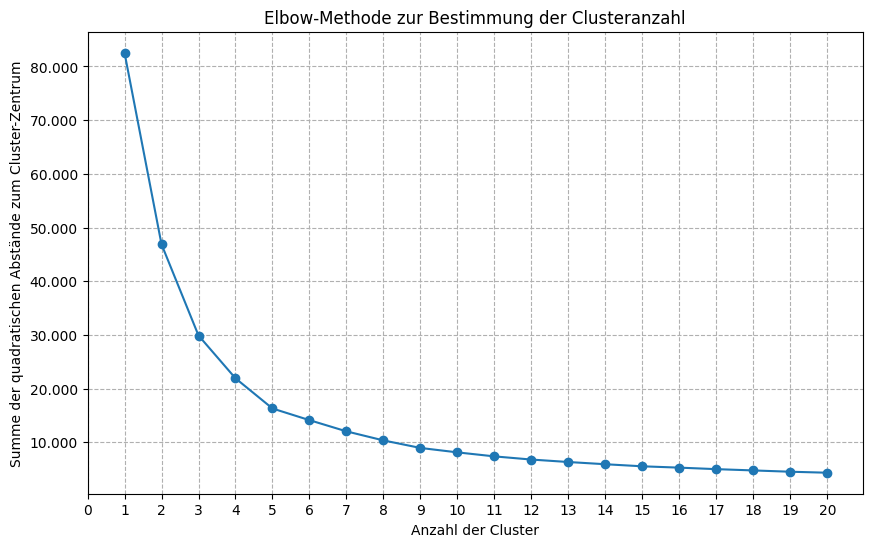

In [144]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_cluster_kmeans + 1),
         sum_of_squared_distances_kmeans,
         marker='o')
plt.grid(visible=True, linestyle='--')
plt.xticks(range(0, max_cluster_kmeans + 1))
plt.xlabel('Anzahl der Cluster')
plt.ylabel('Summe der quadratischen Abstände zum Cluster-Zentrum')
plt.title('Elbow-Methode zur Bestimmung der Clusteranzahl')

Die Verbesserung der Summe der quadratischen Abstände zum Cluster-Zentrum lässt bei mehr als 5 Clustern deutlich nach, weshalb die Cluster-Anzahl nun auf 5 festgelegt und das Clustering damit nochmal wiederholt wird.

In [145]:
n_clusters_kmeans = 5

kmeans = KMeans(n_clusters=n_clusters_kmeans, n_init=10, random_state=42)
kmeans.fit(cluster_input)

KMeans(n_clusters=5, n_init=10, random_state=42)

Zur Visualisierung werden die Datenpunkte wieder über die Karte von Kalifornien gelegt, wobei die Zuordnung zu den Clustern über die Farbe der Punkte abgebildet wird. Zum Vergleich wird der Plot den __FHSZ__ der Bezirke gegenübergestellt. Da die Reihenfolge der Cluster keine inhaltliche Bedeutung hat und insbesondere nicht mit der Anordnung der __FHSZ__ gleichgesetzt werden kann, wird für die Cluster-Zuordnung ein abweichendes Farbschema genutzt.

Text(0, 0.5, 'Latitude')

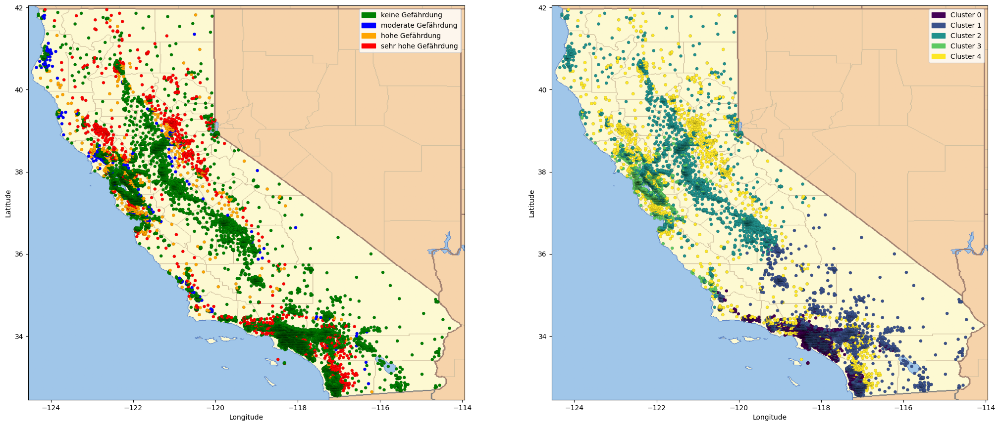

In [146]:
filename = 'california.png'
california_map = plt.imread(Path(img_path) / filename)
no_patch = mpatches.Patch(color='green', label='keine Gefährdung')
moderate_patch = mpatches.Patch(color='blue', label='moderate Gefährdung')
high_patch = mpatches.Patch(color='orange', label='hohe Gefährdung')
very_high_patch = mpatches.Patch(color='red', label='sehr hohe Gefährdung')

cluster_patches = []
for i, c in enumerate(plt.cm.viridis(np.linspace(0, 1, n_clusters_kmeans))):
    cluster_patches.append(mpatches.Patch(color=c, label=f'Cluster {i}'))

fig = plt.figure(figsize=(25, 15))
subfig1 = fig.add_subplot(1, 2, 1)
joined_data.plot(kind='scatter', 
                 x='longitude', y='latitude', c='FHSZ', 
                 cmap=ListedColormap(['green', 'blue', 'orange', 'red']), 
                 colorbar=False, 
                 edgecolor='black', linewidth=0.1, 
                 ax=subfig1)
subfig1.imshow(california_map, extent=[-124.55, -113.95, 32.45, 42.05])
subfig1.axis([-124.55, -113.95, 32.45, 42.05])
subfig1.legend(handles=[no_patch, moderate_patch, high_patch, very_high_patch])
subfig1.set_xlabel('Longitude')
subfig1.set_ylabel('Latitude')


subfig2 = fig.add_subplot(1, 2, 2)
joined_data.plot(kind='scatter', 
                 x='longitude', y='latitude', c=kmeans.labels_, 
                 cmap=ListedColormap(plt.cm.viridis(np.linspace(0, 1, n_clusters_kmeans))), 
                 colorbar=False, 
                 edgecolor='black', linewidth=0.1, 
                 ax=subfig2)
subfig2.imshow(california_map, extent=[-124.55, -113.95, 32.45, 42.05])
subfig2.axis([-124.55, -113.95, 32.45, 42.05])
subfig2.legend(handles=cluster_patches)
subfig2.set_xlabel('Longitude')
subfig2.set_ylabel('Latitude')

#### Aufgabenteil C-2b
Um den aus Aufgabe C-1 erhaltenen Datensatz zu clustern, ist das Verfahren Agglomerative Hierarchical Clustering anzuwenden. In das Clustering sollen lediglich die Merkmale latitude, longitude, median_house_value und fire_zone
einfließen. Die Wahl der Cluster-Anzahl ist (etwa durch eine geeignete Heuristik) zu begründen. Ein Scatter-Plot zur Visualisierung der Cluster ist zu erzeugen.

Analog zu k-Means wird das Agglomerative Hierarchical Clusterun für 1 bis 20 Cluster angewendet, allerdings wird die Summe der quadratischen Abstände zum Cluster-Zentrum nicht automatisch bereitgestellt und muss darum extra berechnet werden. Da es sich um ein agglomeratives Startzentroiden, weshalb keine mehrfache Ausführung für jede Cluster-Anzahl nötig ist.

In [147]:
max_cluster_agglomerative = 20

sum_of_squared_distances_agglomerative = []
for i in range(1, max_cluster_agglomerative + 1):
    agglomerative = AgglomerativeClustering(n_clusters=i)
    agglomerative.fit(cluster_input)

    cluster_distances = []
    for j in range(i):
        cluster_points = cluster_input[agglomerative.labels_ == j]
        distances = np.linalg.norm(cluster_points - cluster_points.mean(axis=0), axis=1)
        cluster_distances.extend(distances)

    sum_of_squared_distances_agglomerative.append(np.sum(np.array(cluster_distances) ** 2))

Zur Bewertung der Clusteranzahl wird wieder die Elbow-Methode genutzt:

Text(0.5, 1.0, 'Elbow-Methode zur Bestimmung der Clusteranzahl')

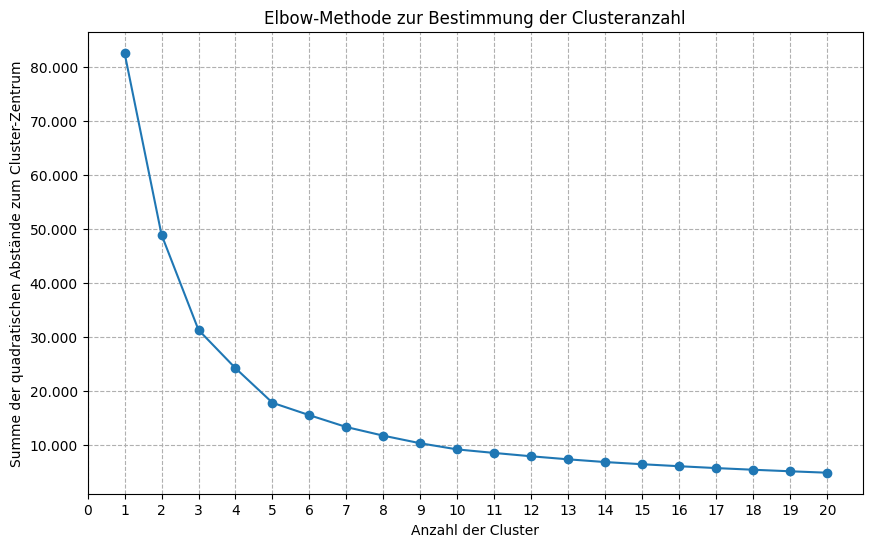

In [148]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, max_cluster_agglomerative + 1),
         sum_of_squared_distances_agglomerative, 
         marker='o')
plt.grid(visible=True, linestyle='--')
plt.xticks(range(0, max_cluster_agglomerative + 1))
plt.xlabel('Anzahl der Cluster')
plt.ylabel('Summe der quadratischen Abstände zum Cluster-Zentrum')
plt.title('Elbow-Methode zur Bestimmung der Clusteranzahl')

Beim agglomerativen Verfahren liegt der Elbow ebenfalls bei 5 Clustern, weshalb auch hier nun das Clustering mit dieser Anzahl wiederholt wird.

In [149]:
n_clusters_agglomerative = 5

agglomerative = AgglomerativeClustering(n_clusters=n_clusters_agglomerative)
agglomerative.fit(cluster_input)

AgglomerativeClustering(n_clusters=5)

Text(0, 0.5, 'Latitude')

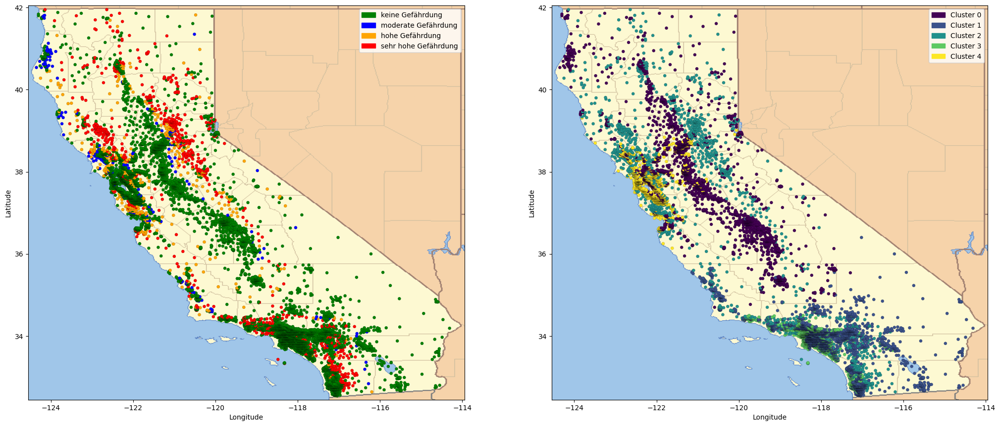

In [150]:
filename = 'california.png'
california_map = plt.imread(Path(img_path) / filename)
no_patch = mpatches.Patch(color='green', label='keine Gefährdung')
moderate_patch = mpatches.Patch(color='blue', label='moderate Gefährdung')
high_patch = mpatches.Patch(color='orange', label='hohe Gefährdung')
very_high_patch = mpatches.Patch(color='red', label='sehr hohe Gefährdung')

cluster_patches = []
for i, c in enumerate(plt.cm.viridis(np.linspace(0, 1, n_clusters_agglomerative))):
    cluster_patches.append(mpatches.Patch(color=c, label=f'Cluster {i}'))

fig = plt.figure(figsize=(25, 15))
subfig1 = fig.add_subplot(1, 2, 1)
joined_data.plot(kind='scatter',
                 x='longitude', y='latitude', c='FHSZ',
                 cmap=ListedColormap(['green', 'blue', 'orange', 'red']),
                 colorbar=False,
                 edgecolor='black', linewidth=0.1,
                 ax=subfig1)
subfig1.imshow(california_map, extent=[-124.55, -113.95, 32.45, 42.05])
subfig1.axis([-124.55, -113.95, 32.45, 42.05])
subfig1.legend(handles=[no_patch, moderate_patch, high_patch, very_high_patch])
subfig1.set_xlabel('Longitude')
subfig1.set_ylabel('Latitude')

subfig2 = fig.add_subplot(1, 2, 2)
joined_data.plot(kind='scatter',
                 x='longitude', y='latitude', c=agglomerative.labels_,
                 cmap=ListedColormap(plt.cm.viridis(np.linspace(0, 1, n_clusters_agglomerative))),
                 colorbar=False,
                 edgecolor='black', linewidth=0.1,
                 ax=subfig2)
subfig2.imshow(california_map, extent=[-124.55, -113.95, 32.45, 42.05])
subfig2.axis([-124.55, -113.95, 32.45, 42.05])
subfig2.legend(handles=cluster_patches)
subfig2.set_xlabel('Longitude')
subfig2.set_ylabel('Latitude')

#### Aufgabenteil C-2c
Die Clusterings der beiden vorherigen Teilaufgaben sind zu vergleichen, indem auf drei Gemeinsamkeiten oder Unterschiede eingegangen wird.

- Beide Verfahren erzeugen jeweils einen Cluster, der über den gesamten Staat hinweg die Bezirke mit hoher und sehr hoher Gefährdung abdeckt (Cluster 4 für k-Means und Cluster 2 für Agglomerative Hierarchical Clustering).
- Beide Verfahren erzeugen jeweils einen Cluster, der hauptsächlich den Streifen ohne __FHSZ__-Einstufung hinter den Küstenregion um San Francisco / San Jose, aber auch die nördlichen Bezirke mit moderater Gefährdung enthält (Cluster 2 für k-Means und Cluster 0 für Agglomerative Hierarchical Clustering).
- Beide Verfahren erzeugen jeweils zwei Cluster für die Bezirke ohne __FHSZ__-Einstufung für die großen Küstenstädte, die dabei jeweils San Francicso / San Jose von Los Angeles / San Diego trennen (Cluster 0 und 3 für k-Means und Cluster 3 und 4 für Agglomerative Hierarchical Clustering). Hier handelt es sich vermutlich um Unterscheidungen nach __median_house_value__.

#### Aufgabenteil C-2d
Ein Ansatz, wie die von einem der Clustering-Verfahren erzeugten Cluster bei der Tarifierung von Feuerversicherung in Kalifornien eingesetzt werden können, ist in zwei bis drei Sätzen zu erläutern.

Die Ergebnisse beider Verfahren bieten im Wesentlichen eine Abgrenzung zwischen keiner bis moderater Gefährdung und hoher bis sehr hoher Gefährdung, separieren bei keiner bis moderater Gefährdung gleichzeitig die teuren Großstädte. Somit könnte das Clustering genutzt werden, um riskante Regionen zu identifizieren, ohne die tatsächliche __FHSZ__ prüfen zu müssen und diese einer strengeren Risikoprüfung zu unterziehen. Gleichzeitig können aber auch teurere Bezirke in den weniger gefährdeten Regionen identifiziert werden, in denen durch die hohen Hauspreise trotz geringerer Brandgefahr höhere Risiken entstehen.

## Teil D: GPU-Ausführung und Vergleiche [25 Punkte]

### Aufgabe D-1: Ergebnisse des CPU-Notebooks persistieren [Lernziele 3.3/3.4; 2 Punkte]

#### Aufgabenteil D-1a
Die in Aufgabe A-0 genannten und im Laufe der Aufgabenlösung befüllten Datenstrukturen für Laufzeiten und Performance sind in csv-Dateien permanent zu sichern.

In [151]:
if not use_gpu:
    pd.DataFrame(model_description.items(), columns=['model', 'description']).to_csv(transfer_path+'model_description.csv', sep=';', index=False)
    pd.DataFrame(model_rmse.items(), columns=['model', 'rmse']).to_csv(transfer_path+'model_rmse.csv', sep=';', index=False)
    pd.DataFrame(model_training_time.items(), columns=['model', 'training_time']).to_csv(transfer_path+'model_training_time.csv', sep=';', index=False)
    pd.DataFrame(model_test_rmse.items(), columns=['model', 'test_rmse']).to_csv(transfer_path+'model_test_rmse.csv', sep=';', index=False)

#### Aufgabenteil D-1b
Die beiden in Aufgabe B-3 erstellten und gefitteten Neuronalen Netze mit Embeddings sind im HDF5-Datenformat zu sichern.

Wegen technischer Probleme beim Import der .hdf5-Dateien werden die Modelle zusätzlich im .keras-Format exportiert.

In [152]:
if not use_gpu:
    save_model(model_b3a, transfer_path + 'model_b3a.hdf5')
    save_model(model_b3d, transfer_path + 'model_b3d.hdf5') 
    save_model(model_b3a, transfer_path + 'model_b3a.keras')
    save_model(model_b3d, transfer_path + 'model_b3d.keras') 